In [47]:
import os, sys
print(sys.executable) # works this time
print(sys.version)
print(sys.version_info)
import scanpy as sc
from sklearn.cross_decomposition import CCA
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from scipy.sparse import csr_matrix
import numpy as np
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import random

I:\mutiomics\pythonProject\.venv\Scripts\python.exe
3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
sys.version_info(major=3, minor=10, micro=11, releaselevel='final', serial=0)


In [48]:
adata1 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\B2.h5ad")
adata2 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\GC\\B1.h5ad")

In [49]:
import anndata
import pandas as pd

# 读取 h5ad 文件

# 提取表达矩阵和位置信息
expression_matrix = adata2.X
positions = pd.DataFrame({
    '0': adata2.obs["spatialX"],
    '1': adata2.obs["spatialY"]
})  # 假设位置信息在 obs 中，列名为 'x' 和 'y'
cluster = adata2.obs["clusters"]
# 将数据保存为 CSV 文件，方便在 R 中读取
#pd.DataFrame(expression_matrix.toarray()).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_expression.csv", index=False)
#pd.DataFrame(positions).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_position.csv", index=False)
#pd.DataFrame(cluster).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_cluster.csv", index=False)


In [50]:
adata1.obs["leiden"] = adata1.obs["clusters"]
adata2.obs["leiden"] = adata2.obs["clusters"]

In [51]:
import matplotlib.pyplot as plt
sc.pl.spatial(adata1, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_9AA_VisiumArray_plot.pdf")
#sc.pl.spatial(adata2, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_visium_ctrl.pdf")

ValueError: When .uns['spatial'][library_id] does not exist, spot_size must be provided directly.

In [52]:
adata1

AnnData object with n_obs × n_vars = 1000 × 2499
    obs: 'barcode', 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'leiden', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [53]:
print(adata1.X.shape)
print(adata1.obsm["spatial"].shape)

(1000, 2499)
(1000, 2)


In [54]:
data1_pca_results = adata1.obsm['spatial']  # PCA 结果
pca_leiden = adata1.obs["leiden"]
data1_leiden_str = pca_leiden.to_numpy()

data2_pca_results = adata2.obsm['X_umap']  # PCA 结果
pca_leiden = adata2.obs["leiden"]
data2_leiden_str = pca_leiden.to_numpy()

def var_select(df, m1, m2, n):
    # 1. 筛选出列均值在 m1 和 m2 之间的行
    filtered_df = df.loc[:,(df.mean() > m1) & (df.mean() < m2)]

    # 2. 计算每行的方差，并选择前 n 个最大值所对应的索引
    variances = filtered_df.var(axis=0)/filtered_df.mean()
    sorted_indices = variances.sort_values(ascending=False).index
    selected_indices = sorted_indices[:n]

    return selected_indices.tolist()


def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
        
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix

In [68]:
#####spatial alignment of data3(metabolic) and data2(spatial) using CCA
def rotate_point_90_degrees(row):
    new_x = -row[0]
    new_y = row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_minus_x(row):
    new_x = -row[0]
    new_y = -row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_plus_x(row):
    new_x = row[1]
    new_y = row[0]
    return pd.Series({0: new_x, 1: new_y})
    
def center_and_scale(data, feature_range=(0, 500)):
    """
    对数据进行中心缩放和范围缩放
    """
    # 中心缩放
    scaler_center = StandardScaler()
    data_centered = scaler_center.fit_transform(data)
    
    # 范围缩放
    scaler_range = MinMaxScaler(feature_range=feature_range)
    data_scaled = scaler_range.fit_transform(data_centered)
    
    return data_scaled
    
from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler(feature_range=(-100, 100))
data3_spatial_results = pd.DataFrame(adata1.obsm['spatial'])
#scaled_data = scaler.fit_transform(data3_spatial_results)
scaled_data = center_and_scale(data3_spatial_results)
data3_spatial_results = pd.DataFrame(scaled_data, columns=data3_spatial_results.columns)
print(data3_spatial_results.head)
data2_spatial_results = pd.DataFrame(adata2.obsm['spatial'])
#data2_spatial_results = positions
#scaled_data = scaler.fit_transform(data2_spatial_results)
scaled_data = center_and_scale(data2_spatial_results)
data2_spatial_results = pd.DataFrame(scaled_data, columns=data2_spatial_results.columns)

data2_spatial_results=pd.DataFrame(data2_spatial_results)
data3_spatial_results=pd.DataFrame(data3_spatial_results)
#data3_spatial_results = data3_spatial_results.apply(rotate_point_90_degrees, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_minus_x, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_plus_x, axis=1)
data1_spatial_results = data3_spatial_results
data1_spatial_results=pd.DataFrame(data1_spatial_results)
#data1_spatial_results = data1_spatial_results +400
#data2_spatial_results = data2_spatial_results +400
#data3_spatial_results = data3_spatial_results +400

<bound method NDFrame.head of               0           1
0    328.834356  320.512821
1    323.926380  419.604701
2    407.770961  357.905983
3    289.775051  265.758547
4     58.077710   54.754274
..          ...         ...
995  199.182004  201.388889
996  303.680982  446.314103
997   54.805726  378.739316
998  287.934560  446.047009
999  246.830266  202.190171

[1000 rows x 2 columns]>


(1000, 2)

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


 (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     313.206077     323.483264           0                1             -1   
1     304.830541     420.763598           1                9             -1   
2     388.391118     360.617155           2                6             -1   
3     301.129723     256.537657           3               11             -1   
4      67.978185      54.654812           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       320.858896       320.512821            48                  3   
1       307.975460       419.337607           442                  1   
2       379.754601       366.452991           880                  9   
3       309.611452       257.211538           693                 12   
4        66.053170        54.754274           456                  5   

   matabolic.CCA.Z  
0      

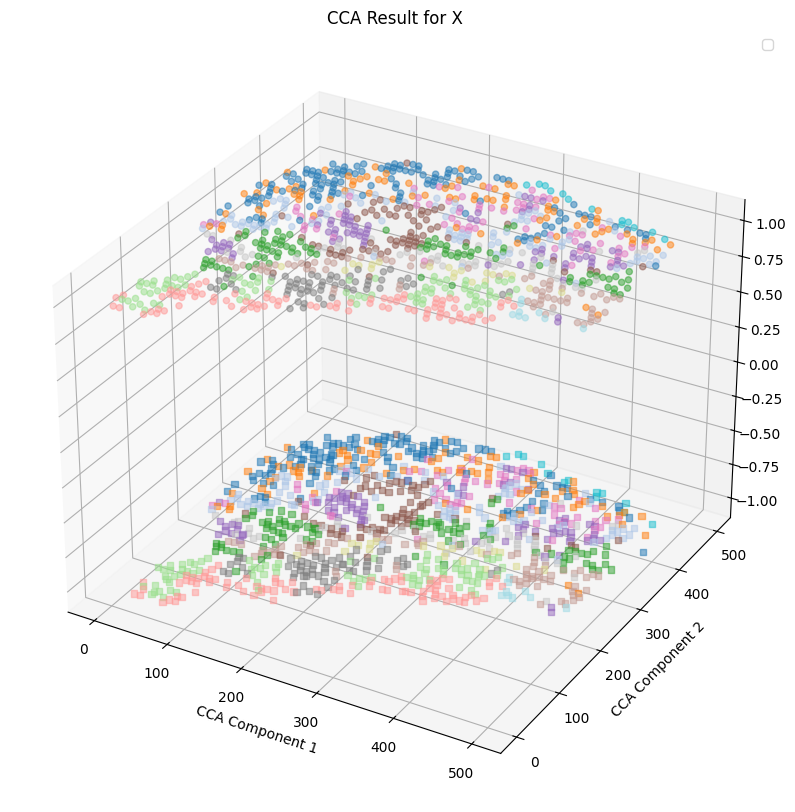

In [69]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [70]:
color_mapping = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'yellow',
    4: 'orange',
    5: 'purple',
    6: 'brown',
    7: 'pink',
    8: 'gray',
    9: 'cyan',
    10: 'magenta',
    11: 'cyan',
    12: 'blue',
    13: 'red',
    14: 'green',
    15: 'yellow'
}

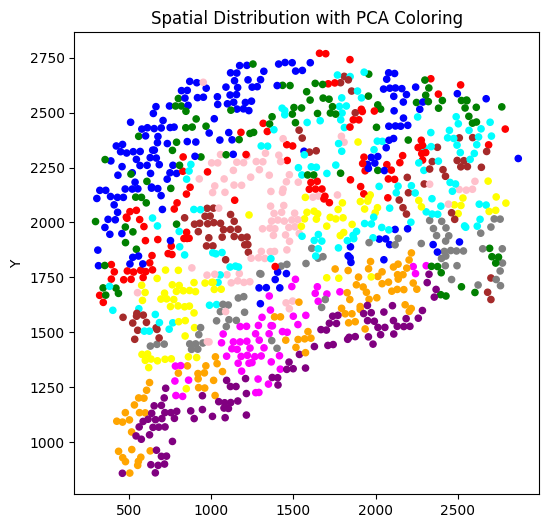

In [71]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\directalignment.pdf")
plt.show()


In [72]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_directmerge = same_values_count_fine

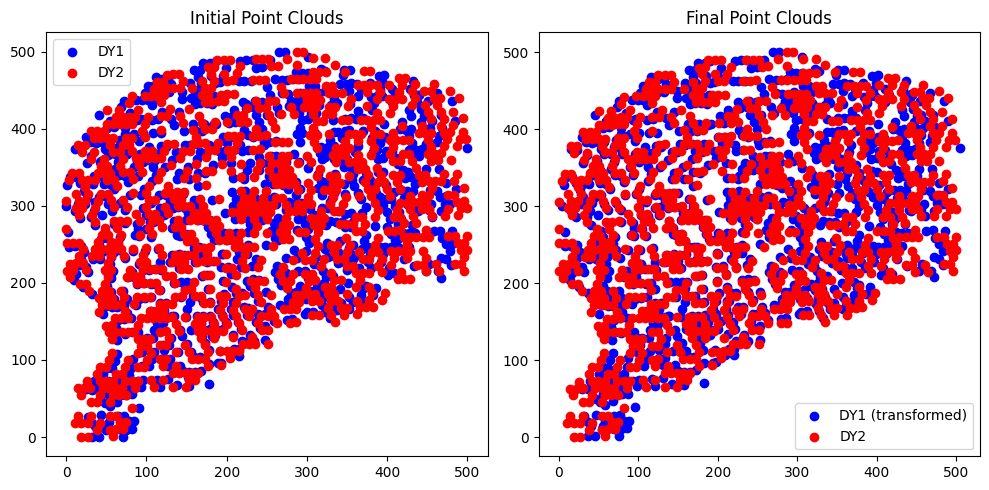

Final transformation matrix:
[[ 7.36122274e-15]
 [-5.94013727e-15]]


In [73]:
#####direct_ICP
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

DY1 = data2_spatial_results.T.to_numpy()  # Example DYGW1 features
DY2 = data3_spatial_results.T.to_numpy()  # Example DYGW2 features

transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\4280202264.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     317.869165     324.310779           0                1             -1   
1     309.493629     421.591114           1                9             -1   
2     393.054206     361.444670           2                6             -1   
3     305.792811     257.365172           3               11             -1   
4      72.641272      55.482327           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       320.858896       320.512821            48                  3   
1       307.975460       419.337607           442                  1   
2       403.680982       366.987179           218                  6   
3       309.611452       257.211538           693                 12   
4        74.028630        55.021368           255                  5   

   matabolic.CCA.Z 

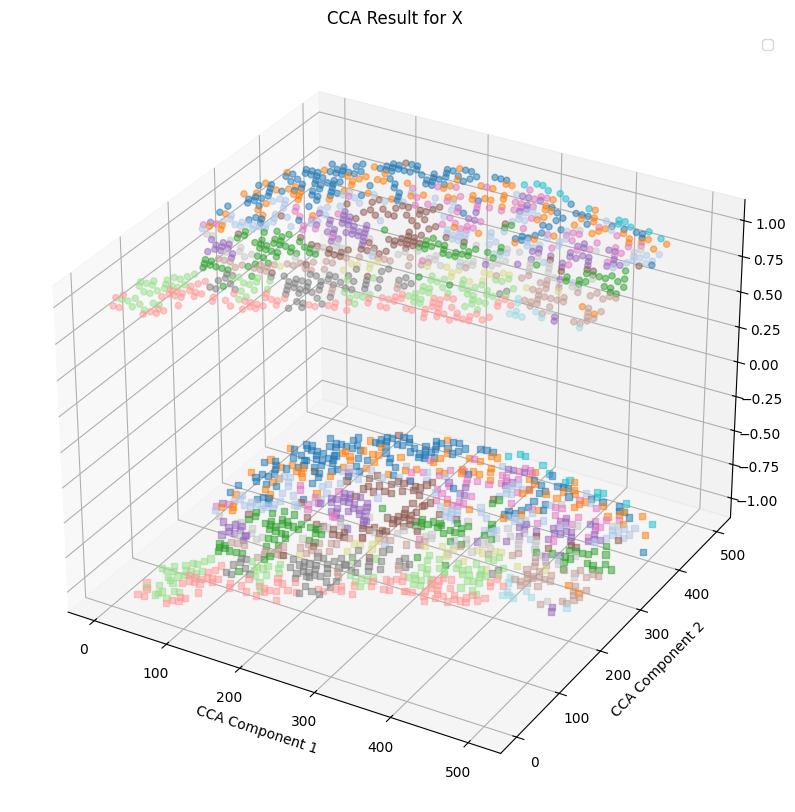

In [74]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

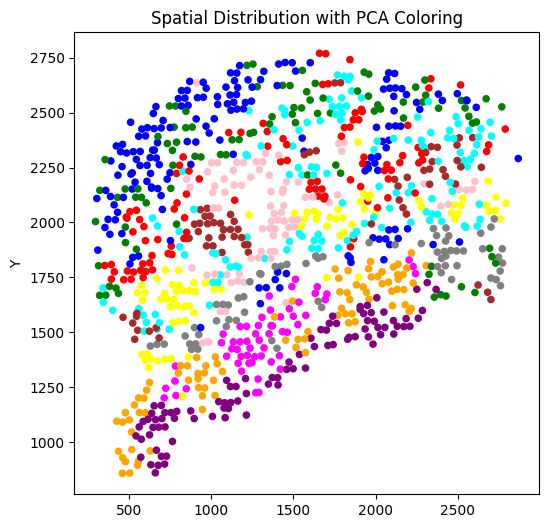

In [75]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\directalignment.pdf")
plt.show()


In [76]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_ICP = same_values_count_fine

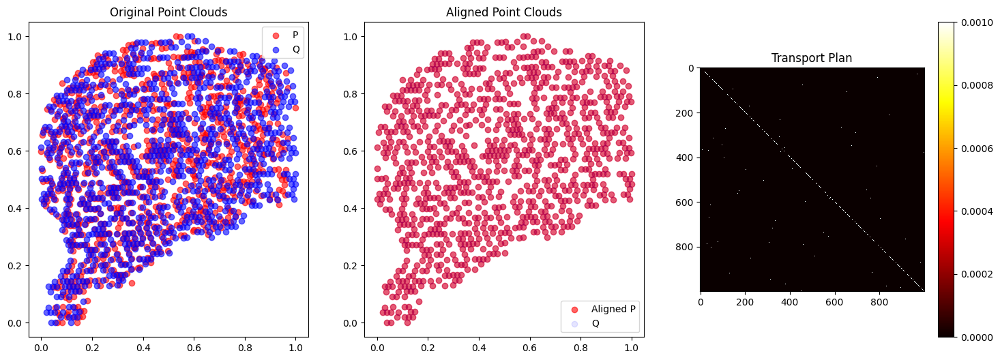

In [77]:
import numpy as np
import ot
import matplotlib.pyplot as plt

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
P = data2_spatial_results.to_numpy()  # Example DYGW1 features
Q = data3_spatial_results.to_numpy()  # Example DYGW2 features

# 特征矩阵（这里假设特征与坐标相同）
F_P = P
F_Q = Q

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M,C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)
scaler = StandardScaler()
P_aligned = scaler.fit_transform(P_aligned)
scaler = MinMaxScaler()
P_aligned = scaler.fit_transform(P_aligned)


# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.1)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()


C:\Users\28123\AppData\Local\Temp\ipykernel_16672\2150073477.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0       0.641718       0.641026           0                1             -1   
1       0.615951       0.838675           1                9             -1   
2       0.815542       0.715812           2                6             -1   
3       0.619223       0.514423           3               11             -1   
4       0.116155       0.109509           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0         0.641718         0.641026            48                  3   
1         0.615951         0.838675           442                  1   
2         0.815542         0.715812             2                  6   
3         0.619223         0.514423           693                 12   
4         0.116155         0.109509             4                  5   

   matabolic.CCA.Z 

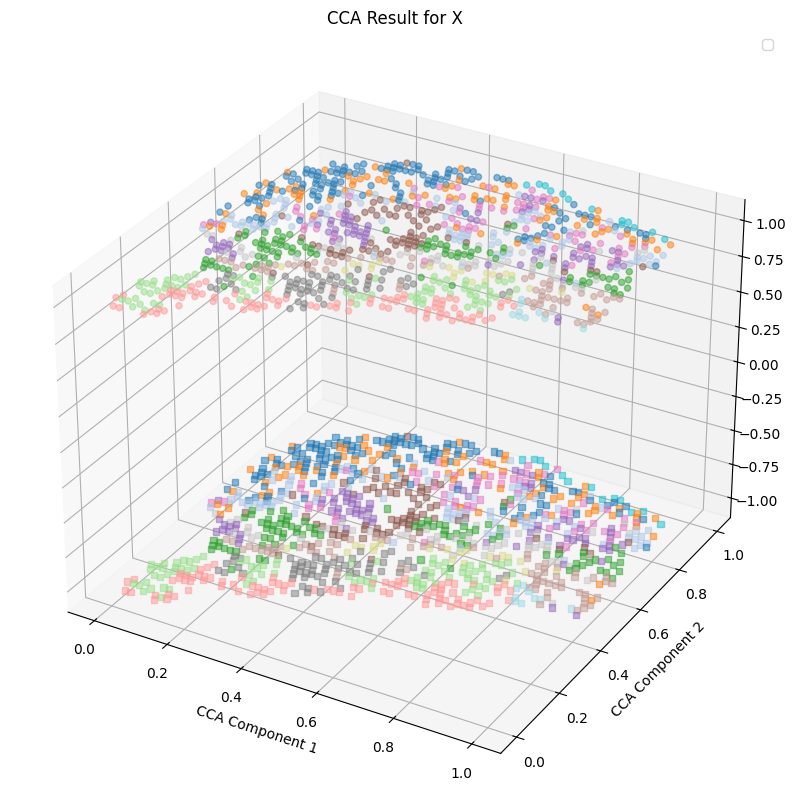

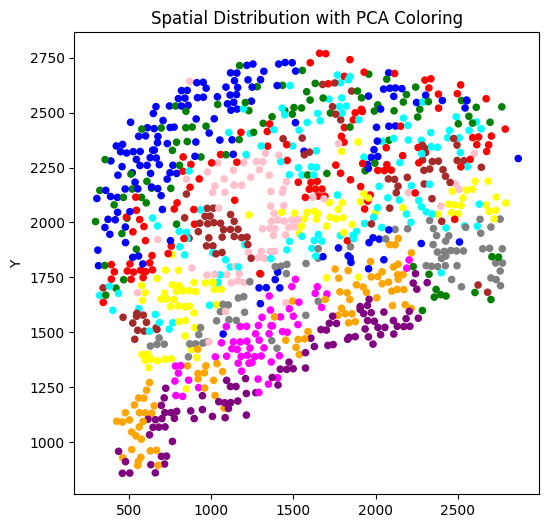

In [78]:
Y_c = pd.DataFrame(P_aligned)
Z_c = pd.DataFrame(Q)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\FPWalignment.pdf")
plt.show()
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_FPWmerge = same_values_count_fine

In [79]:
accruracy_FPWmerge

724

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1856930868.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)


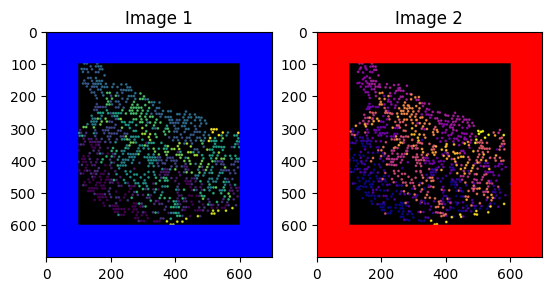

Transformation Matrix:
 [[ 1.04592048e+00  4.92142266e-02 -2.54330763e+01]
 [-1.01175706e-02  1.01778329e+00 -2.91843909e-01]]


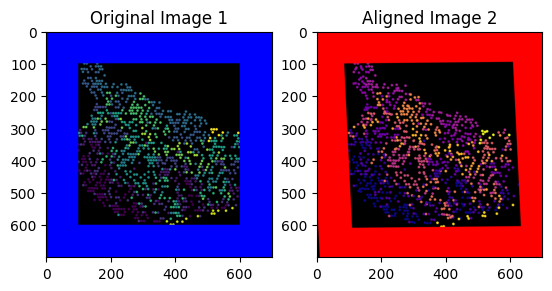

              0           1
0    327.589022  326.541705
1    323.616455  425.636744
2    408.054112  363.575269
3    311.663441  258.527768
4     57.869964   55.413708
..          ...         ...
995  197.943911  203.975045
996  334.216696  438.315702
997   52.995003  380.323946
998  287.609024  452.346897
999  245.705483  205.376998

[1000 rows x 2 columns]
              0           1
0    327.589022  326.541705
1    323.616455  425.636744
2    408.054112  363.575269
3    311.663441  258.527768
4     57.869964   55.413708
..          ...         ...
995  197.943911  203.975045
996  334.216696  438.315702
997   52.995003  380.323946
998  287.609024  452.346897
999  245.705483  205.376998

[1000 rows x 2 columns]


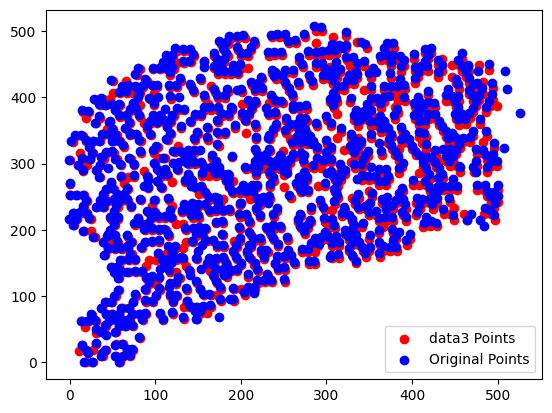

In [80]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def create_image_from_data(data, width=500, height=500, dot_size=5, border_size=50, dot_colors=None, border_color=(0, 0, 0), colormap='viridis'):
    """
    Create an image from 2D data points with specified dot size, border size, and colors.

    Parameters:
    - data: 2D numpy array where data[0] contains x coordinates and data[1] contains y coordinates
    - width: Width of the image
    - height: Height of the image
    - dot_size: Size of the dots
    - border_size: Size of the border around the image
    - dot_colors: List of scalar values for each dot, which will be mapped to colors using a colormap
    - border_color: Color of the border (BGR format)
    - colormap: Colormap to use for mapping scalar values to colors
    
    Returns:
    - bordered_image: Image with data points and border
    """
    # Initialize an empty image with three channels for color
    image = np.zeros((height, width, 3), dtype=np.uint8)

    # Normalize data points to image dimensions
    x_norm = np.interp(data[0], (data[0].min(), data[0].max()), (0, width-1))
    y_norm = np.interp(data[1], (data[1].min(), data[1].max()), (0, height-1))

    # Normalize dot_colors to [0, 1] range
    if dot_colors is not None:
        norm = plt.Normalize(vmin=min(dot_colors), vmax=max(dot_colors))
        cmap = cm.get_cmap(colormap)
        mapped_colors = cmap(norm(dot_colors))

    # Draw circles at normalized positions
    for i, (x, y) in enumerate(zip(x_norm, y_norm)):
        if dot_colors is not None:
            color = (mapped_colors[i][:3] * 255).astype(int)  # Convert to BGR format
            color = tuple(map(int, color[::-1]))  # Convert from RGB to BGR
        else:
            color = (255, 255, 255)  # Default white color
        cv2.circle(image, (int(x), int(y)), dot_size, color, -1)  # -1 means filled circle

    # Add border
    bordered_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, 
                                        cv2.BORDER_CONSTANT, value=border_color)

    return bordered_image

# Simulated scalar values
dot_colors_1 = data1_leiden_str.astype(int)
dot_colors_2 = data2_leiden_str.astype(int)

# Create images
border_size = 100
img1 = create_image_from_data(data3_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_1, border_color=(255, 0, 0), colormap='viridis')
img2 = create_image_from_data(data2_spatial_results, width=500, height=500, dot_size=4, border_size=border_size, dot_colors=dot_colors_2, border_color=(0, 0, 255), colormap='plasma')

# Display images using matplotlib
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title('Image 2')

plt.show()


import cv2
import numpy as np
import matplotlib.pyplot as plt

# Lists to store points
points_image1 = []
points_image2 = []

def click_event_image1(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image1.append((x, y))
        cv2.circle(img1_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 1', img1_display)

def click_event_image2(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image2.append((x, y))
        cv2.circle(img2_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 2', img2_display)

def compute_affine_transform(points_image1, points_image2):
    pts1 = np.float32(points_image1)
    pts2 = np.float32(points_image2)
    M = cv2.getAffineTransform(pts2[:3], pts1[:3])  # Use the first 3 points for affine transform
    return M

def warp_image(image, M, output_shape):
    warped_image = cv2.warpAffine(image, M, output_shape)
    return warped_image

# Load images
img1_display = img1.copy()
img2_display = img2.copy()

# Display images and set mouse callbacks
cv2.imshow('Image 1', img1_display)
cv2.imshow('Image 2', img2_display)
cv2.setMouseCallback('Image 1', click_event_image1)
cv2.setMouseCallback('Image 2', click_event_image2)

# Wait until 6 points are selected (3 from each image)
while len(points_image1) < 3 or len(points_image2) < 3:
    cv2.waitKey(1)

cv2.destroyAllWindows()

# Compute the transformation matrix
M = compute_affine_transform(points_image1, points_image2)
print("Transformation Matrix:\n", M)

# Apply the transformation to the second image
rows, cols = img1.shape[:2]
aligned_image = warp_image(img2, M, (cols, rows))

# Display the original and aligned images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.show()

M_homogeneous = np.vstack([M, [0, 0, 1]])

# Convert DataFrame to homogeneous coordinates
coordinates_data3 = data3_spatial_results  # Add a column of 1s
coordinates_data2 = data2_spatial_results  # Add a column of 1s

def apply_affine_transform_2d(coordinates, transformation_matrix):
    """
    对二维坐标应用仿射变换
    """
    # 添加齐次坐标
    homogeneous_coordinates = np.hstack([coordinates, np.ones((coordinates.shape[0], 1))])
    
    # 应用仿射变换
    transformed_coordinates = np.dot(homogeneous_coordinates, transformation_matrix.T)
    
    return transformed_coordinates[:, :2]

transformed_coordinates_data2 = apply_affine_transform_2d(coordinates_data2+border_size, M_homogeneous)
transformed_coordinates_data2 = pd.DataFrame(transformed_coordinates_data2-border_size)
# Apply the transformation matrix
#transformed_coordinates_data3 = coordinates_data3.dot(M_homogeneous.T)
#transformed_coordinates_data2 = coordinates_data2.dot(M)
# Update the DataFrame with the transformed coordinates
#print(transformed_coordinates_data2)
#print(data3_spatial_results)
#plt.title('Original Points')
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], color='red', label='data3 Points')
plt.scatter(transformed_coordinates_data2[0], transformed_coordinates_data2[1], color='blue', label='Original Points')


plt.legend()

print(transformed_coordinates_data2)
data2_spatial_results = transformed_coordinates_data2.iloc[:,0:2]
print(data2_spatial_results)

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\3934839348.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     327.589022     326.541705           0                1             -1   
1     323.616455     425.636744           1                9             -1   
2     408.054112     363.575269           2                6             -1   
3     311.663441     258.527768           3               11             -1   
4      57.869964      55.413708           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       332.719836       329.594017           172                  3   
1       327.607362       428.685897           644                  1   
2       403.680982       366.987179           218                  6   
3       309.611452       257.211538           693                 12   
4        58.077710        54.754274             4                  5   

   matabolic.CCA.Z 

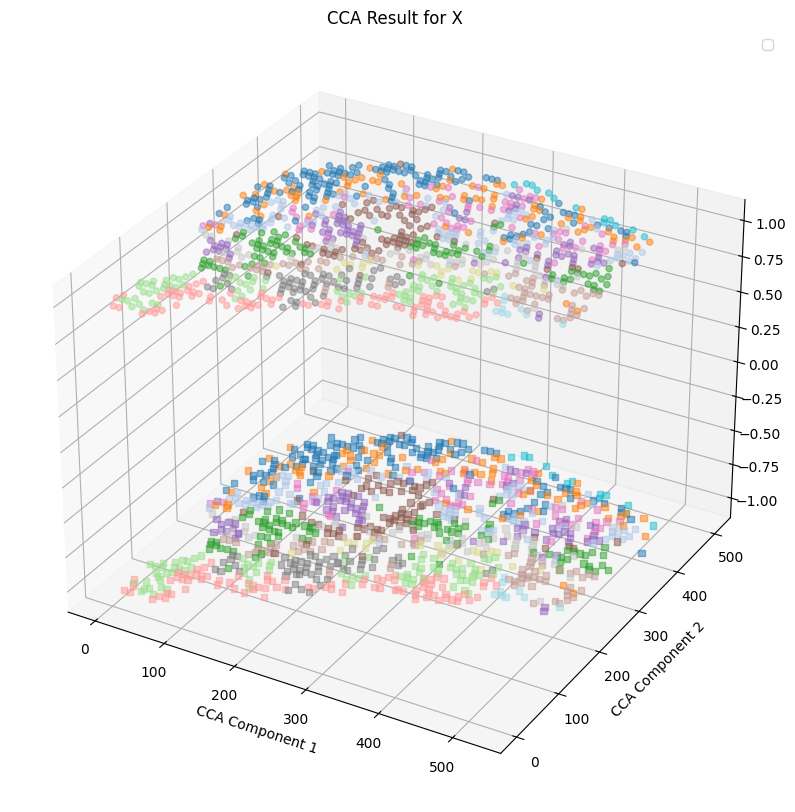

In [81]:
Y_c = data2_spatial_results
Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

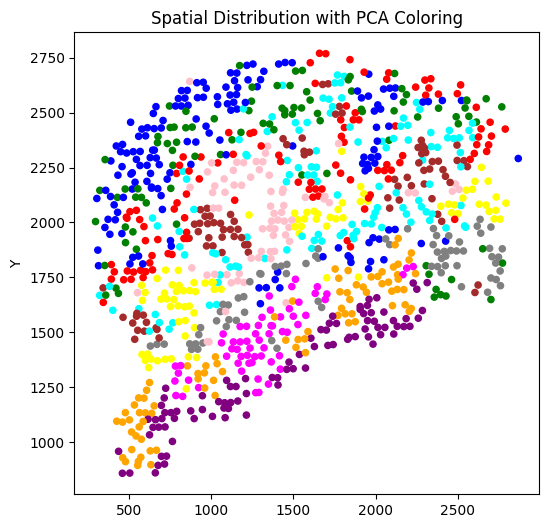

In [82]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\grossalignment.pdf")
plt.show()


In [83]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_grossalignment = same_values_count_fine

In [84]:
X_c=pd.DataFrame(data1_spatial_results)
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)

In [85]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.optimize import minimize
import matplotlib.pyplot as plt

def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})
    new_df = pd.merge(new_df, df[['spatial_ID', "spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')
    return new_df

def perform_transformations(DF2, DF3, Y_c, Z_c, data2_leiden_str, data1_leiden_str):
    transform_matrix = np.array([[1., 0., 0.], [0., 1., 0.], [0., 0., 1.]])
    max_runs = 100
    run_count = 0
    while run_count < max_runs:
        run_count += 1
        distances = cdist(DF3, DF2, metric='euclidean')
        dist_df = pd.DataFrame(distances)
        
        row_indices, col_indices = np.where(distances < dist_min)
        unique_row_indices = np.unique(row_indices)
        unique_col_indices = np.unique(col_indices)
        
        Y_C_ = Y_c.iloc[col_indices, :]
        Y_C_['spatial_ID'] = Y_C_.index
        Y_C_ = Y_C_.reset_index()
        Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
        Y_C_["spatial.CCA.Z"] = -1
        Y_C_ = Y_C_.drop(columns=['index'])
        Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1: "spatial.CCA.Y"})
        
        Z_C_ = Z_c.iloc[row_indices, :]
        Z_C_['matabolic_ID'] = Z_C_.index
        Z_C_ = Z_C_.reset_index()
        Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
        Z_C_ = Z_C_.drop(columns=['index'])
        Z_C_["matabolic.CCA.Z"] = 1
        Z_C_ = Z_C_.rename(columns={0: "metabolic.CCA.X", 1: "metabolic.CCA.Y"})
        
        pairs = pd.concat([Y_C_, Z_C_], axis=1)
        pairs["distance"] = dist_df.iloc[row_indices, col_indices].values.diagonal()
        
        data = pairs
        df = pd.DataFrame(data)
        result_df = main(df)
        filtered_spatial_ids = result_df[result_df["Simpson_Index"] < 1.1]["spatial_ID"]
        
        if filtered_spatial_ids.empty:
            break

        dist_df = pd.DataFrame(distances)
        dist_df = dist_df.iloc[:,DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy()]
        min_row_indices = dist_df.idxmin()
        print(f"min_row_indices",min_row_indices.shape)
        df2 = DF2.iloc[DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy(),:].rename(columns = {
            0:"x",
            1:"y",
        })
        df3 =DF3.iloc[min_row_indices,:].rename(columns = {
            0:"x",
            1:"y",
        })


        def loss_function(params, df2, df3):
            tx, ty, theta = params
            translation_matrix = np.array([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
            rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0], [0, 0, 1]])
            transform_matrix = translation_matrix.dot(rotation_matrix)
            ones = np.ones((df2.shape[0], 1))
            df2_homogeneous = np.hstack([df2, ones])
            df2_transformed = df2_homogeneous.dot(transform_matrix.T)
            total_distance = 0
            for point, point1 in zip(df2_transformed[:, :2], df2):
                distances = np.linalg.norm(df3 - point, axis=1)
                distances2 = np.linalg.norm(point - point1)
                total_distance += np.sum(distances) + distances2*0
            return total_distance

        initial_params = [0, 0, 0]
        result = minimize(loss_function, initial_params, args=(df2.values, df3.values), method='L-BFGS-B')

        optimal_params = result.x
        tx_opt, ty_opt, theta_opt = optimal_params
        translation_matrix_opt = np.array([[1, 0, tx_opt], [0, 1, ty_opt], [0, 0, 1]])
        rotation_matrix_opt = np.array([[np.cos(theta_opt), -np.sin(theta_opt), 0], [np.sin(theta_opt), np.cos(theta_opt), 0], [0, 0, 1]])
        transform_matrix_opt = translation_matrix_opt.dot(rotation_matrix_opt)

        print("Optimal Translation and Rotation Parameters:")
        print("Translation: (", tx_opt, ",", ty_opt, ")")
        print("Rotation (radians):", theta_opt)
        print("Transform Matrix:\n", transform_matrix_opt)

        ones = np.ones((df2.shape[0], 1))
        df2_homogeneous = np.hstack([df2.values, ones])
        df2_transformed = df2_homogeneous.dot(transform_matrix_opt.T)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(df2['x'], df2['y'], label='df2 (original)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Original Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(df2_transformed[:, 0], df2_transformed[:, 1], label='df2 (transformed)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Transformed Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.tight_layout()
        plt.show()

        ones = np.ones((DF2.shape[0], 1))
        df2_homogeneous = np.hstack([DF2.values, ones])
        DF2 = df2_homogeneous.dot(transform_matrix_opt.T)
        DF2 = pd.DataFrame(DF2)
        DF2 = DF2.iloc[:, 0:2]

        if np.allclose(transform_matrix_opt, np.eye(3), atol=1e-3):
            break

    return DF2

# 调用函数并获取结果



C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (971,)
Optimal Translation and Rotation Parameters:
Translation: ( -5.707118209531432e-06 , -2.9907558108296886e-05 )
Rotation (radians): -0.004891235729103106
Transform Matrix:
 [[ 9.99988038e-01  4.89121623e-03 -5.70711821e-06]
 [-4.89121623e-03  9.99988038e-01 -2.99075581e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


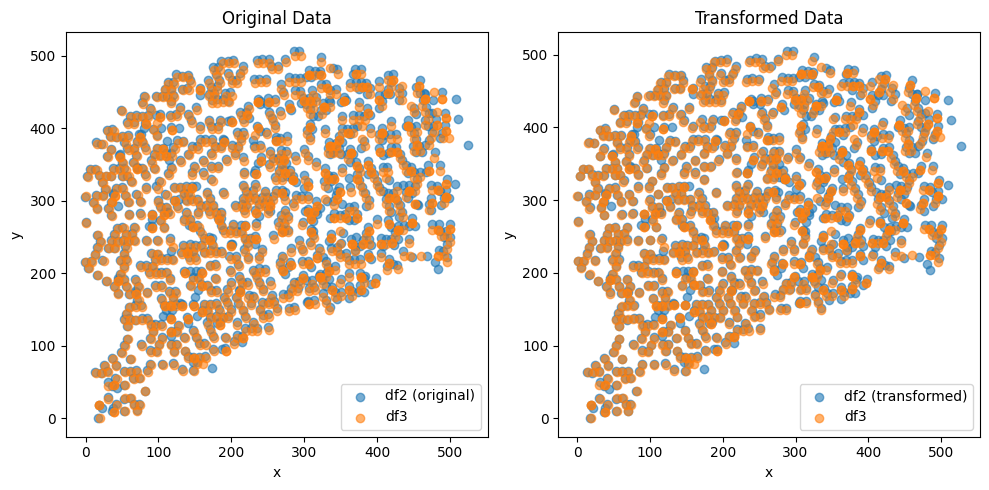

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (921,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.1110889054353053e-05 , -2.6098781436180656e-05 )
Rotation (radians): -0.0031525648574389246
Transform Matrix:
 [[ 9.99995031e-01  3.15255964e-03 -1.11108891e-05]
 [-3.15255964e-03  9.99995031e-01 -2.60987814e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


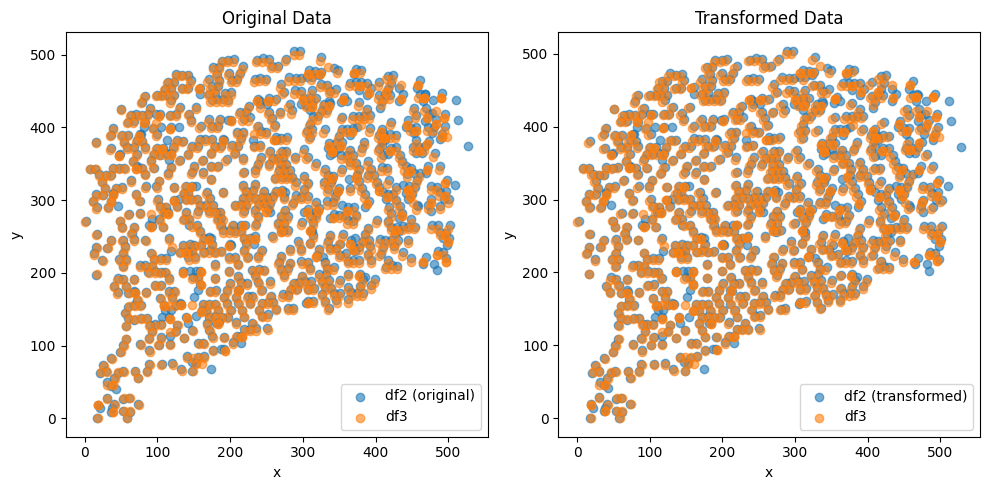

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (918,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.5604585880517663 , -1.86525443724837 )
Rotation (radians): -0.00011380393109325737
Transform Matrix:
 [[ 9.99999994e-01  1.13803931e-04 -1.56045859e+00]
 [-1.13803931e-04  9.99999994e-01 -1.86525444e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


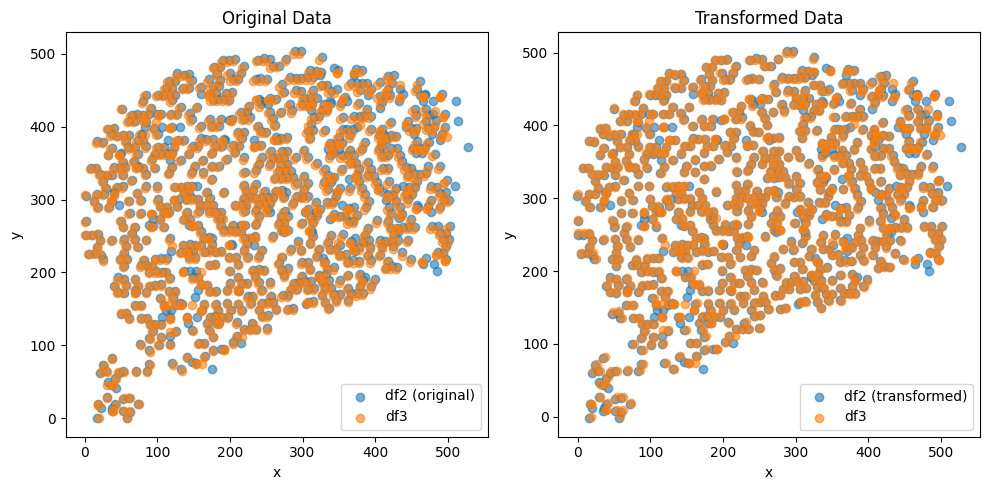

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (750,)
Optimal Translation and Rotation Parameters:
Translation: ( -7.294057748839776e-07 , -1.1414627061458216e-06 )
Rotation (radians): -0.00021120539435862977
Transform Matrix:
 [[ 9.99999978e-01  2.11205393e-04 -7.29405775e-07]
 [-2.11205393e-04  9.99999978e-01 -1.14146271e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


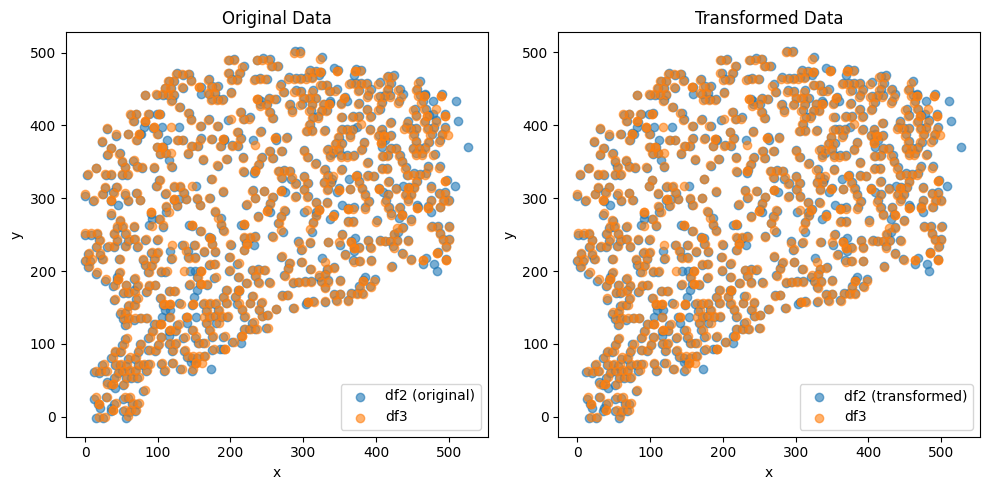

              0           1
0    328.749414  321.923789
1    325.606283  421.048604
2    409.521609  358.282667
3    312.255201  254.045511
4     56.770808   53.062489
..          ...         ...
995  198.083118  200.446384
996  336.312260  433.638408
997   54.615098  378.002146
998  289.823643  448.059158
999  245.854749  201.448586

[1000 rows x 2 columns]


In [86]:
dist_min = 1  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (337,)


C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( -5.213768832710643e-05 , -4.4089154216108746e-05 )
Rotation (radians): 0.00027398203268450016
Transform Matrix:
 [[ 9.99999962e-01 -2.73982029e-04 -5.21376883e-05]
 [ 2.73982029e-04  9.99999962e-01 -4.40891542e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


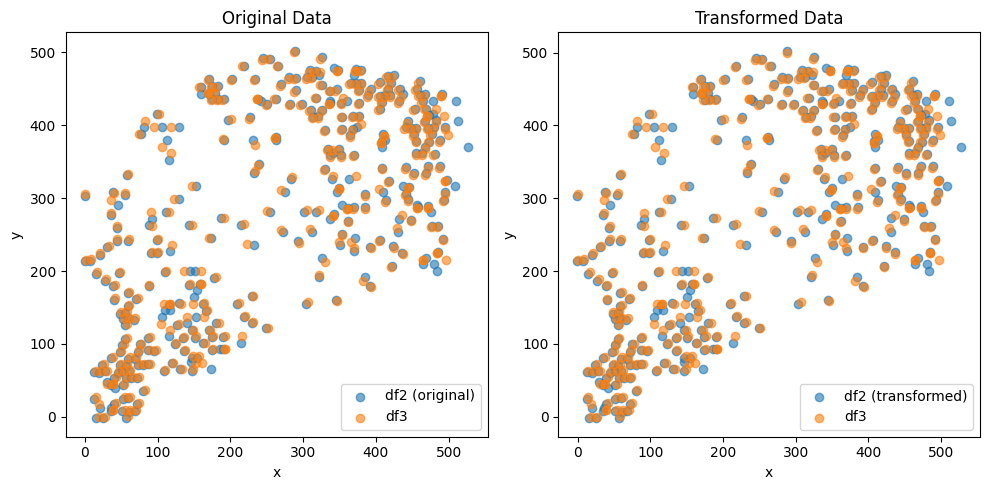

              0           1
0    328.661148  322.013805
1    325.490859  421.137754
2    409.423379  358.394812
3    312.185533  254.131010
4     56.756216   53.077997
..          ...         ...
995  198.028139  200.500604
996  336.193387  433.730491
997   54.511478  378.017051
998  289.700820  448.138503
999  245.799494  201.515894

[1000 rows x 2 columns]


In [87]:
dist_min = 2  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (124,)
Optimal Translation and Rotation Parameters:
Translation: ( 8.149578341856847e-06 , 2.0860773415403302e-05 )
Rotation (radians): 0.0029293690340726317
Transform Matrix:
 [[ 9.99995709e-01 -2.92936484e-03  8.14957834e-06]
 [ 2.92936484e-03  9.99995709e-01  2.08607734e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


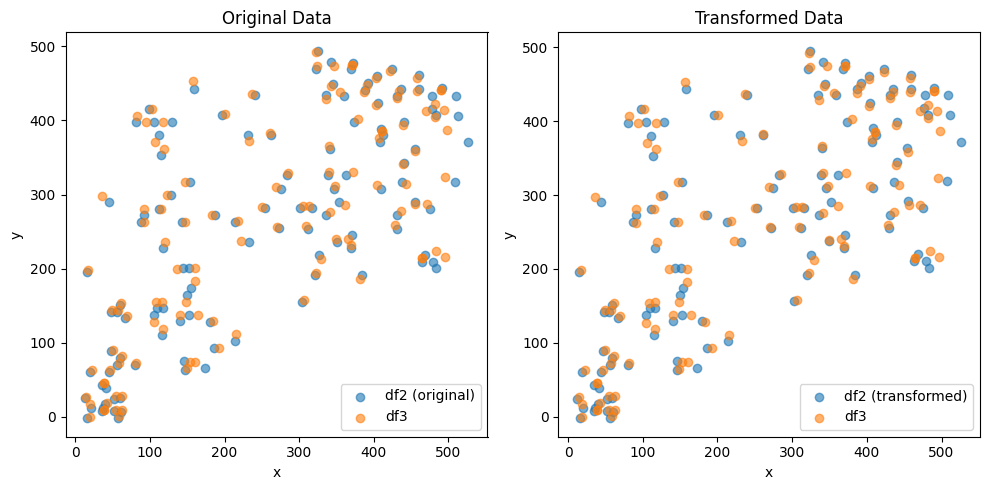

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (218,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.1399760692181828e-05 , -2.245088520537119e-05 )
Rotation (radians): -0.002556194527185091
Transform Matrix:
 [[ 9.99996733e-01  2.55619174e-03 -2.13997607e-05]
 [-2.55619174e-03  9.99996733e-01 -2.24508852e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


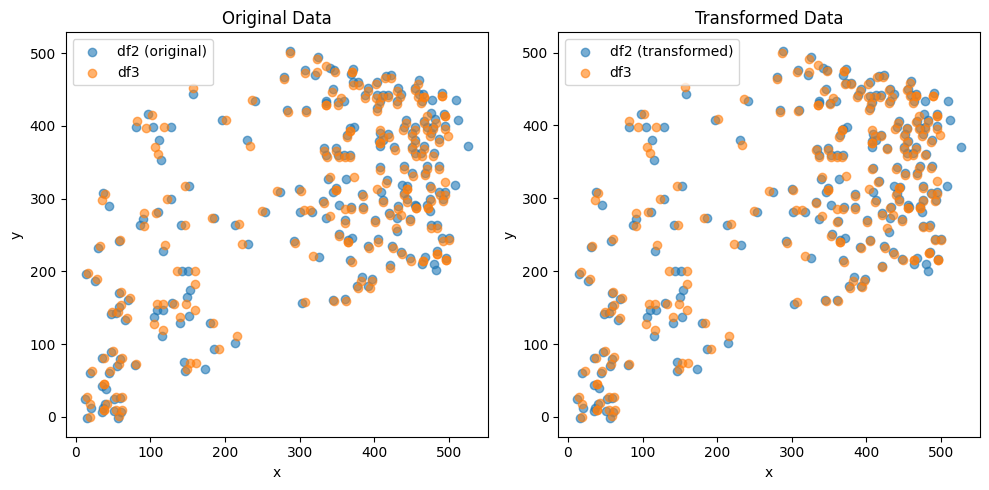

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (130,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.790854034184251e-06 , 1.629002356455272e-05 )
Rotation (radians): 0.0022892474424686315
Transform Matrix:
 [[ 9.99997380e-01 -2.28924544e-03  5.79085403e-06]
 [ 2.28924544e-03  9.99997380e-01  1.62900236e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


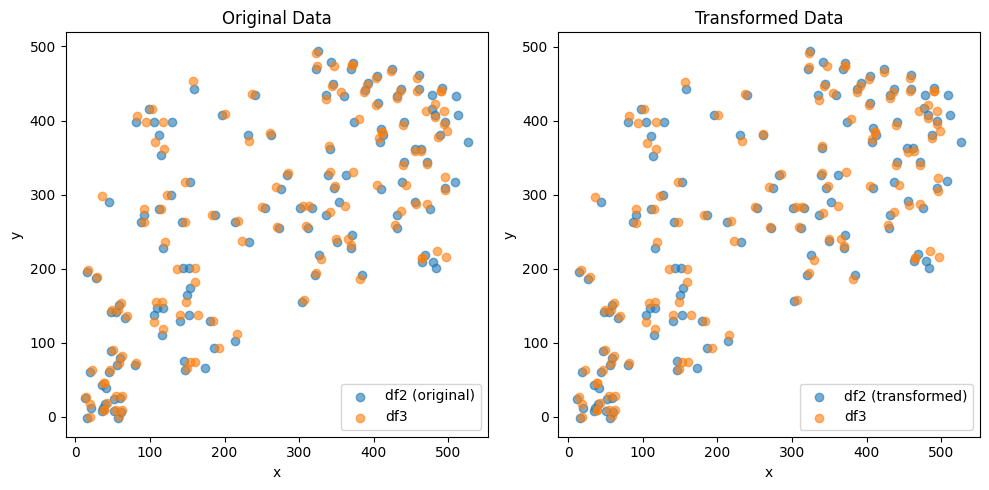

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (203,)
Optimal Translation and Rotation Parameters:
Translation: ( -4.777703536842212e-06 , -8.71585708149086e-06 )
Rotation (radians): -0.0021421465472537976
Transform Matrix:
 [[ 9.99997706e-01  2.14214491e-03 -4.77770354e-06]
 [-2.14214491e-03  9.99997706e-01 -8.71585708e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


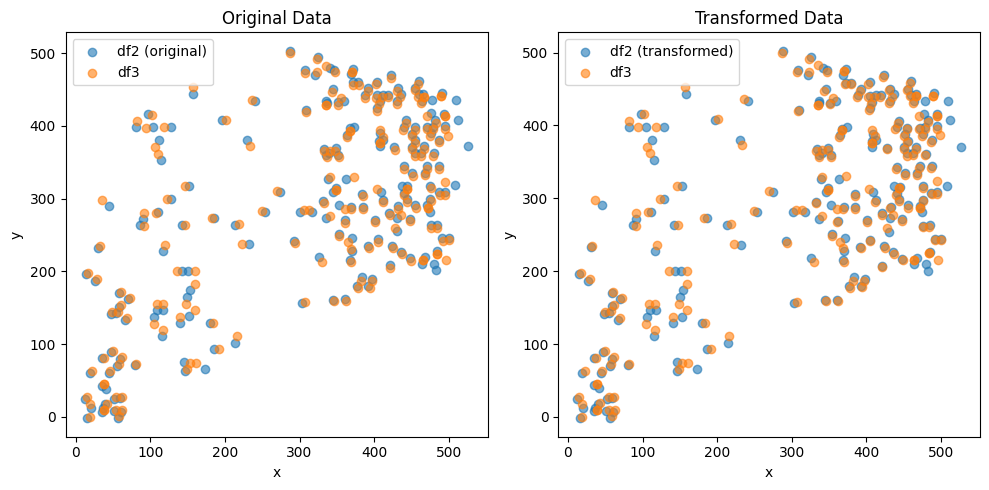

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (128,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.916750894143748e-06 , 1.583300890243752e-05 )
Rotation (radians): 0.002079661857707796
Transform Matrix:
 [[ 9.99997838e-01 -2.07966036e-03  5.91675089e-06]
 [ 2.07966036e-03  9.99997838e-01  1.58330089e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


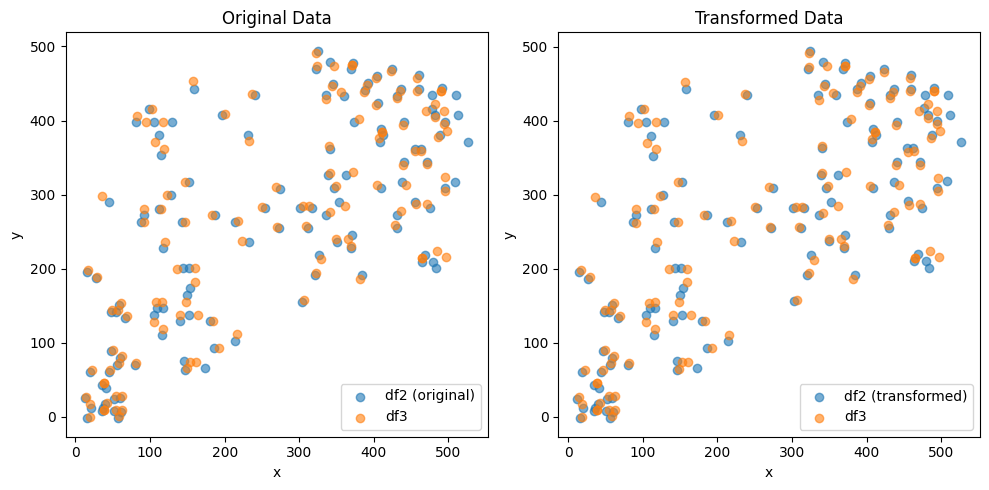

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (199,)
Optimal Translation and Rotation Parameters:
Translation: ( -4.596648103232041e-06 , -8.140777865120166e-06 )
Rotation (radians): -0.0020322400155372163
Transform Matrix:
 [[ 9.99997935e-01  2.03223862e-03 -4.59664810e-06]
 [-2.03223862e-03  9.99997935e-01 -8.14077787e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


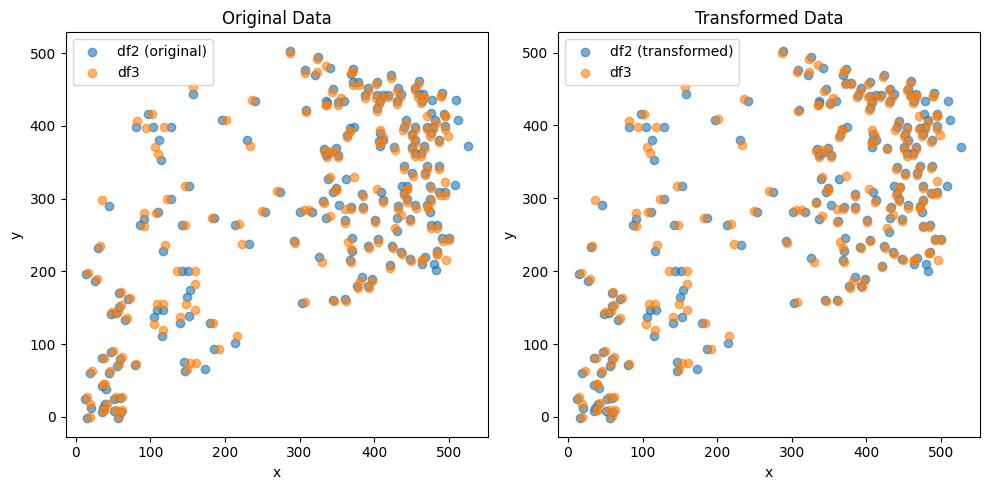

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (129,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.614186903322284e-06 , 1.5062438417401327e-05 )
Rotation (radians): 0.0019338123541762793
Transform Matrix:
 [[ 9.99998130e-01 -1.93381115e-03  5.61418690e-06]
 [ 1.93381115e-03  9.99998130e-01  1.50624384e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


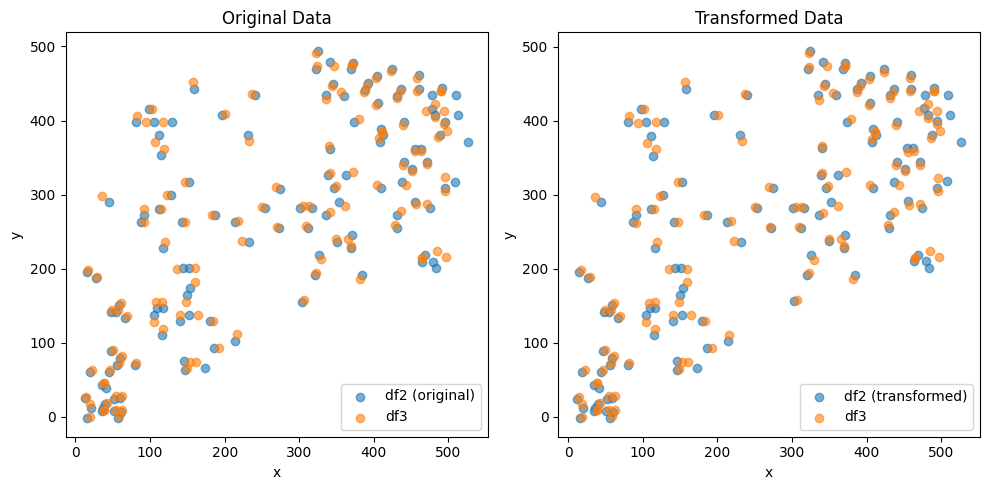

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (193,)
Optimal Translation and Rotation Parameters:
Translation: ( -4.550631837716003e-06 , -7.259595140090525e-06 )
Rotation (radians): -0.0017432030755831075
Transform Matrix:
 [[ 9.99998481e-01  1.74320219e-03 -4.55063184e-06]
 [-1.74320219e-03  9.99998481e-01 -7.25959514e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


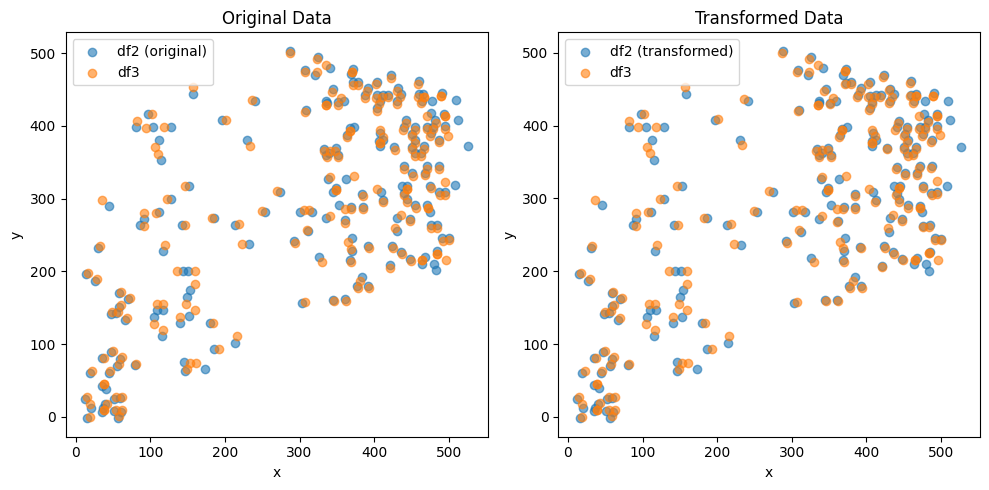

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (135,)
Optimal Translation and Rotation Parameters:
Translation: ( 3.7131497619605773e-06 , 1.23422856180336e-05 )
Rotation (radians): 0.0015099986324211645
Transform Matrix:
 [[ 9.99998860e-01 -1.50999806e-03  3.71314976e-06]
 [ 1.50999806e-03  9.99998860e-01  1.23422856e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


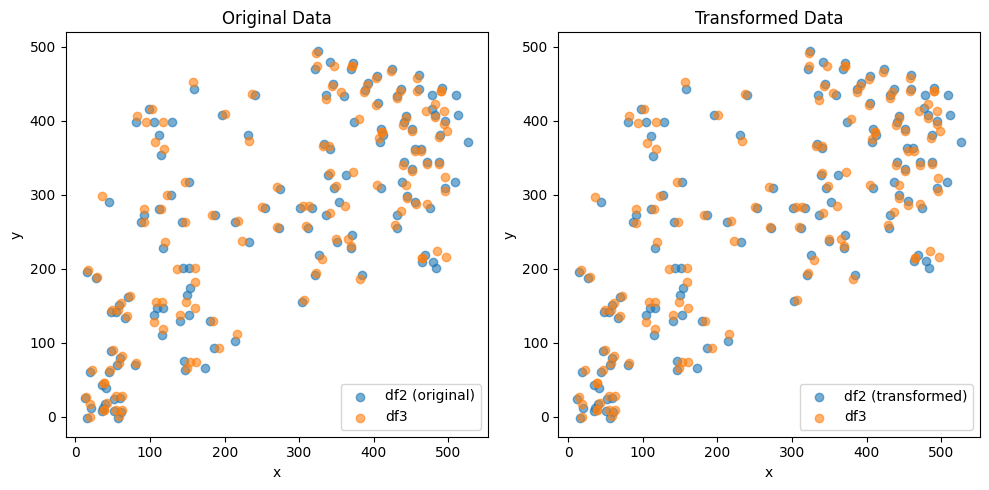

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (184,)
Optimal Translation and Rotation Parameters:
Translation: ( -4.63867123572084e-06 , -5.851746197588858e-06 )
Rotation (radians): -0.0013222783250334508
Transform Matrix:
 [[ 9.99999126e-01  1.32227794e-03 -4.63867124e-06]
 [-1.32227794e-03  9.99999126e-01 -5.85174620e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


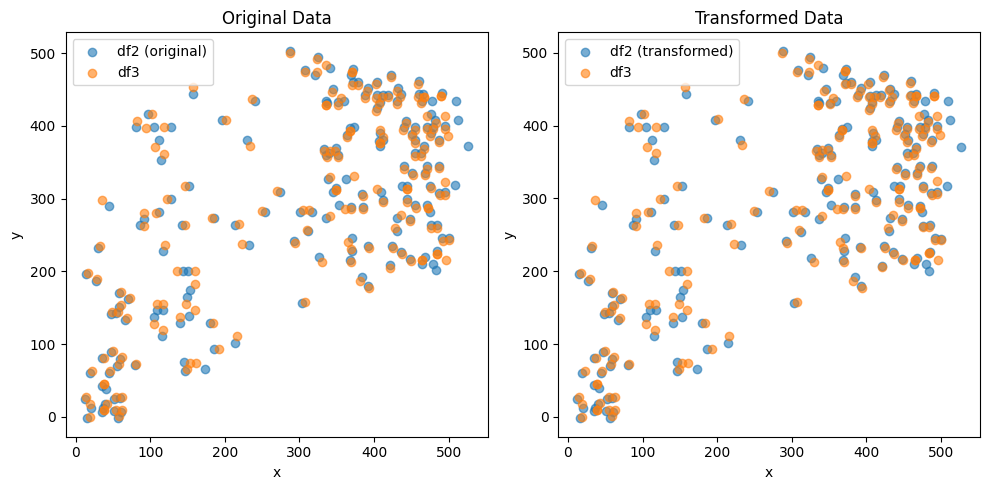

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (141,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.4893044399324407e-06 , 8.363307249104395e-06 )
Rotation (radians): 0.0009626595301383447
Transform Matrix:
 [[ 9.99999537e-01 -9.62659381e-04  1.48930444e-06]
 [ 9.62659381e-04  9.99999537e-01  8.36330725e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


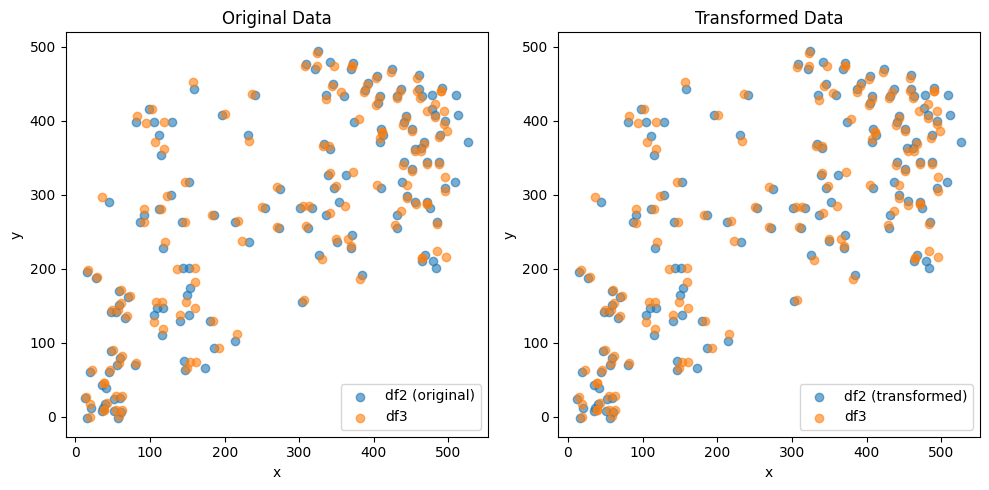

              0           1
0    328.045918  322.640565
1    324.686438  421.758283
2    408.738561  359.175655
3    311.699899  254.726447
4     56.654794   53.186266
..          ...         ...
995  197.645077  200.878249
996  335.364910  434.371425
997   53.789854  378.120444
998  288.844928  448.690671
999  245.414407  201.984717

[1000 rows x 2 columns]


In [88]:
dist_min = 3  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (55,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.8459884527898902 , 0.828761270083906 )
Rotation (radians): 0.008194369055926968
Transform Matrix:
 [[ 0.99996643 -0.00819428  0.84598845]
 [ 0.00819428  0.99996643  0.82876127]
 [ 0.          0.          1.        ]]


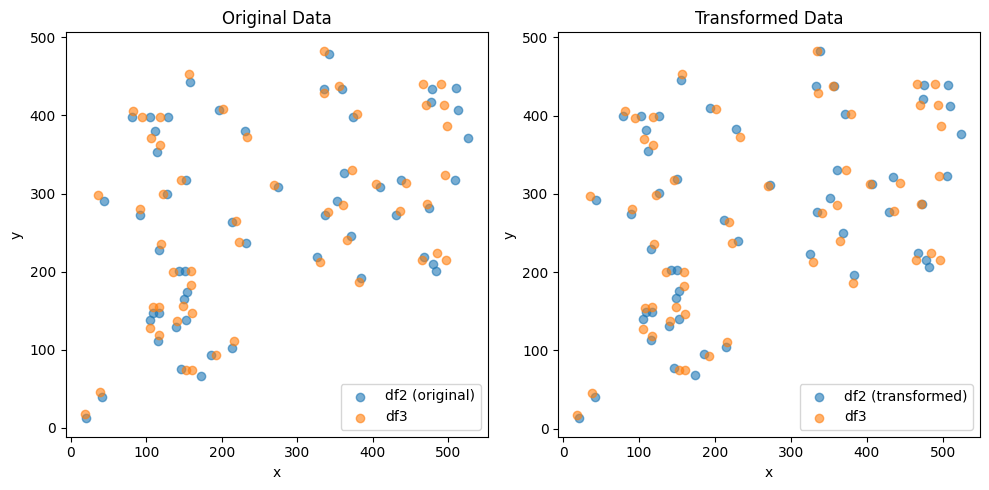

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (243,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.6139162512385313e-05 , -3.807993292902212e-05 )
Rotation (radians): -0.008233461503170857
Transform Matrix:
 [[ 9.99966105e-01  8.23336848e-03 -1.61391625e-05]
 [-8.23336848e-03  9.99966105e-01 -3.80799329e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


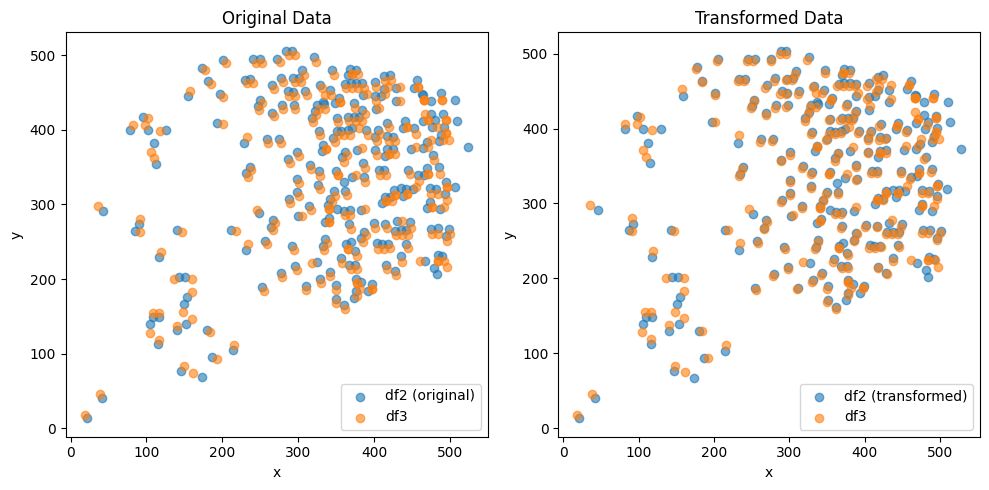

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (57,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.687402002739592e-06 , 2.024915217396069e-05 )
Rotation (radians): 0.005602124790506473
Transform Matrix:
 [[ 9.99984308e-01 -5.60209549e-03 -6.68740200e-06]
 [ 5.60209549e-03  9.99984308e-01  2.02491522e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


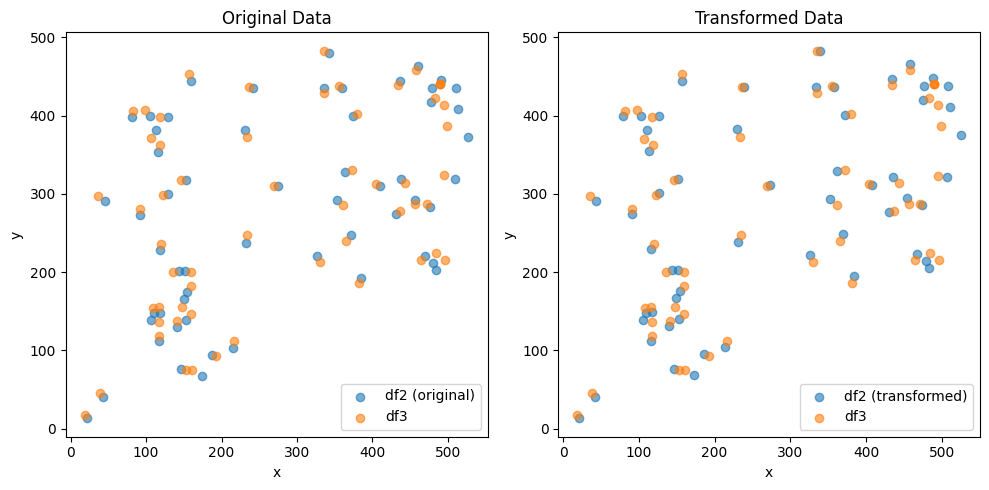

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (179,)
Optimal Translation and Rotation Parameters:
Translation: ( -9.6326404270493e-06 , -2.2784882480153264e-05 )
Rotation (radians): -0.005718866111745154
Transform Matrix:
 [[ 9.99983647e-01  5.71883494e-03 -9.63264043e-06]
 [-5.71883494e-03  9.99983647e-01 -2.27848825e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


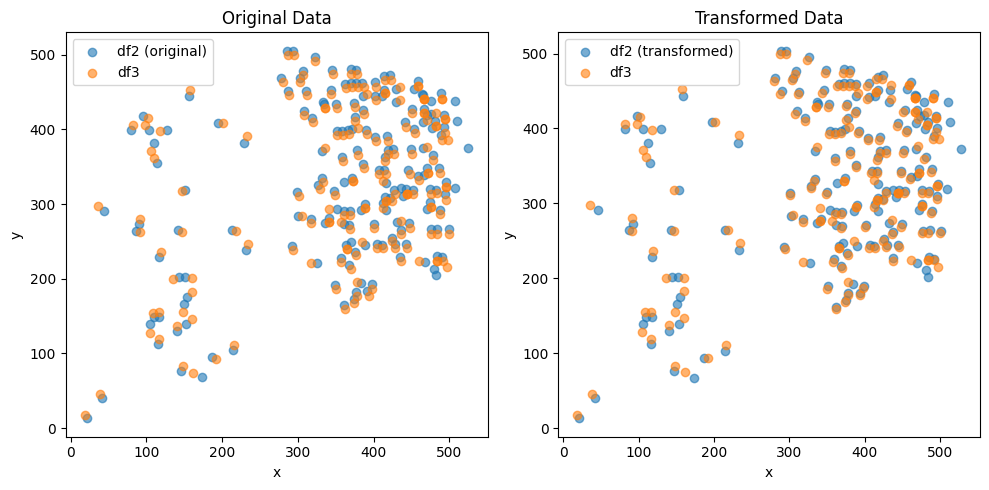

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (56,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.186243215628224e-06 , 2.2357719125278324e-05 )
Rotation (radians): 0.006140175764210199
Transform Matrix:
 [[ 9.99981149e-01 -6.14013718e-03 -6.18624322e-06]
 [ 6.14013718e-03  9.99981149e-01  2.23577191e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


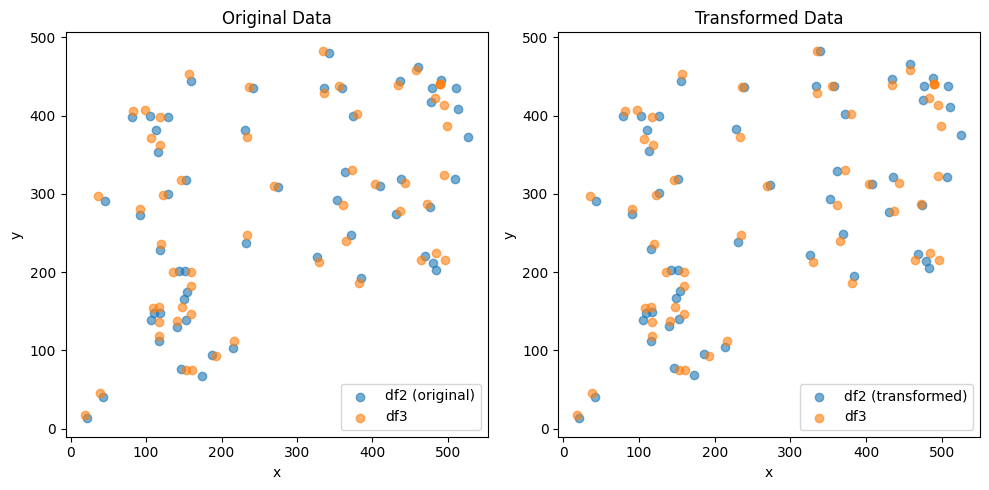

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (192,)
Optimal Translation and Rotation Parameters:
Translation: ( -7.434203155488419e-06 , -2.2612663009055484e-05 )
Rotation (radians): -0.006266325375856389
Transform Matrix:
 [[ 9.99980367e-01  6.26628437e-03 -7.43420316e-06]
 [-6.26628437e-03  9.99980367e-01 -2.26126630e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


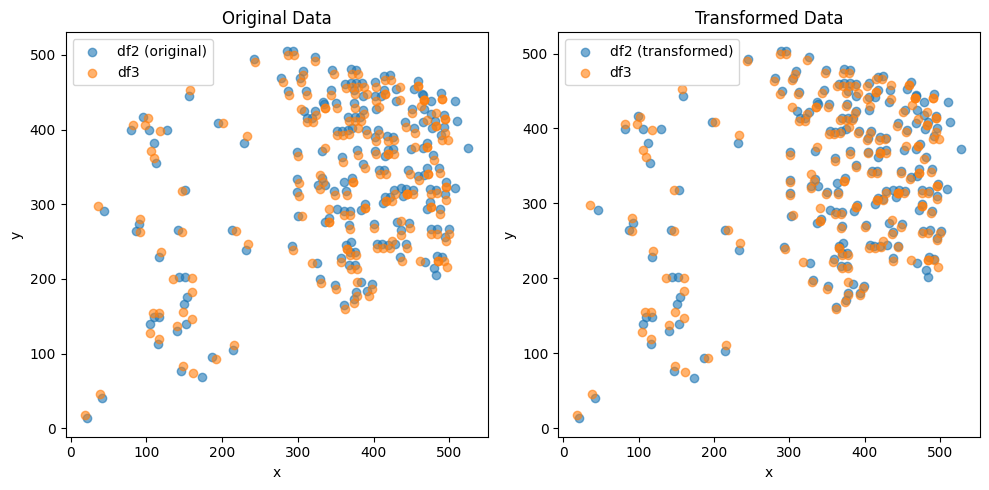

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (56,)
Optimal Translation and Rotation Parameters:
Translation: ( -4.410277256115892e-06 , 2.2939455293174064e-05 )
Rotation (radians): 0.005471895665437526
Transform Matrix:
 [[ 9.99985029e-01 -5.47186836e-03 -4.41027726e-06]
 [ 5.47186836e-03  9.99985029e-01  2.29394553e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


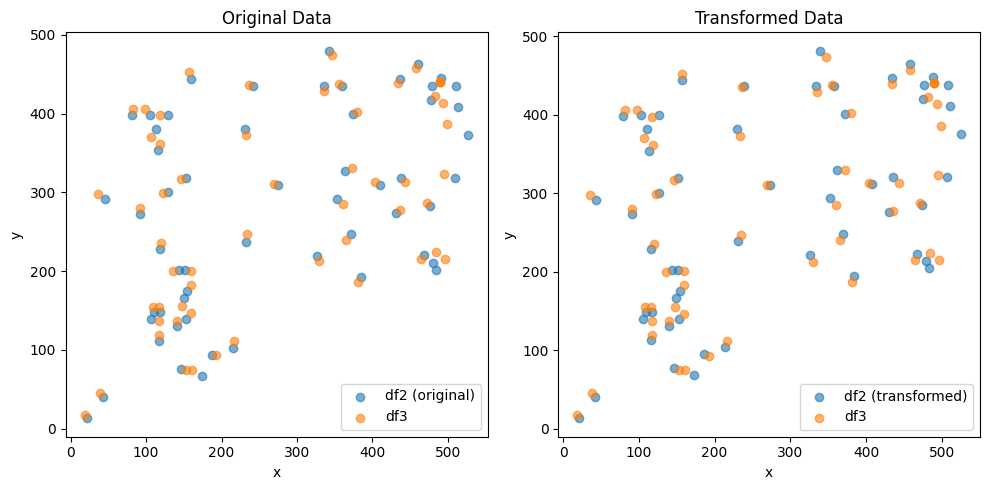

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (159,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.7063151703536192e-05 , -3.2978172800029163e-05 )
Rotation (radians): -0.004626240085352161
Transform Matrix:
 [[ 9.99989299e-01  4.62622358e-03 -2.70631517e-05]
 [-4.62622358e-03  9.99989299e-01 -3.29781728e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


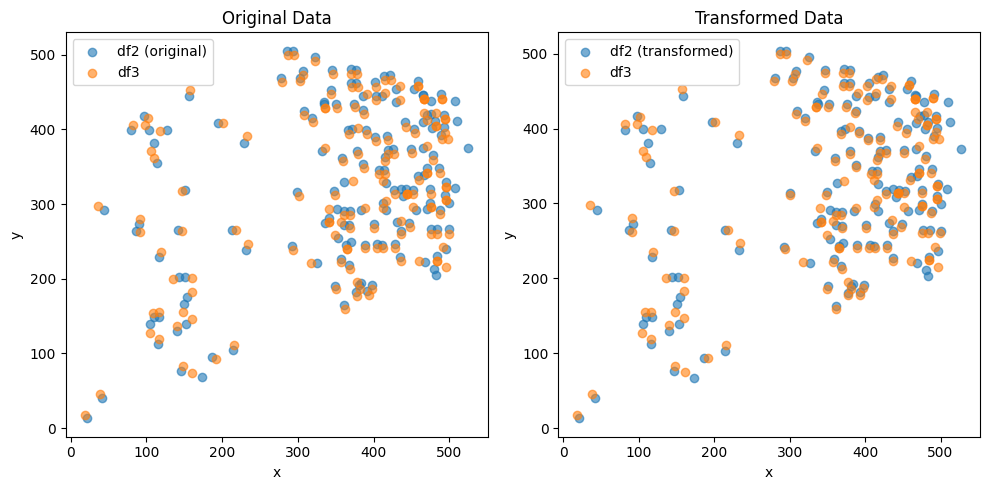

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.328233358655511e-06 , 1.5841862651022582e-05 )
Rotation (radians): 0.0038915302125277045
Transform Matrix:
 [[ 9.99992428e-01 -3.89152039e-03 -6.32823336e-06]
 [ 3.89152039e-03  9.99992428e-01  1.58418627e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


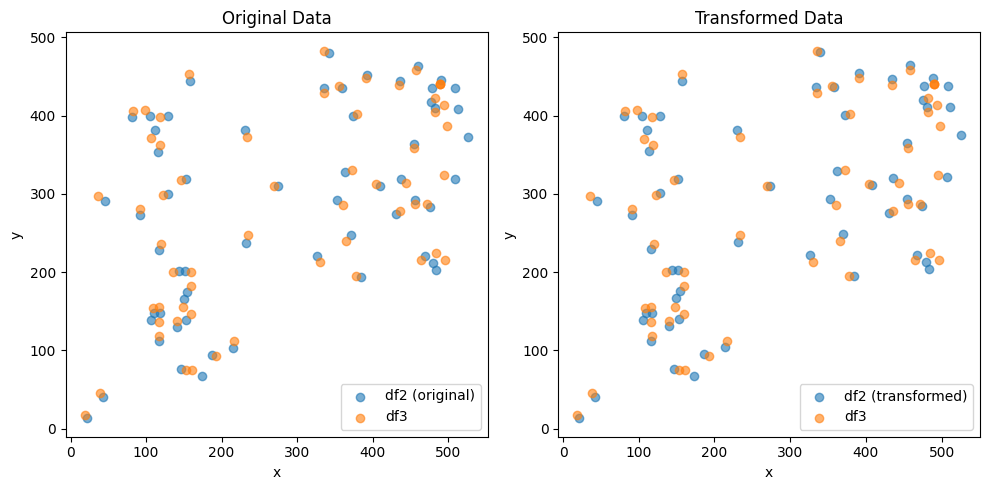

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.564243793115948e-05 , -2.868456411258991e-05 )
Rotation (radians): -0.003827561222586162
Transform Matrix:
 [[ 9.99992675e-01  3.82755188e-03 -2.56424379e-05]
 [-3.82755188e-03  9.99992675e-01 -2.86845641e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


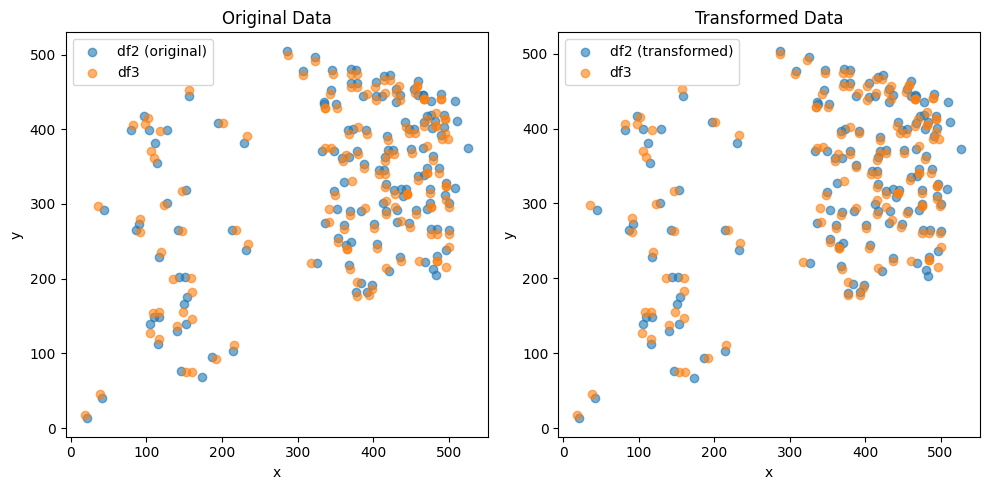

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2389313904092925e-06 , 1.5760226211168343e-05 )
Rotation (radians): 0.0038275350109771298
Transform Matrix:
 [[ 9.99992675e-01 -3.82752567e-03 -6.23893139e-06]
 [ 3.82752567e-03  9.99992675e-01  1.57602262e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


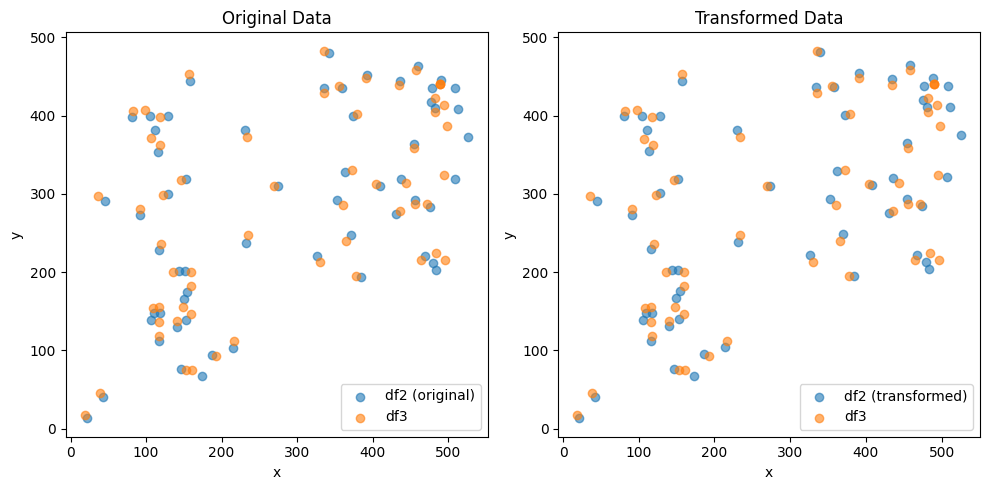

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5604532510784953e-05 , -2.8604941628658008e-05 )
Rotation (radians): -0.0038275948404403208
Transform Matrix:
 [[ 9.99992675e-01  3.82758549e-03 -2.56045325e-05]
 [-3.82758549e-03  9.99992675e-01 -2.86049416e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


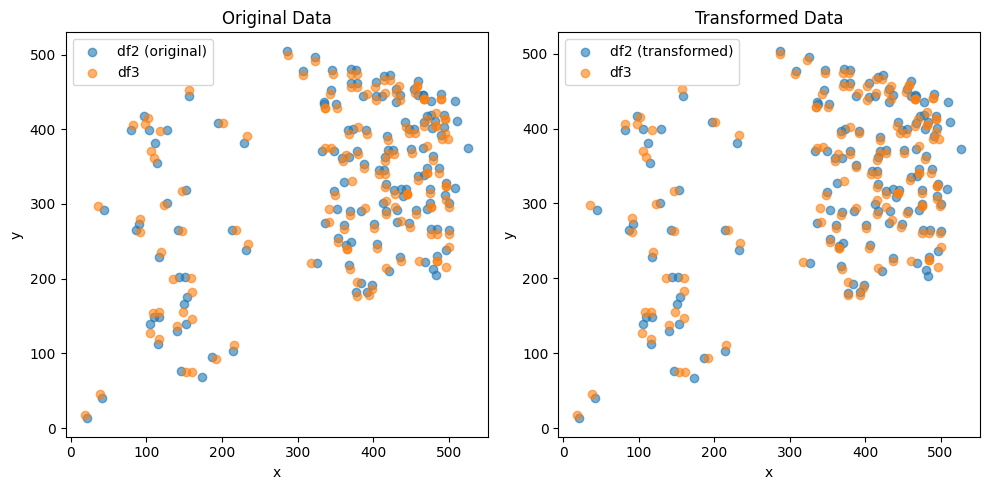

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.196120668664509e-06 , 1.576881103792671e-05 )
Rotation (radians): 0.0038275848621241314
Transform Matrix:
 [[ 9.99992675e-01 -3.82757552e-03 -6.19612067e-06]
 [ 3.82757552e-03  9.99992675e-01  1.57688110e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


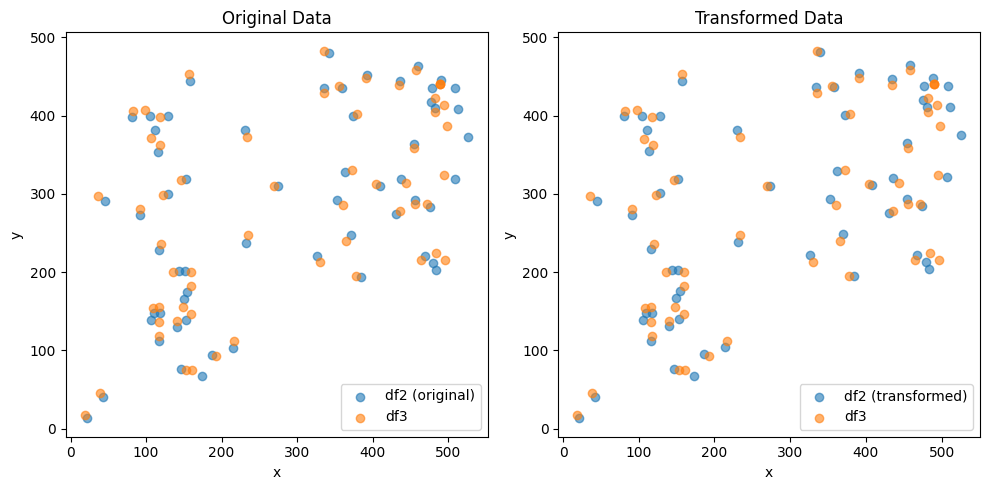

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5615027051508844e-05 , -2.8592844328508537e-05 )
Rotation (radians): -0.003827578944851769
Transform Matrix:
 [[ 9.99992675e-01  3.82756960e-03 -2.56150271e-05]
 [-3.82756960e-03  9.99992675e-01 -2.85928443e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


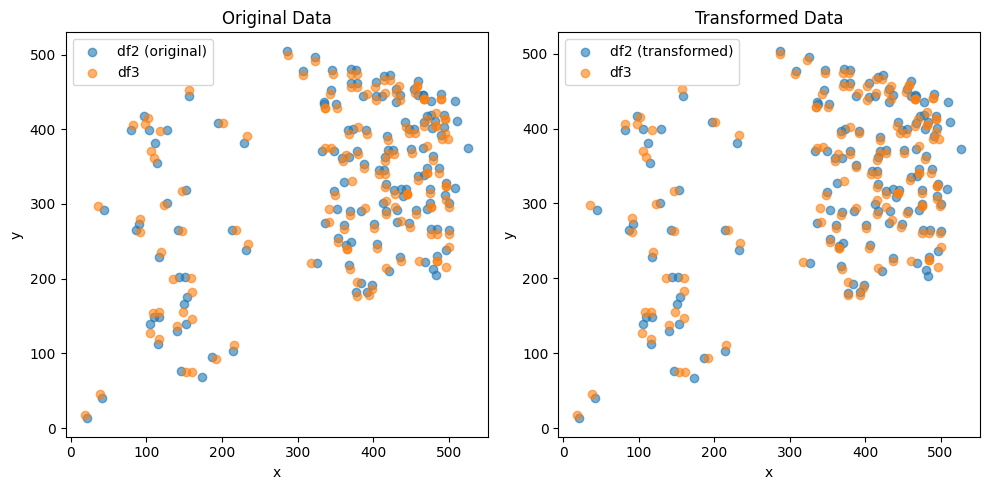

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.227111755308046e-06 , 1.5747425221332765e-05 )
Rotation (radians): 0.003827540967660667
Transform Matrix:
 [[ 9.99992675e-01 -3.82753162e-03 -6.22711176e-06]
 [ 3.82753162e-03  9.99992675e-01  1.57474252e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


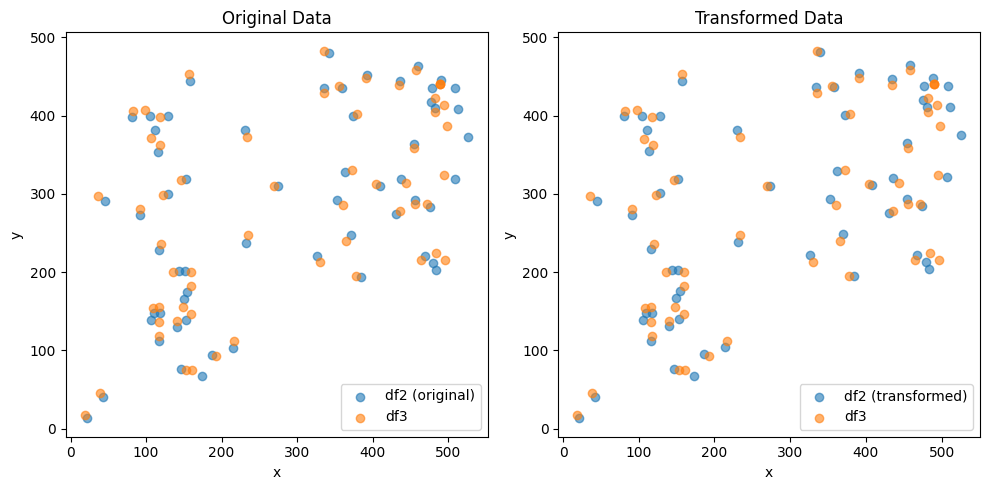

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.556985963562606e-05 , -2.8558955102870904e-05 )
Rotation (radians): -0.003827595455357629
Transform Matrix:
 [[ 9.99992675e-01  3.82758611e-03 -2.55698596e-05]
 [-3.82758611e-03  9.99992675e-01 -2.85589551e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


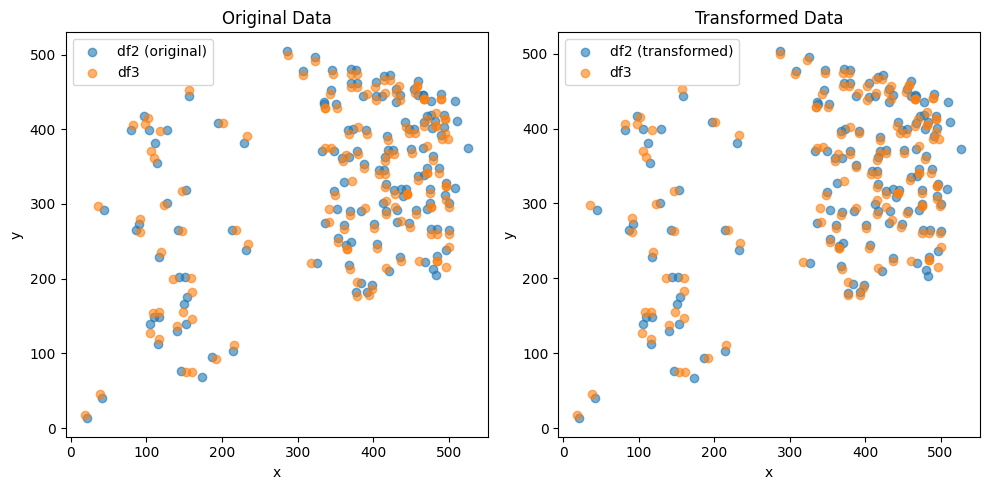

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.226860620715305e-06 , 1.5762532491124307e-05 )
Rotation (radians): 0.0038275644735674907
Transform Matrix:
 [[ 9.99992675e-01 -3.82755513e-03 -6.22686062e-06]
 [ 3.82755513e-03  9.99992675e-01  1.57625325e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


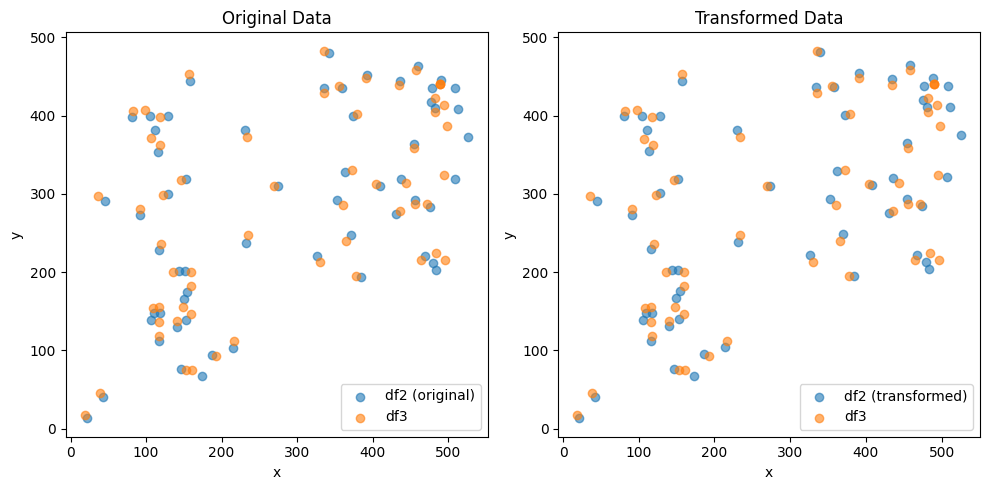

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5590712005340124e-05 , -2.8598646857288697e-05 )
Rotation (radians): -0.003827613949614337
Transform Matrix:
 [[ 9.99992675e-01  3.82760460e-03 -2.55907120e-05]
 [-3.82760460e-03  9.99992675e-01 -2.85986469e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


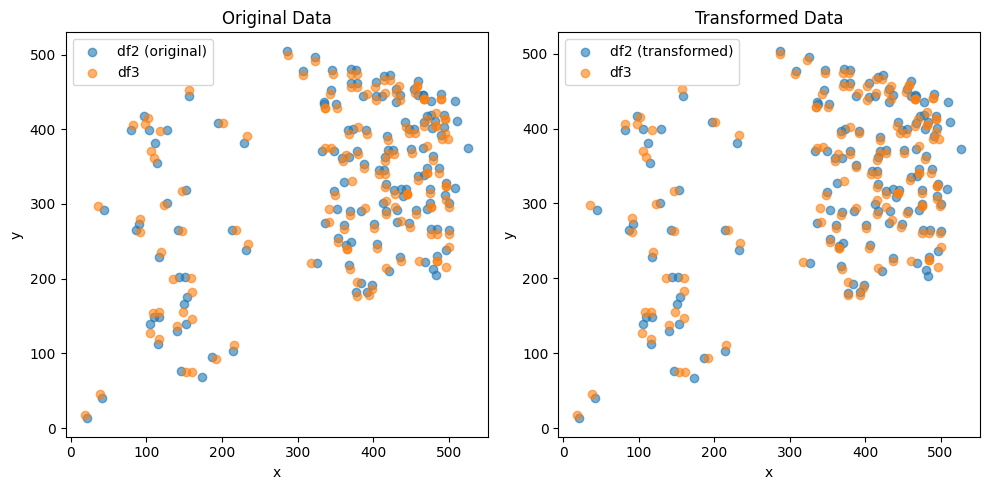

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.211851788099528e-06 , 1.5744058606456507e-05 )
Rotation (radians): 0.0038275681693623127
Transform Matrix:
 [[ 9.99992675e-01 -3.82755882e-03 -6.21185179e-06]
 [ 3.82755882e-03  9.99992675e-01  1.57440586e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


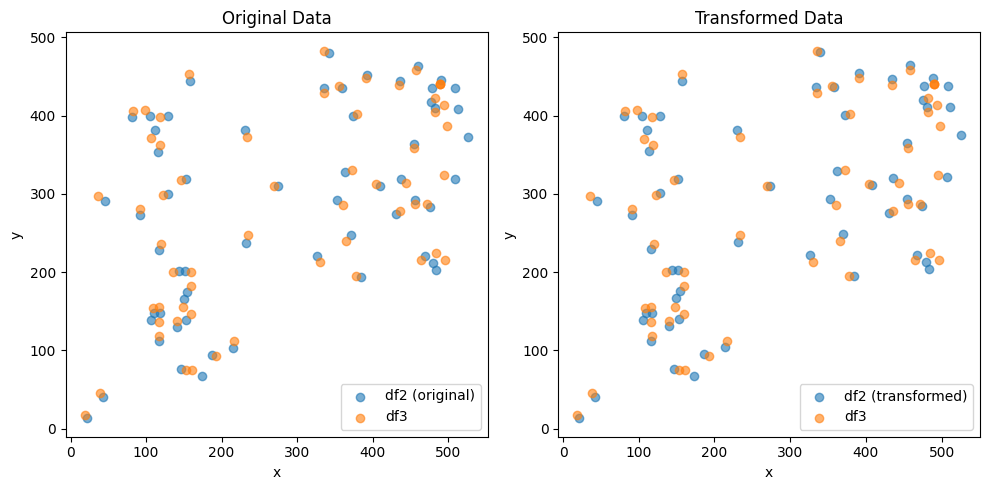

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.557814452644284e-05 , -2.8646139284443296e-05 )
Rotation (radians): -0.003827604340207136
Transform Matrix:
 [[ 9.99992675e-01  3.82759499e-03 -2.55781445e-05]
 [-3.82759499e-03  9.99992675e-01 -2.86461393e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


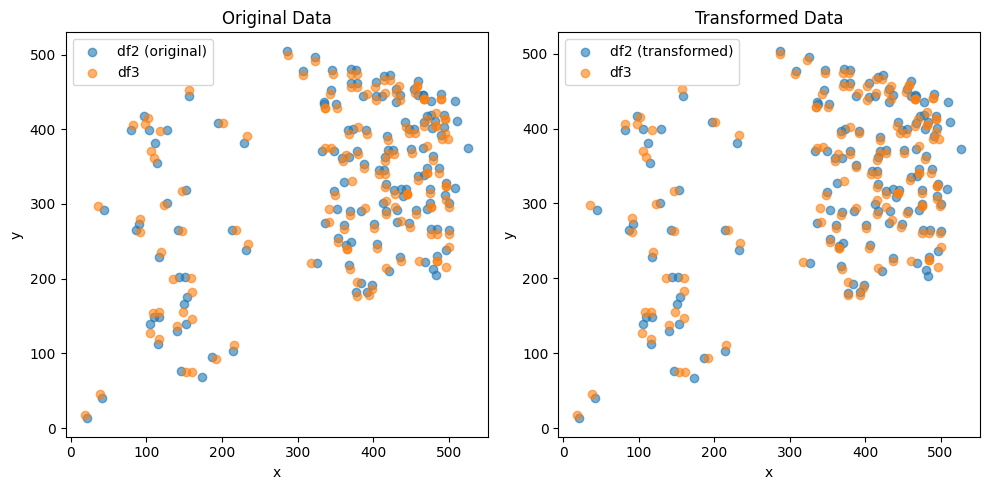

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.223146537435118e-06 , 1.5740817438679773e-05 )
Rotation (radians): 0.0038275666775732355
Transform Matrix:
 [[ 9.99992675e-01 -3.82755733e-03 -6.22314654e-06]
 [ 3.82755733e-03  9.99992675e-01  1.57408174e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


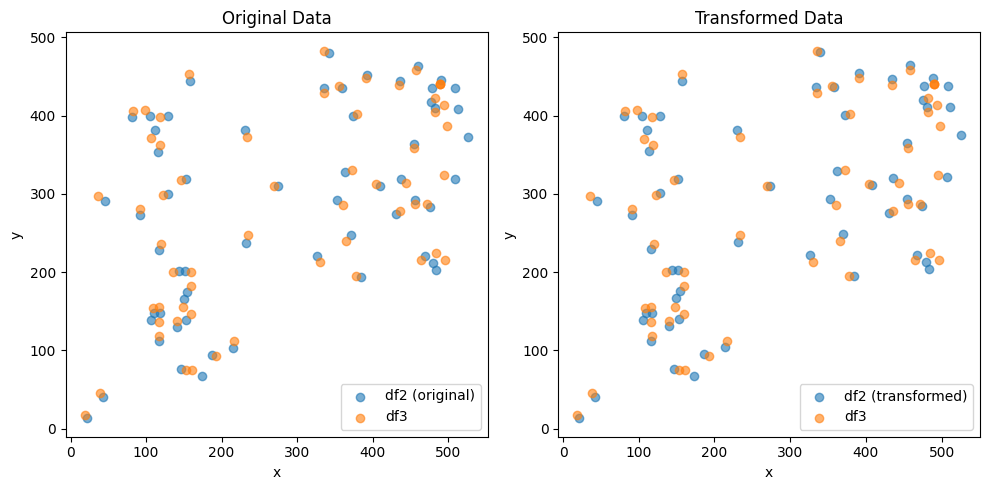

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5612152093621654e-05 , -2.862309954128168e-05 )
Rotation (radians): -0.0038275591849734345
Transform Matrix:
 [[ 9.99992675e-01  3.82754984e-03 -2.56121521e-05]
 [-3.82754984e-03  9.99992675e-01 -2.86230995e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


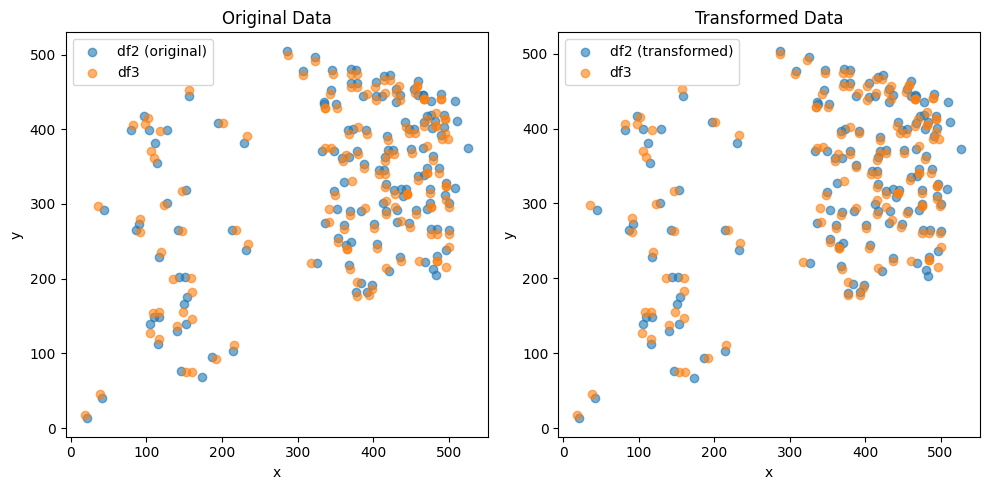

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.204737697392189e-06 , 1.575826676599802e-05 )
Rotation (radians): 0.003827558541962773
Transform Matrix:
 [[ 9.99992675e-01 -3.82754920e-03 -6.20473770e-06]
 [ 3.82754920e-03  9.99992675e-01  1.57582668e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


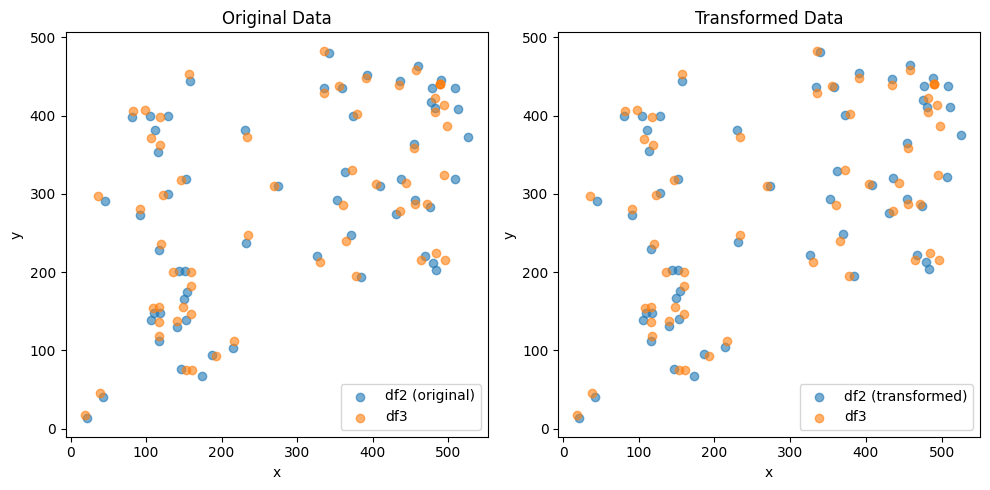

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.559656500411901e-05 , -2.8626990067626126e-05 )
Rotation (radians): -0.0038276571795898173
Transform Matrix:
 [[ 9.99992675e-01  3.82764783e-03 -2.55965650e-05]
 [-3.82764783e-03  9.99992675e-01 -2.86269901e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


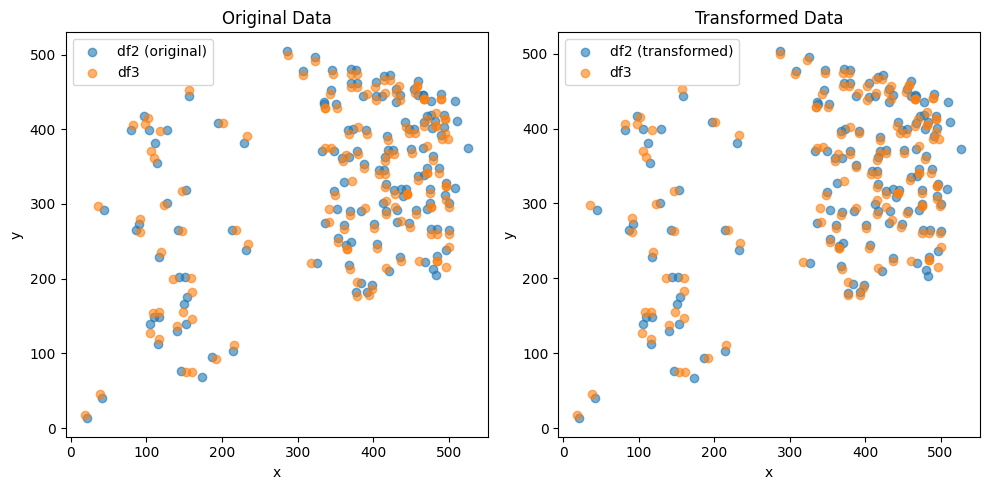

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.253921804586196e-06 , 1.576212956876339e-05 )
Rotation (radians): 0.0038276026530801952
Transform Matrix:
 [[ 9.99992675e-01 -3.82759331e-03 -6.25392180e-06]
 [ 3.82759331e-03  9.99992675e-01  1.57621296e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


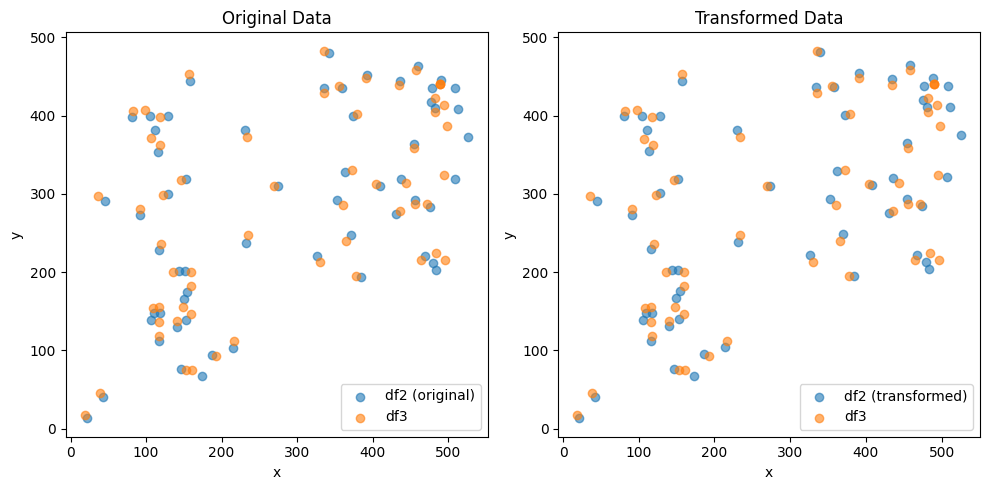

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5593692875535176e-05 , -2.8620842570067428e-05 )
Rotation (radians): -0.0038275795408204906
Transform Matrix:
 [[ 9.99992675e-01  3.82757019e-03 -2.55936929e-05]
 [-3.82757019e-03  9.99992675e-01 -2.86208426e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


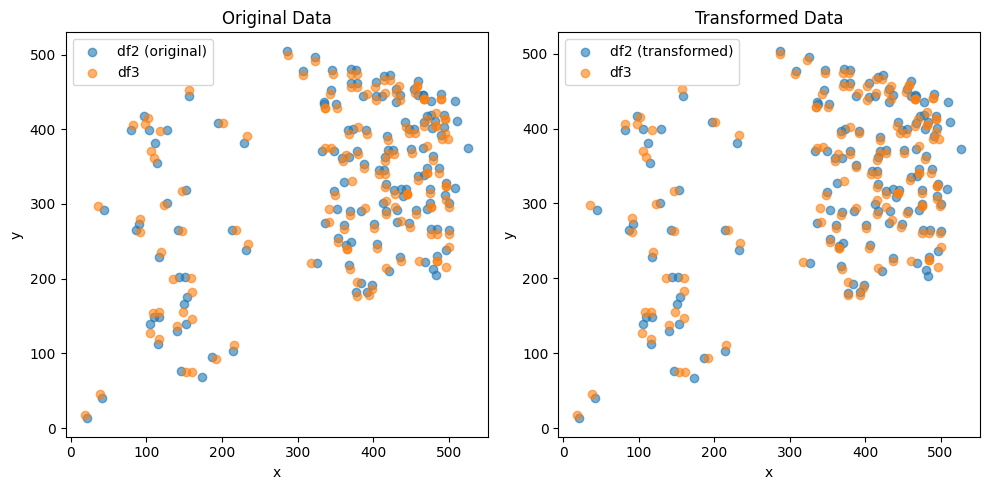

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.22736889412782e-06 , 1.5746259045341497e-05 )
Rotation (radians): 0.0038275655487339283
Transform Matrix:
 [[ 9.99992675e-01 -3.82755620e-03 -6.22736889e-06]
 [ 3.82755620e-03  9.99992675e-01  1.57462590e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


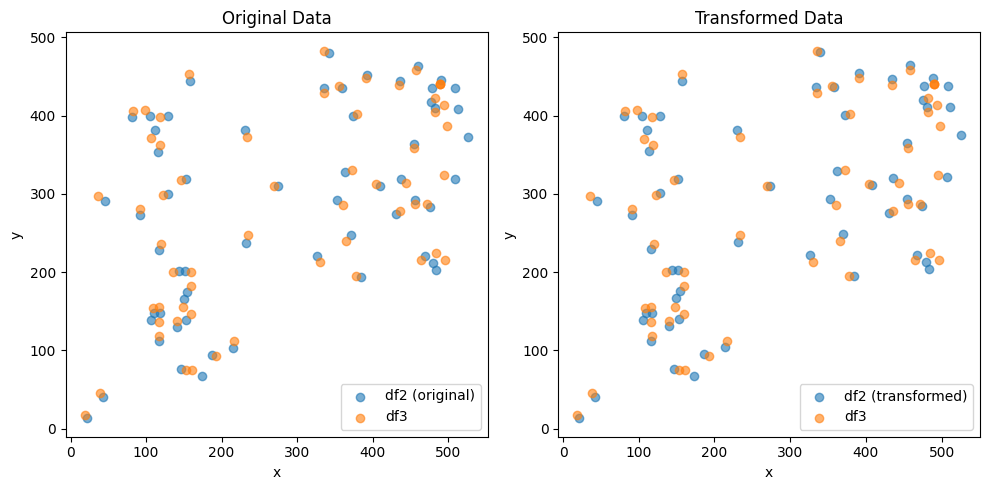

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.562871603356284e-05 , -2.8635160081839694e-05 )
Rotation (radians): -0.0038276298187918402
Transform Matrix:
 [[ 9.99992675e-01  3.82762047e-03 -2.56287160e-05]
 [-3.82762047e-03  9.99992675e-01 -2.86351601e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


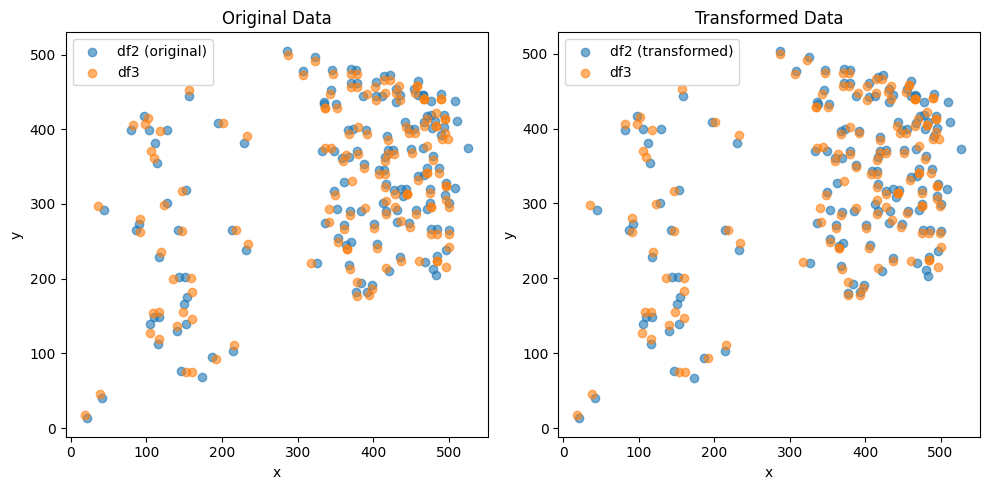

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.237438783902736e-06 , 1.574874732050663e-05 )
Rotation (radians): 0.003827598598746281
Transform Matrix:
 [[ 9.99992675e-01 -3.82758925e-03 -6.23743878e-06]
 [ 3.82758925e-03  9.99992675e-01  1.57487473e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


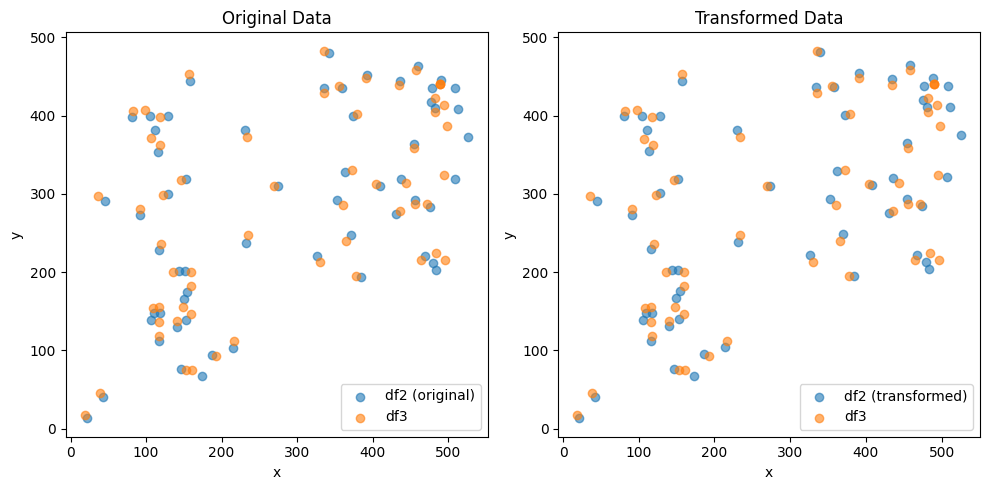

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5674395562900525e-05 , -2.8679317814446138e-05 )
Rotation (radians): -0.0038276824243678267
Transform Matrix:
 [[ 9.99992674e-01  3.82767308e-03 -2.56743956e-05]
 [-3.82767308e-03  9.99992674e-01 -2.86793178e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


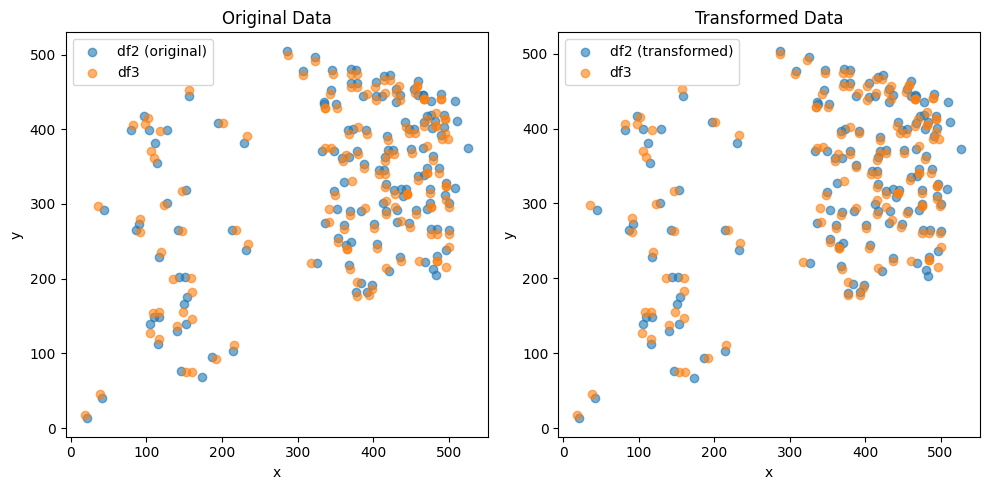

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.216053433935265e-06 , 1.5749974637863645e-05 )
Rotation (radians): 0.0038276648888076257
Transform Matrix:
 [[ 9.99992674e-01 -3.82765554e-03 -6.21605343e-06]
 [ 3.82765554e-03  9.99992674e-01  1.57499746e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


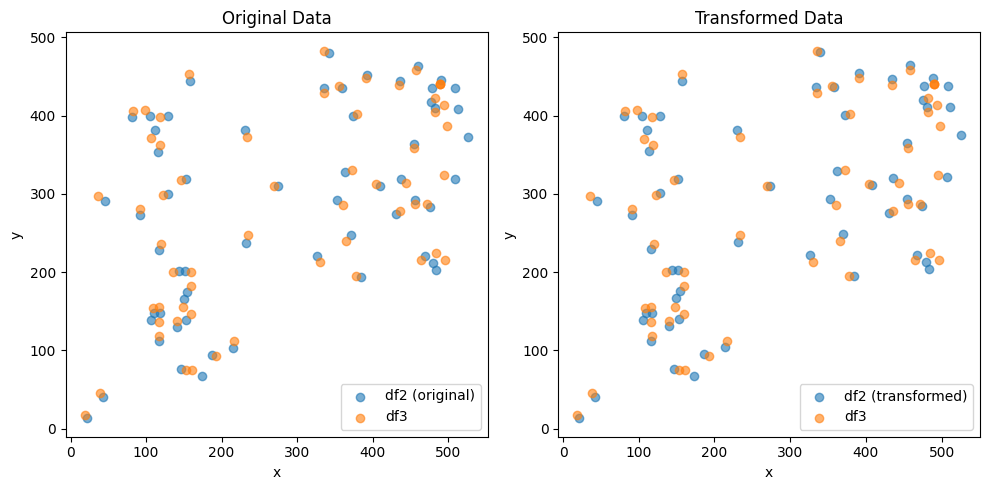

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.560061508461906e-05 , -2.8555549625132225e-05 )
Rotation (radians): -0.003827608119793747
Transform Matrix:
 [[ 9.99992675e-01  3.82759877e-03 -2.56006151e-05]
 [-3.82759877e-03  9.99992675e-01 -2.85555496e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


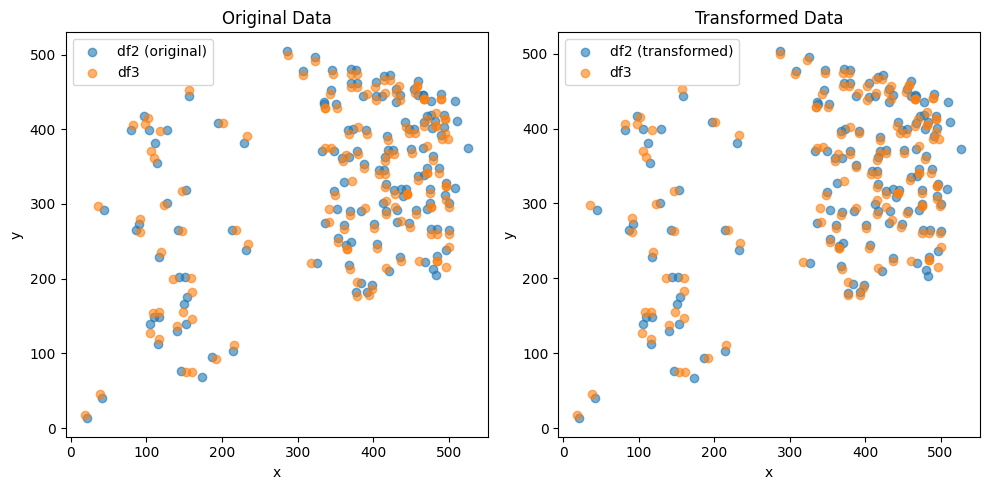

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2138376968186405e-06 , 1.5756952179831428e-05 )
Rotation (radians): 0.003827565910013992
Transform Matrix:
 [[ 9.99992675e-01 -3.82755656e-03 -6.21383770e-06]
 [ 3.82755656e-03  9.99992675e-01  1.57569522e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


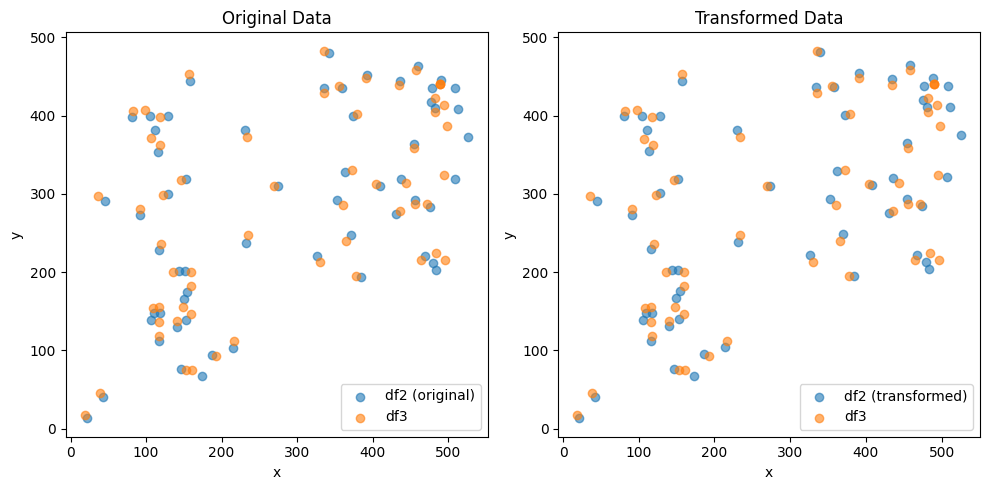

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.562505591537645e-05 , -2.860455568083746e-05 )
Rotation (radians): -0.0038276254088804086
Transform Matrix:
 [[ 9.99992675e-01  3.82761606e-03 -2.56250559e-05]
 [-3.82761606e-03  9.99992675e-01 -2.86045557e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


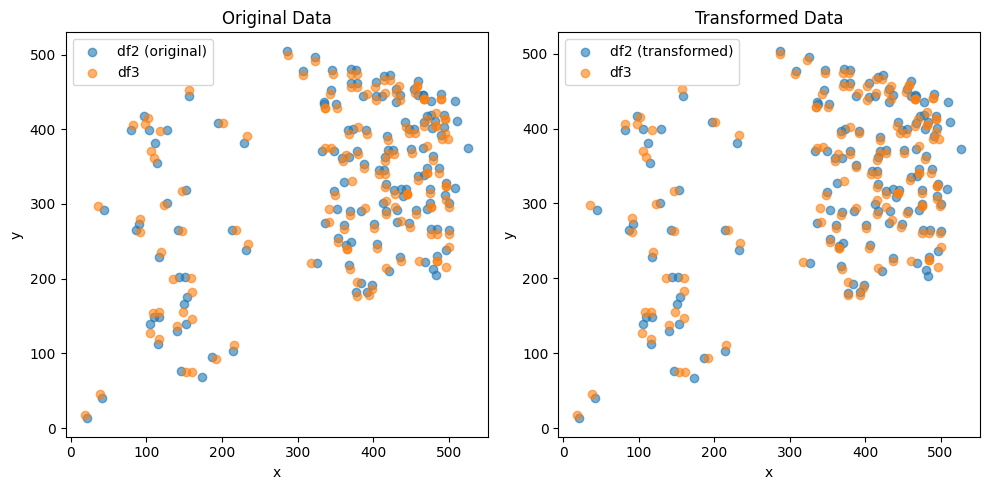

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.222430014403499e-06 , 1.5740532627796975e-05 )
Rotation (radians): 0.003827592292329764
Transform Matrix:
 [[ 9.99992675e-01 -3.82758295e-03 -6.22243001e-06]
 [ 3.82758295e-03  9.99992675e-01  1.57405326e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


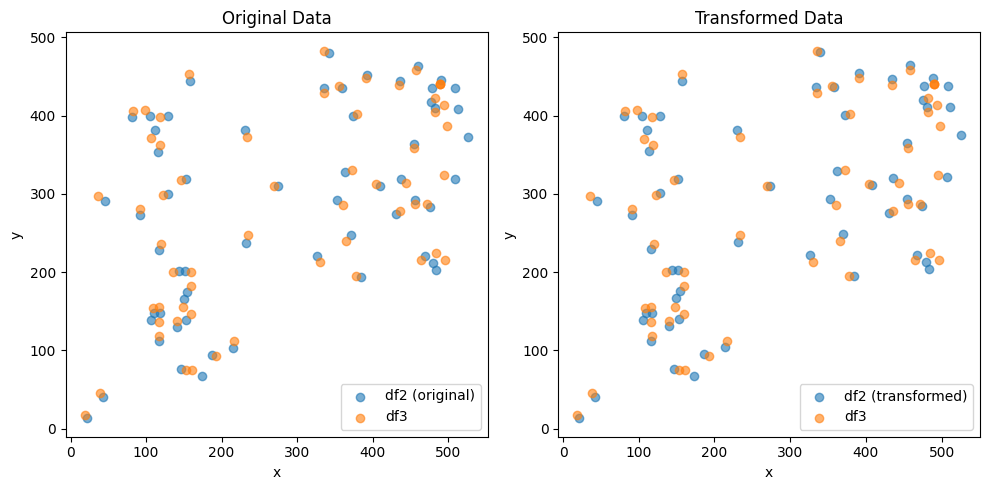

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.560510269803246e-05 , -2.8593227882500483e-05 )
Rotation (radians): -0.003827544109775254
Transform Matrix:
 [[ 9.99992675e-01  3.82753476e-03 -2.56051027e-05]
 [-3.82753476e-03  9.99992675e-01 -2.85932279e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


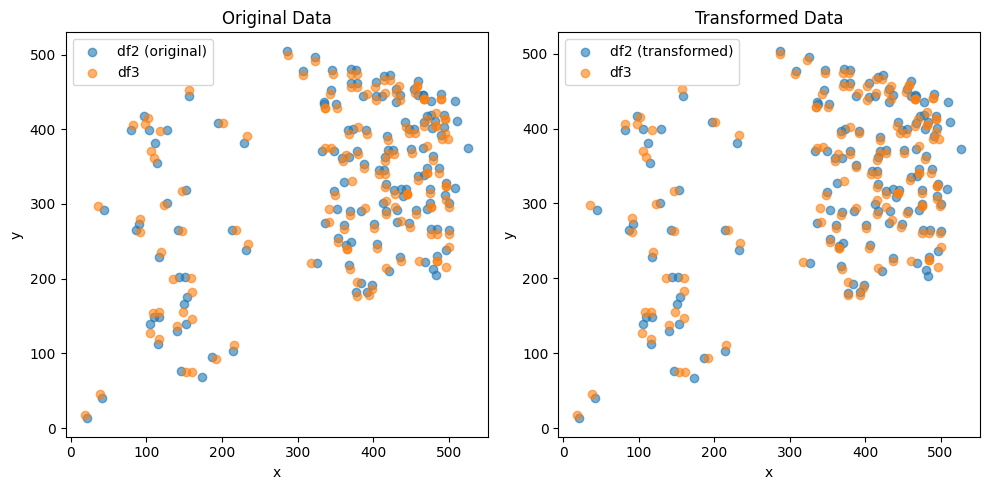

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2256198191088126e-06 , 1.5752100530104573e-05 )
Rotation (radians): 0.0038275092954037975
Transform Matrix:
 [[ 9.99992675e-01 -3.82749995e-03 -6.22561982e-06]
 [ 3.82749995e-03  9.99992675e-01  1.57521005e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


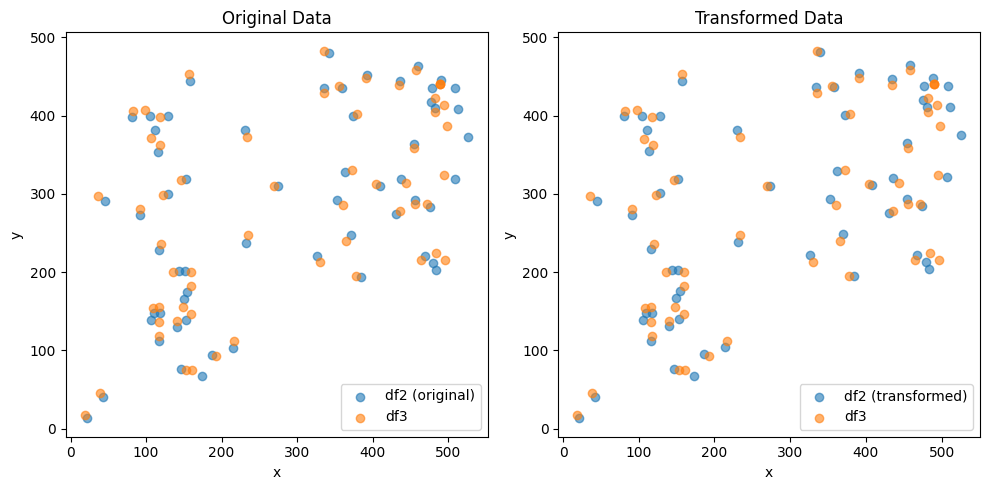

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5619054174591496e-05 , -2.8622063273440135e-05 )
Rotation (radians): -0.0038275914315183106
Transform Matrix:
 [[ 9.99992675e-01  3.82758209e-03 -2.56190542e-05]
 [-3.82758209e-03  9.99992675e-01 -2.86220633e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


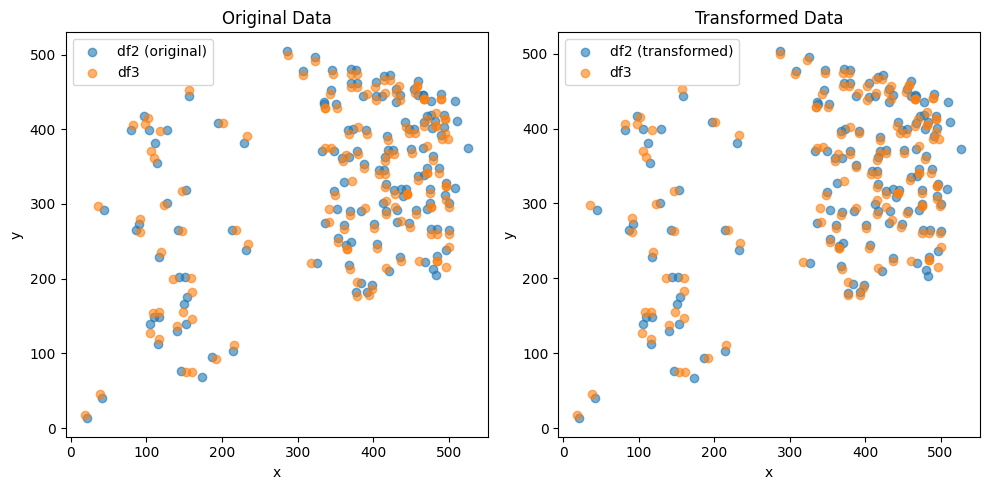

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.198829594518546e-06 , 1.5781849581072245e-05 )
Rotation (radians): 0.0038275720685101403
Transform Matrix:
 [[ 9.99992675e-01 -3.82756272e-03 -6.19882959e-06]
 [ 3.82756272e-03  9.99992675e-01  1.57818496e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


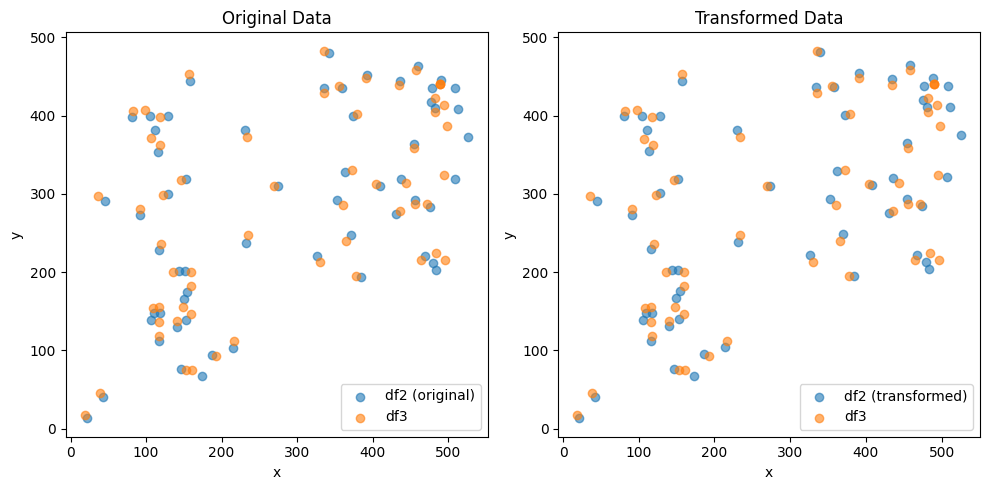

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5686584280777207e-05 , -2.8640247076124673e-05 )
Rotation (radians): -0.0038276156867311484
Transform Matrix:
 [[ 9.99992675e-01  3.82760634e-03 -2.56865843e-05]
 [-3.82760634e-03  9.99992675e-01 -2.86402471e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


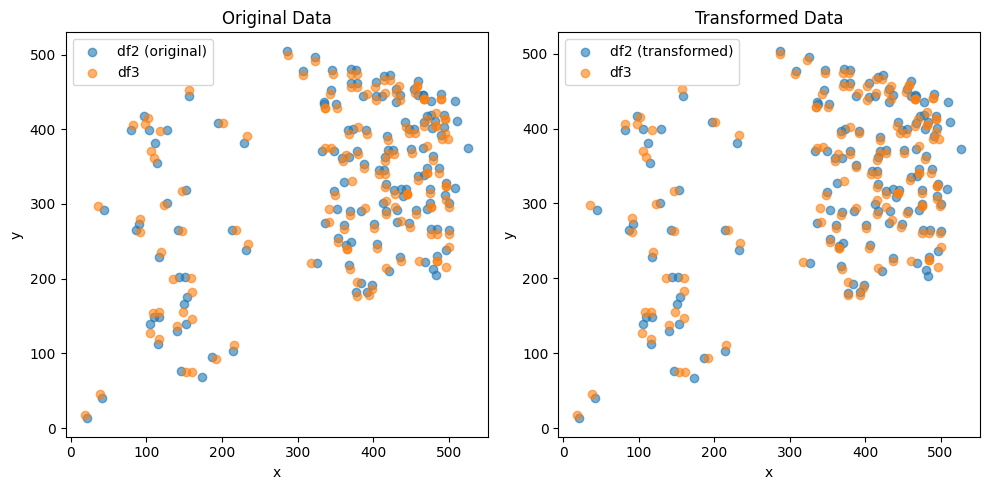

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.190956745971929e-06 , 1.577732833699325e-05 )
Rotation (radians): 0.003827580608799261
Transform Matrix:
 [[ 9.99992675e-01 -3.82757126e-03 -6.19095675e-06]
 [ 3.82757126e-03  9.99992675e-01  1.57773283e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


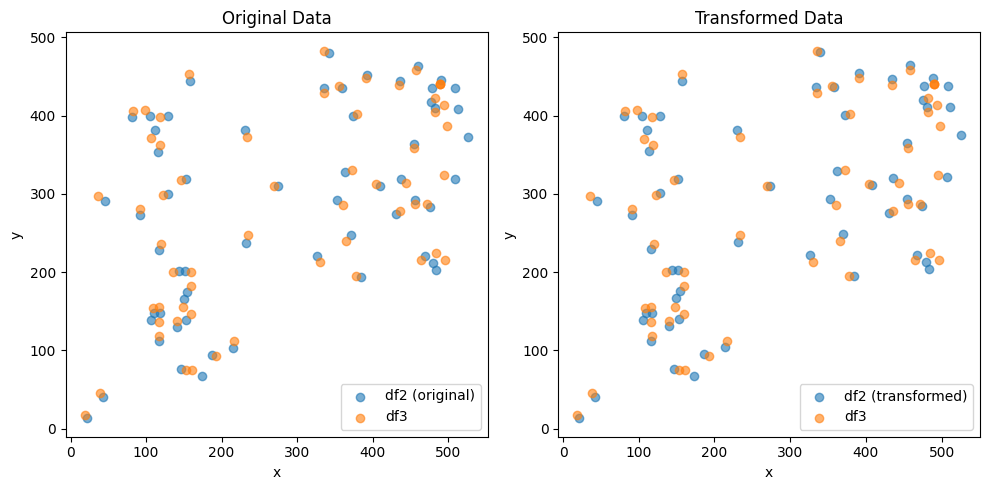

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5645825147235793e-05 , -2.861528143769137e-05 )
Rotation (radians): -0.0038276221350702425
Transform Matrix:
 [[ 9.99992675e-01  3.82761279e-03 -2.56458251e-05]
 [-3.82761279e-03  9.99992675e-01 -2.86152814e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


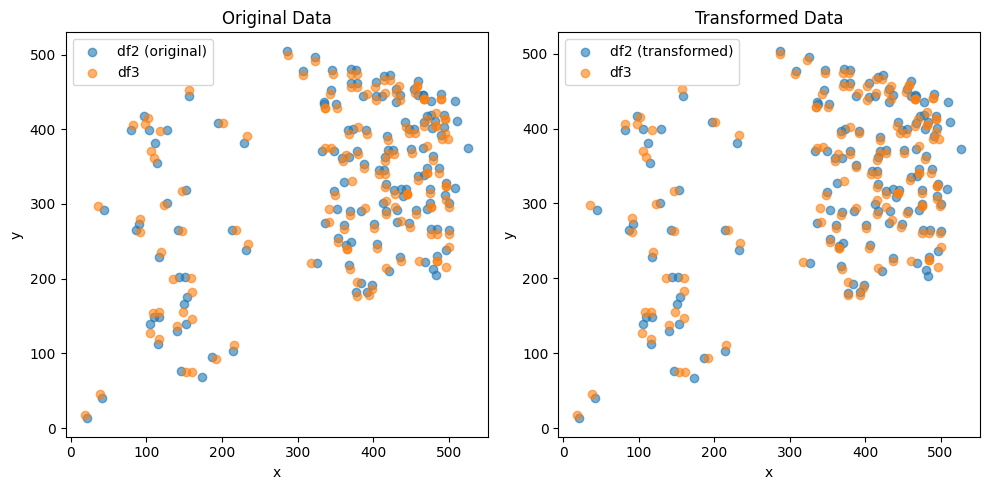

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.211116439194432e-06 , 1.5762772716292376e-05 )
Rotation (radians): 0.0038275875898084945
Transform Matrix:
 [[ 9.99992675e-01 -3.82757824e-03 -6.21111644e-06]
 [ 3.82757824e-03  9.99992675e-01  1.57627727e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


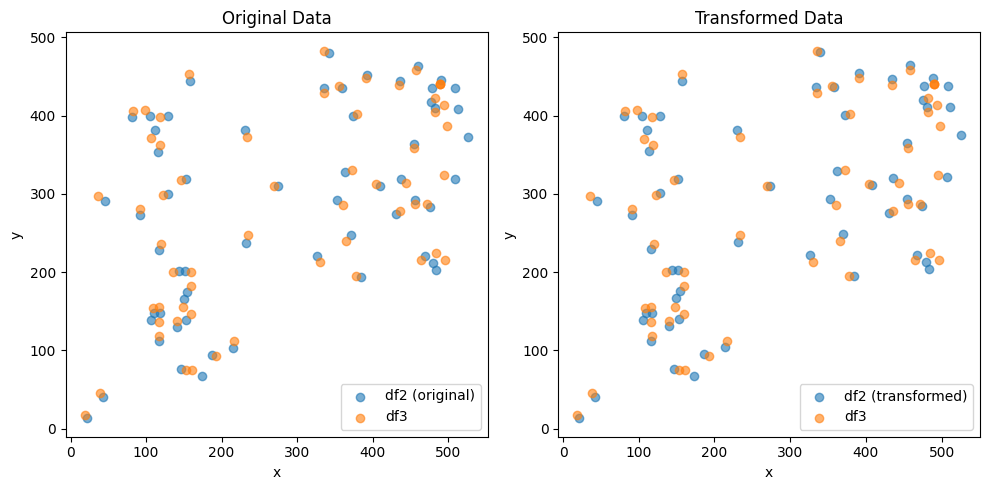

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.554424460656337e-05 , -2.8535794877516886e-05 )
Rotation (radians): -0.0038275471414028848
Transform Matrix:
 [[ 9.99992675e-01  3.82753780e-03 -2.55442446e-05]
 [-3.82753780e-03  9.99992675e-01 -2.85357949e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


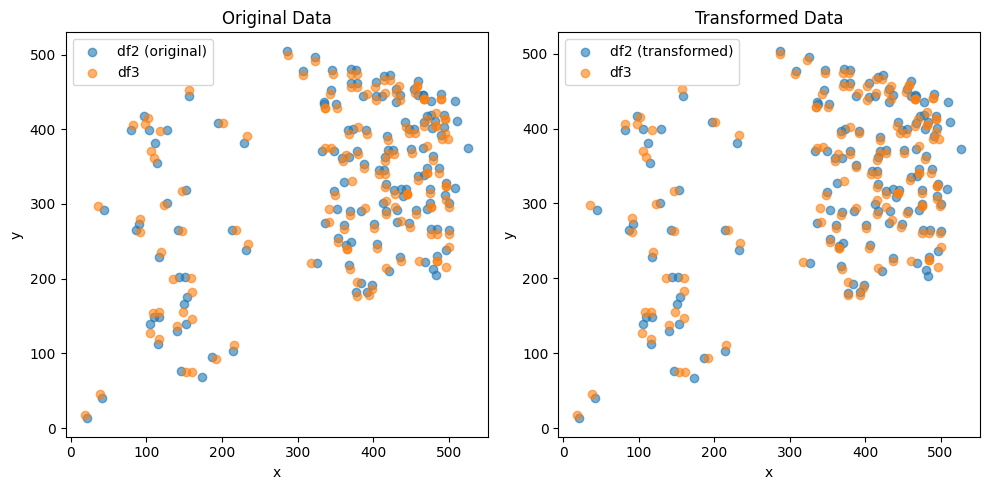

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.203751860396341e-06 , 1.5763191440664754e-05 )
Rotation (radians): 0.0038275073482712686
Transform Matrix:
 [[ 9.99992675e-01 -3.82749800e-03 -6.20375186e-06]
 [ 3.82749800e-03  9.99992675e-01  1.57631914e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


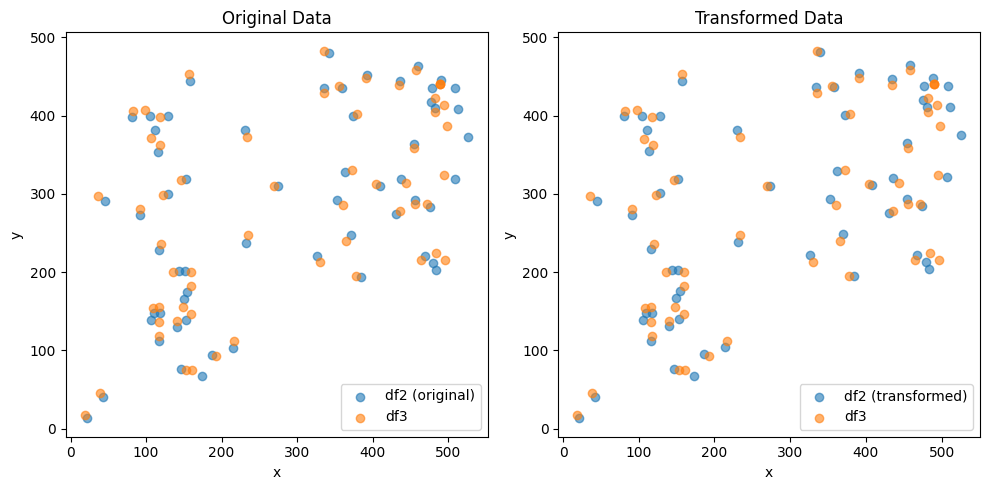

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5579018894455967e-05 , -2.8649076929121388e-05 )
Rotation (radians): -0.003827630812654944
Transform Matrix:
 [[ 9.99992675e-01  3.82762147e-03 -2.55790189e-05]
 [-3.82762147e-03  9.99992675e-01 -2.86490769e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


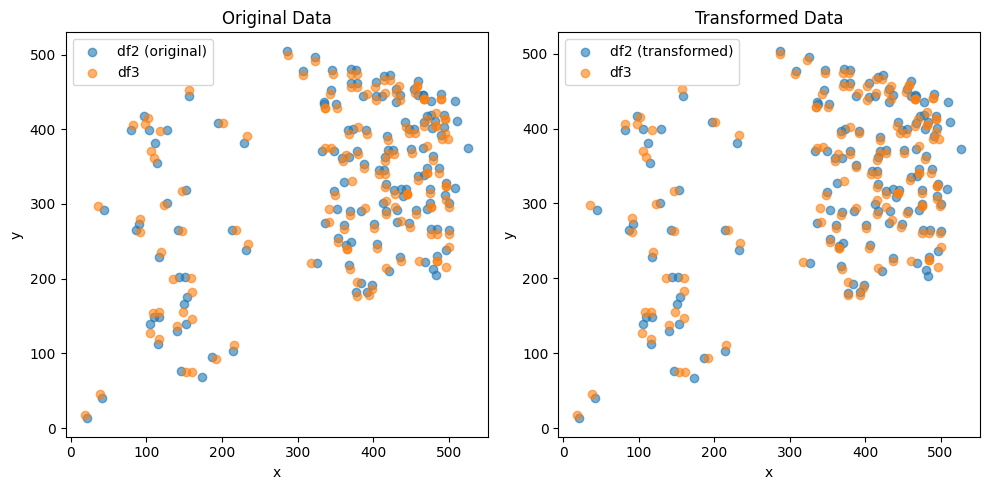

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2096413582021445e-06 , 1.575090809350919e-05 )
Rotation (radians): 0.00382761714372831
Transform Matrix:
 [[ 9.99992675e-01 -3.82760780e-03 -6.20964136e-06]
 [ 3.82760780e-03  9.99992675e-01  1.57509081e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


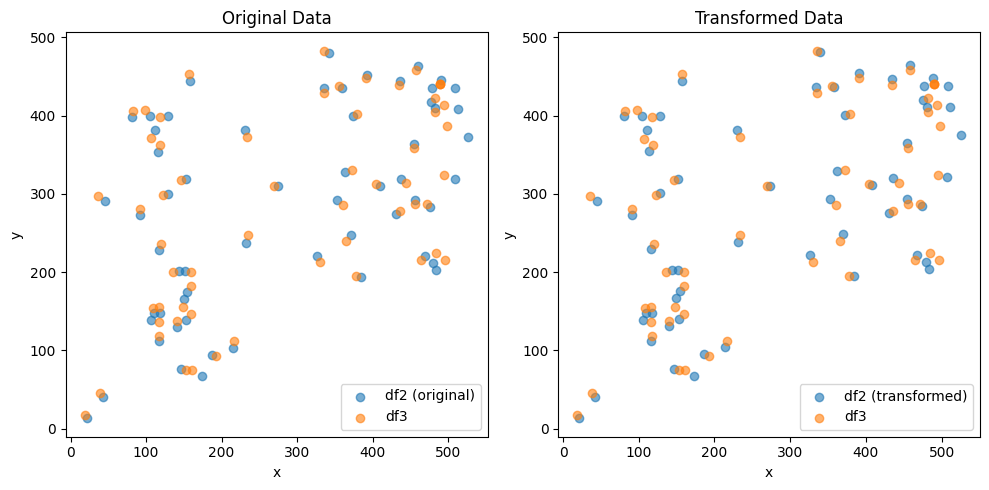

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.567974422280588e-05 , -2.8646894640908796e-05 )
Rotation (radians): -0.0038276616256799987
Transform Matrix:
 [[ 9.99992675e-01  3.82765228e-03 -2.56797442e-05]
 [-3.82765228e-03  9.99992675e-01 -2.86468946e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


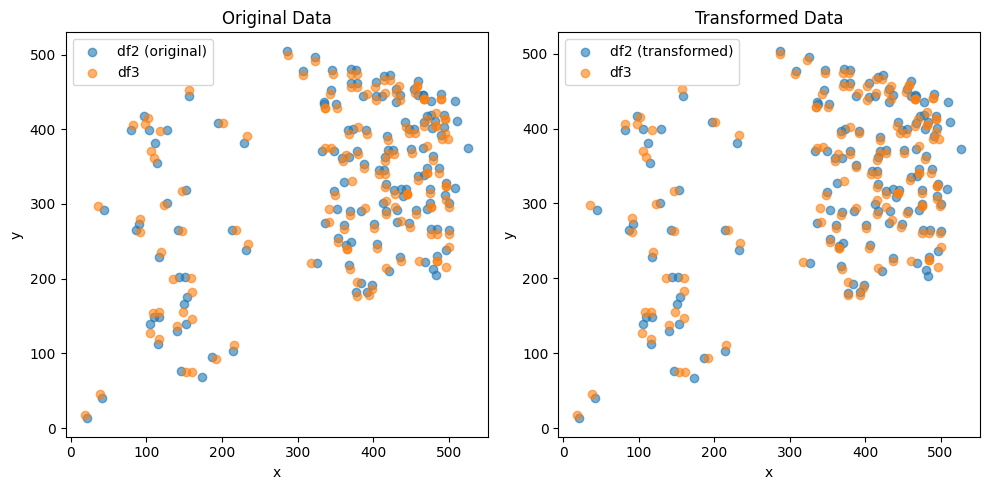

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.236958448962606e-06 , 1.5725791447635357e-05 )
Rotation (radians): 0.0038276161909106994
Transform Matrix:
 [[ 9.99992675e-01 -3.82760684e-03 -6.23695845e-06]
 [ 3.82760684e-03  9.99992675e-01  1.57257914e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


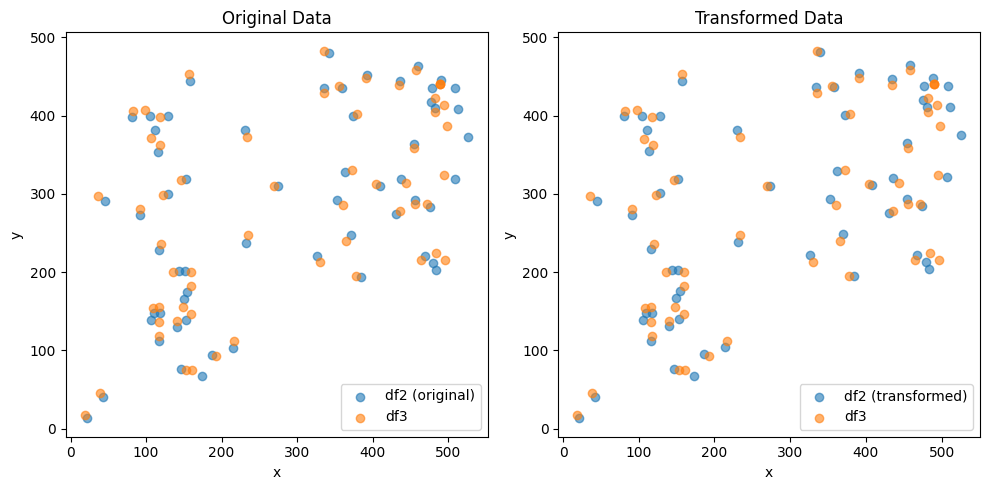

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5628562845049464e-05 , -2.8601156958710578e-05 )
Rotation (radians): -0.003827646577185065
Transform Matrix:
 [[ 9.99992675e-01  3.82763723e-03 -2.56285628e-05]
 [-3.82763723e-03  9.99992675e-01 -2.86011570e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


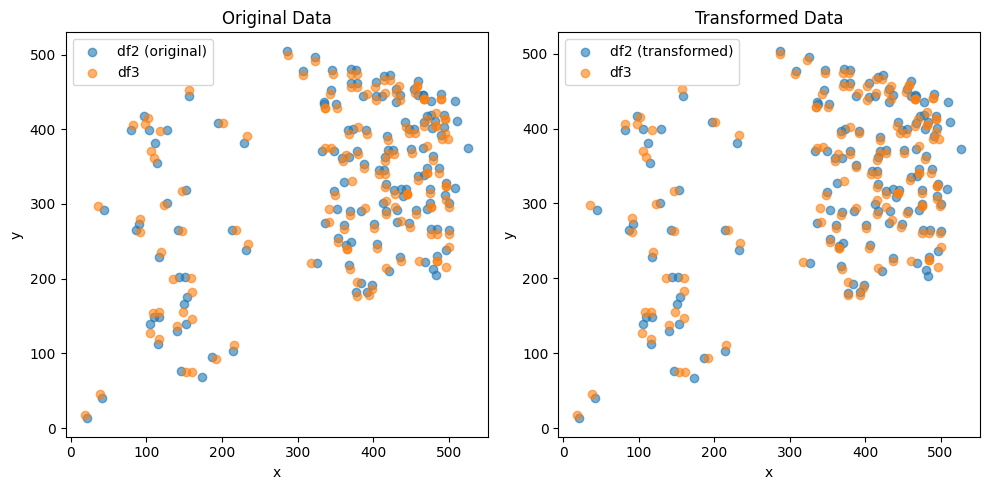

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.230558970691e-06 , 1.573684831796427e-05 )
Rotation (radians): 0.0038276228350527
Transform Matrix:
 [[ 9.99992675e-01 -3.82761349e-03 -6.23055897e-06]
 [ 3.82761349e-03  9.99992675e-01  1.57368483e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


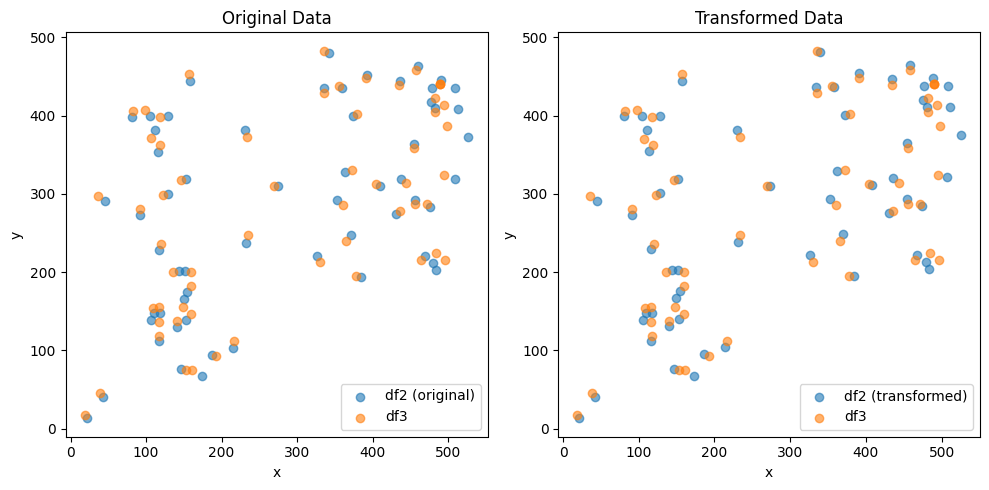

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5649936762023997e-05 , -2.8604747481086202e-05 )
Rotation (radians): -0.0038276295180840764
Transform Matrix:
 [[ 9.99992675e-01  3.82762017e-03 -2.56499368e-05]
 [-3.82762017e-03  9.99992675e-01 -2.86047475e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


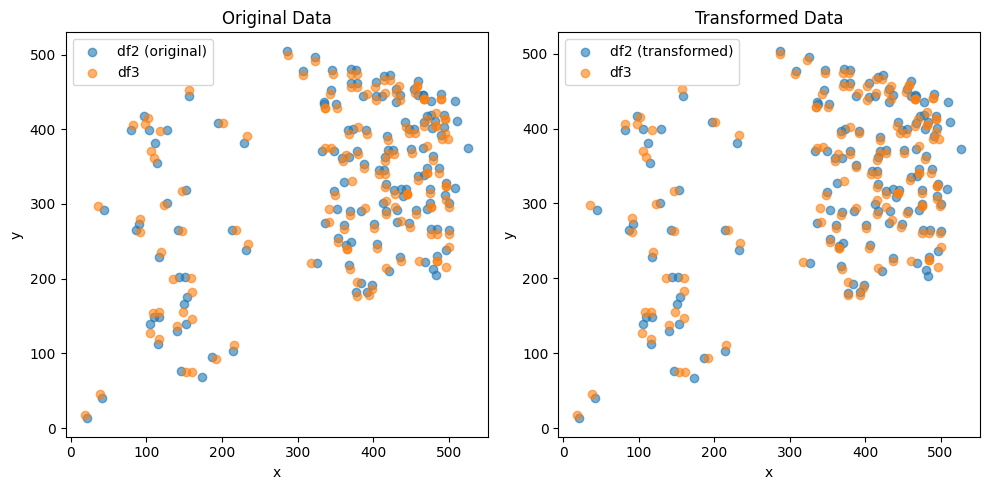

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.194165281024245e-06 , 1.5772032721210602e-05 )
Rotation (radians): 0.003827612193840595
Transform Matrix:
 [[ 9.99992675e-01 -3.82760285e-03 -6.19416528e-06]
 [ 3.82760285e-03  9.99992675e-01  1.57720327e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


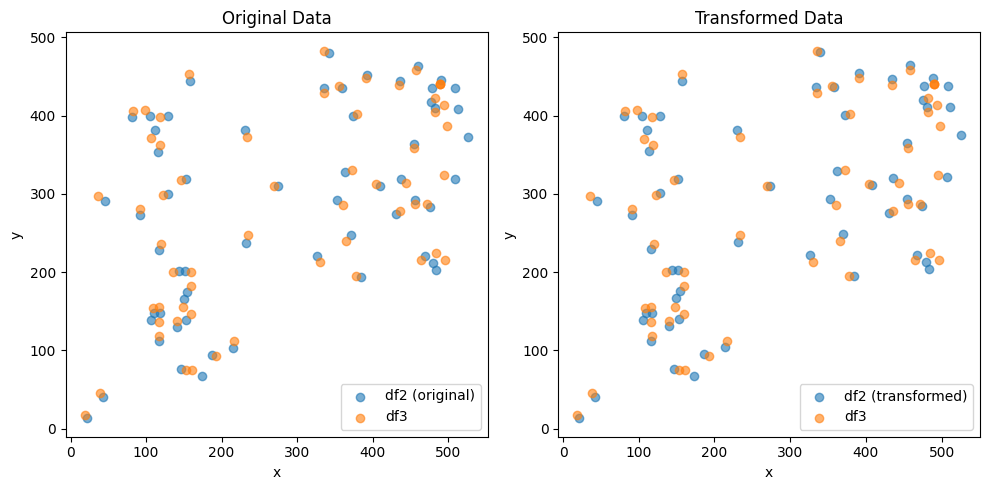

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.561616232155038e-05 , -2.8616947957072297e-05 )
Rotation (radians): -0.003827614503672865
Transform Matrix:
 [[ 9.99992675e-01  3.82760516e-03 -2.56161623e-05]
 [-3.82760516e-03  9.99992675e-01 -2.86169480e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


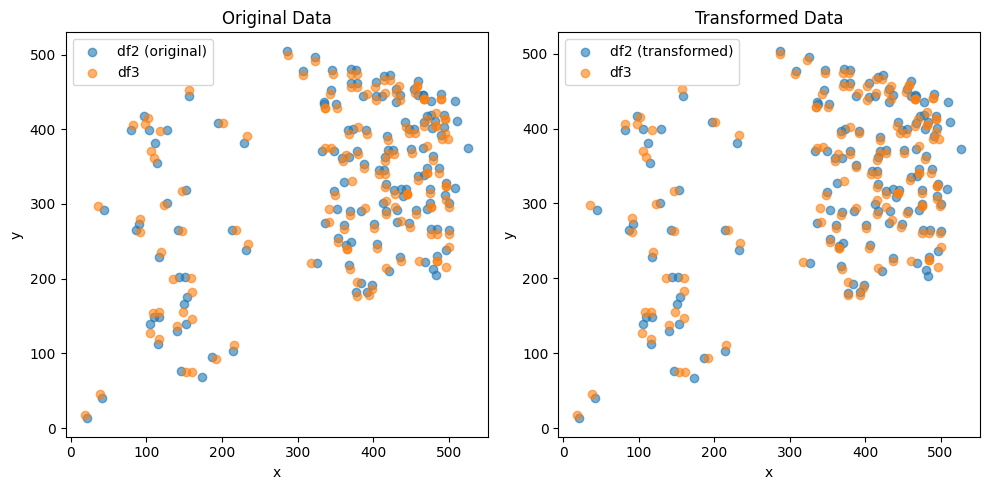

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.211878999051263e-06 , 1.5760480306525734e-05 )
Rotation (radians): 0.003827578270422611
Transform Matrix:
 [[ 9.99992675e-01 -3.82756892e-03 -6.21187900e-06]
 [ 3.82756892e-03  9.99992675e-01  1.57604803e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


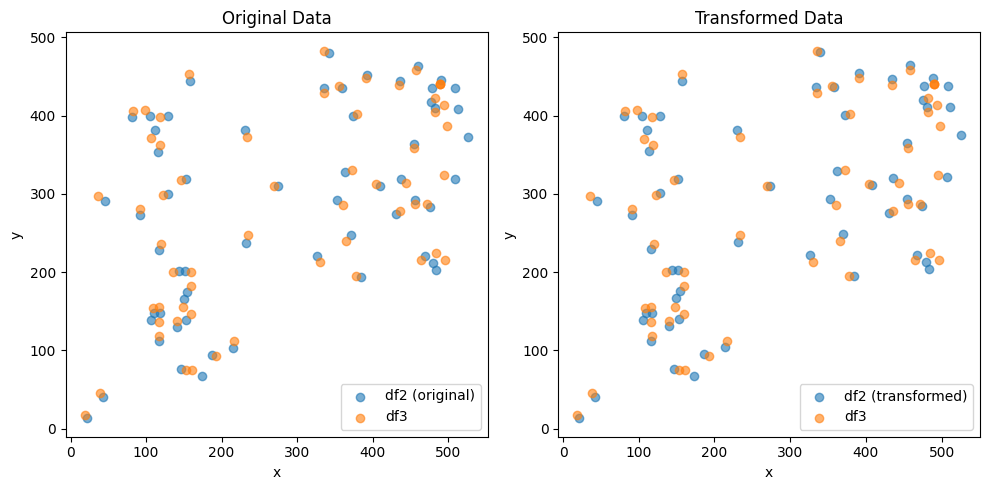

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5601989060521e-05 , -2.857289802775006e-05 )
Rotation (radians): -0.003827625132555206
Transform Matrix:
 [[ 9.99992675e-01  3.82761579e-03 -2.56019891e-05]
 [-3.82761579e-03  9.99992675e-01 -2.85728980e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


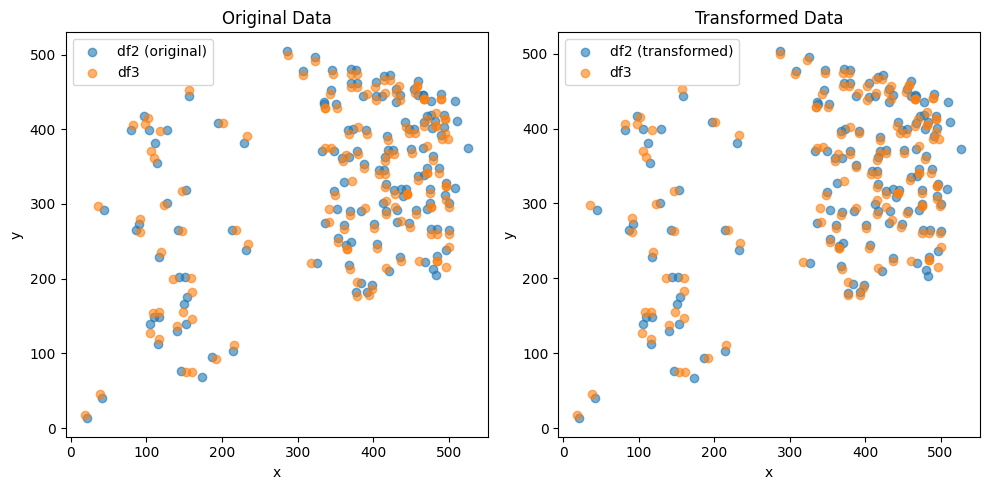

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.210400897687809e-06 , 1.573930009547416e-05 )
Rotation (radians): 0.0038275936729862347
Transform Matrix:
 [[ 9.99992675e-01 -3.82758433e-03 -6.21040090e-06]
 [ 3.82758433e-03  9.99992675e-01  1.57393001e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


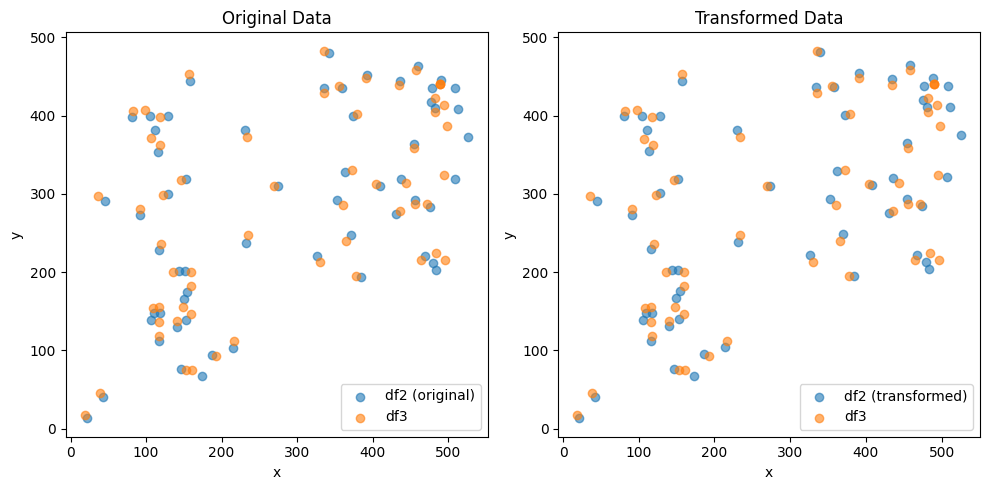

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.557086783643176e-05 , -2.8595042886741426e-05 )
Rotation (radians): -0.00382758851723742
Transform Matrix:
 [[ 9.99992675e-01  3.82757917e-03 -2.55708678e-05]
 [-3.82757917e-03  9.99992675e-01 -2.85950429e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


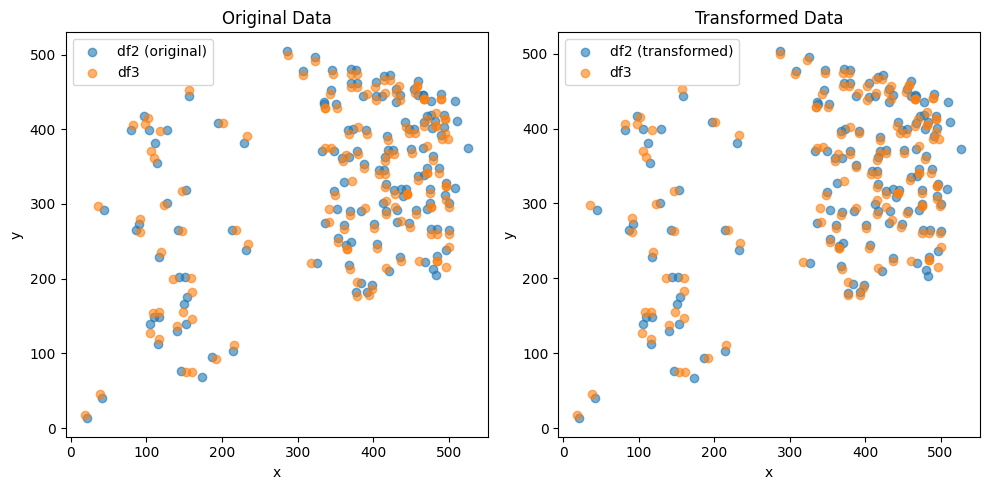

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.222941895503597e-06 , 1.5744884296349047e-05 )
Rotation (radians): 0.0038275499265370675
Transform Matrix:
 [[ 9.99992675e-01 -3.82754058e-03 -6.22294190e-06]
 [ 3.82754058e-03  9.99992675e-01  1.57448843e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


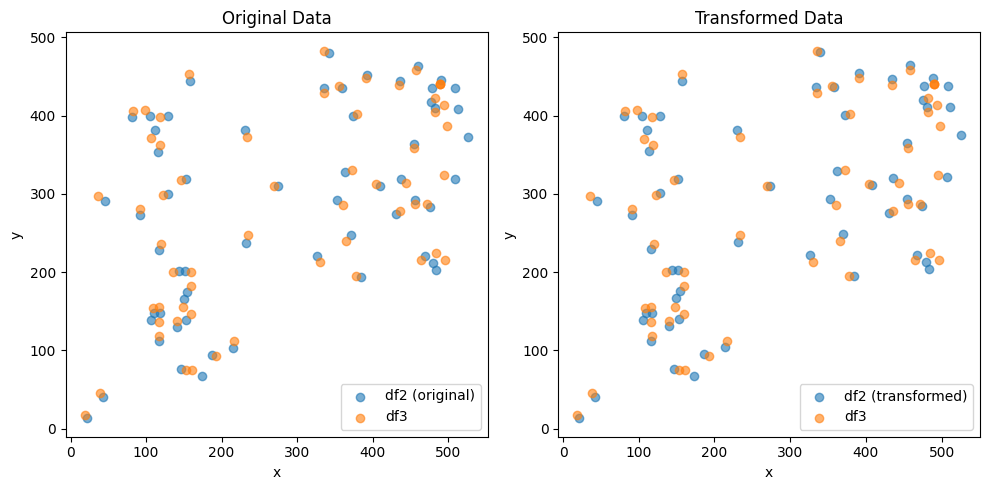

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5635391663597707e-05 , -2.858632931523592e-05 )
Rotation (radians): -0.0038276361103845103
Transform Matrix:
 [[ 9.99992675e-01  3.82762676e-03 -2.56353917e-05]
 [-3.82762676e-03  9.99992675e-01 -2.85863293e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


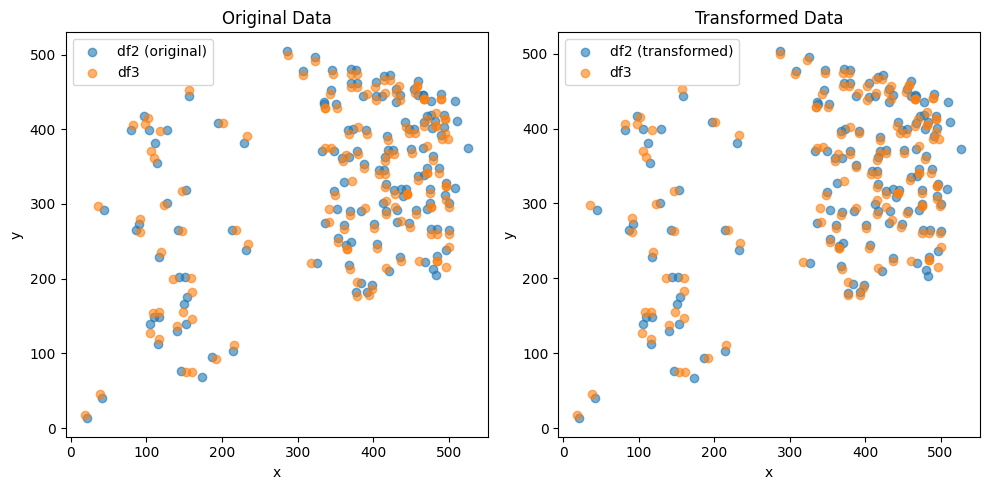

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.231807317501075e-06 , 1.5721394020581107e-05 )
Rotation (radians): 0.0038276049011539705
Transform Matrix:
 [[ 9.99992675e-01 -3.82759556e-03 -6.23180732e-06]
 [ 3.82759556e-03  9.99992675e-01  1.57213940e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


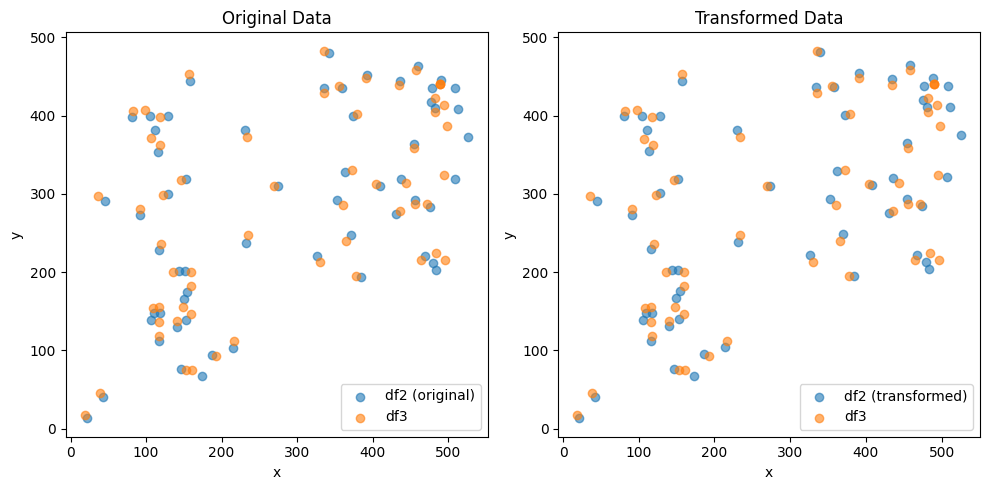

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5567949625005707e-05 , -2.8589617658342367e-05 )
Rotation (radians): -0.0038276048355336935
Transform Matrix:
 [[ 9.99992675e-01  3.82759549e-03 -2.55679496e-05]
 [-3.82759549e-03  9.99992675e-01 -2.85896177e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


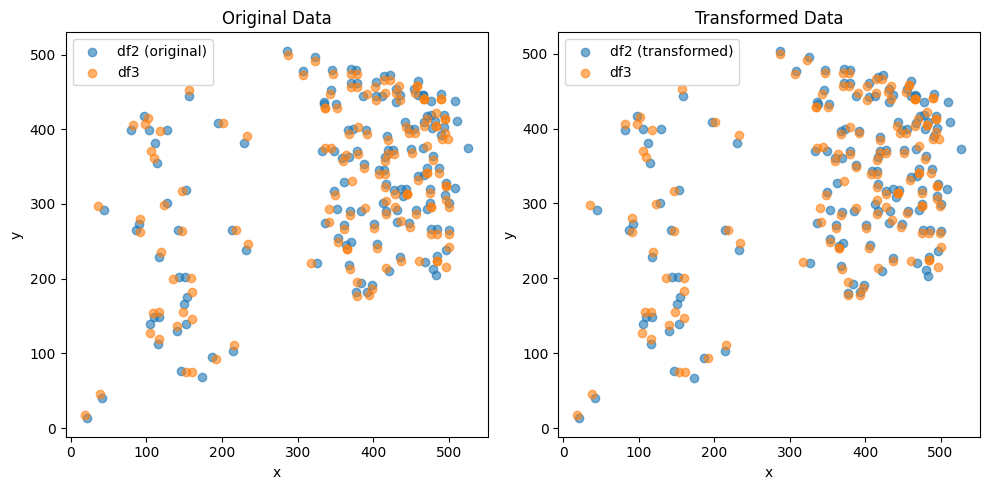

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2121114391201955e-06 , 1.578048226564074e-05 )
Rotation (radians): 0.003827592698444519
Transform Matrix:
 [[ 9.99992675e-01 -3.82758335e-03 -6.21211144e-06]
 [ 3.82758335e-03  9.99992675e-01  1.57804823e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


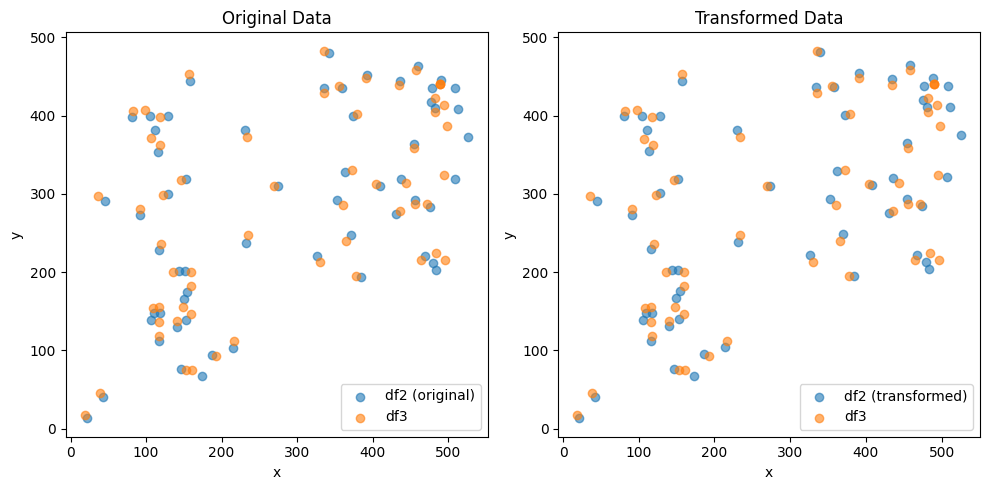

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5567450223928296e-05 , -2.860896559605122e-05 )
Rotation (radians): -0.003827580838965853
Transform Matrix:
 [[ 9.99992675e-01  3.82757149e-03 -2.55674502e-05]
 [-3.82757149e-03  9.99992675e-01 -2.86089656e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


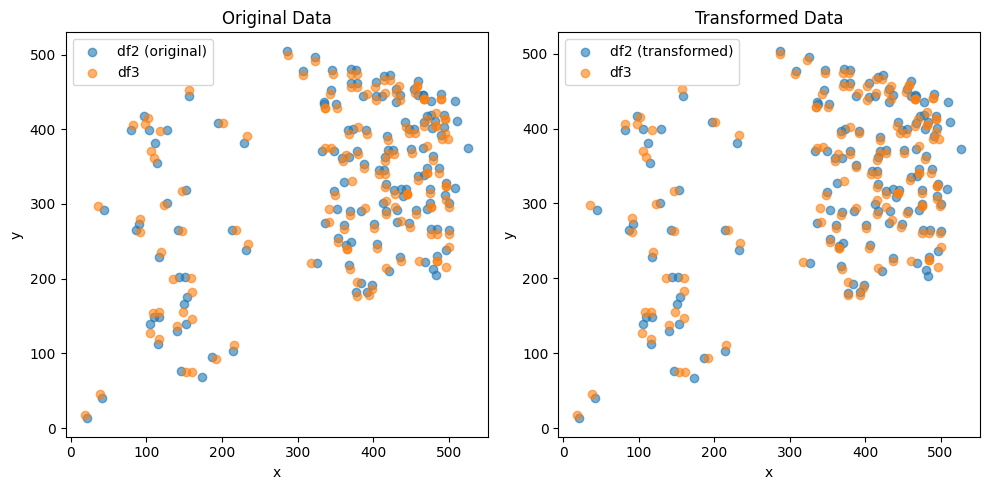

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.204008081131782e-06 , 1.5763292268736246e-05 )
Rotation (radians): 0.003827544275708129
Transform Matrix:
 [[ 9.99992675e-01 -3.82753493e-03 -6.20400808e-06]
 [ 3.82753493e-03  9.99992675e-01  1.57632923e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


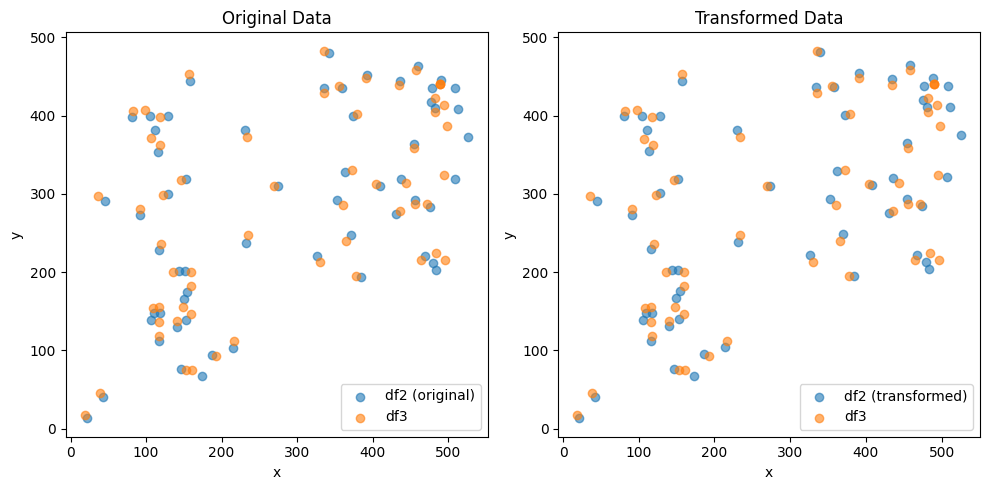

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.559937555672924e-05 , -2.8608249906409847e-05 )
Rotation (radians): -0.0038276356144645854
Transform Matrix:
 [[ 9.99992675e-01  3.82762627e-03 -2.55993756e-05]
 [-3.82762627e-03  9.99992675e-01 -2.86082499e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


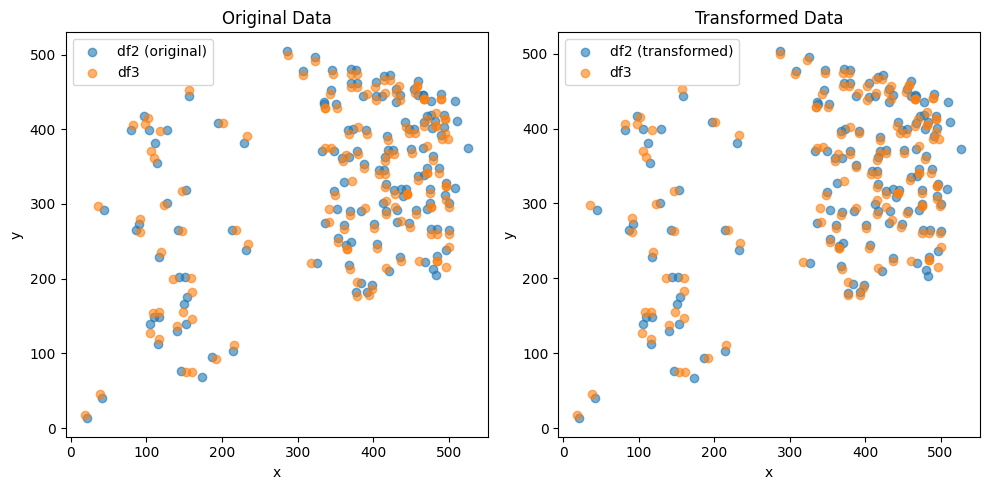

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2317911865531525e-06 , 1.576754700691533e-05 )
Rotation (radians): 0.003827589834755005
Transform Matrix:
 [[ 9.99992675e-01 -3.82758049e-03 -6.23179119e-06]
 [ 3.82758049e-03  9.99992675e-01  1.57675470e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


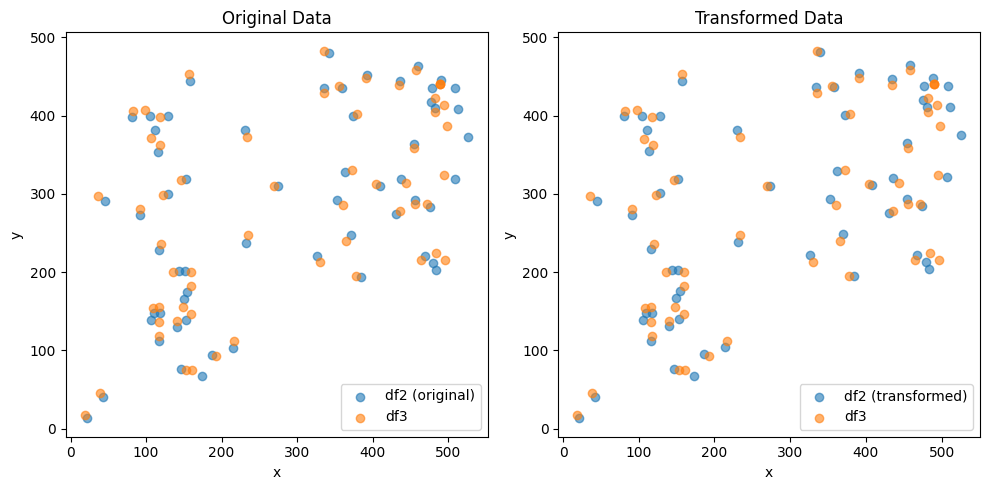

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.557254081461159e-05 , -2.8555249433915424e-05 )
Rotation (radians): -0.0038276281327303484
Transform Matrix:
 [[ 9.99992675e-01  3.82761879e-03 -2.55725408e-05]
 [-3.82761879e-03  9.99992675e-01 -2.85552494e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


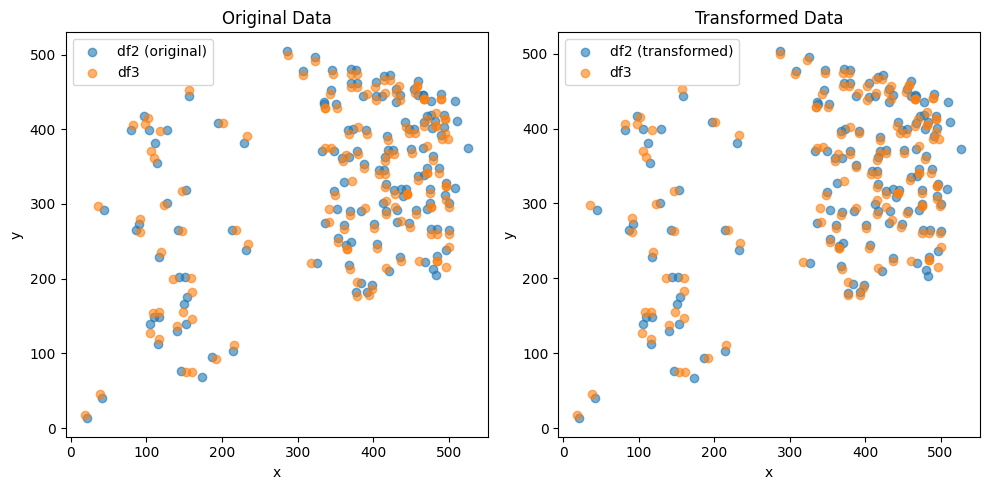

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.217538788187947e-06 , 1.5759050698187103e-05 )
Rotation (radians): 0.003827615564805432
Transform Matrix:
 [[ 9.99992675e-01 -3.82760622e-03 -6.21753879e-06]
 [ 3.82760622e-03  9.99992675e-01  1.57590507e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


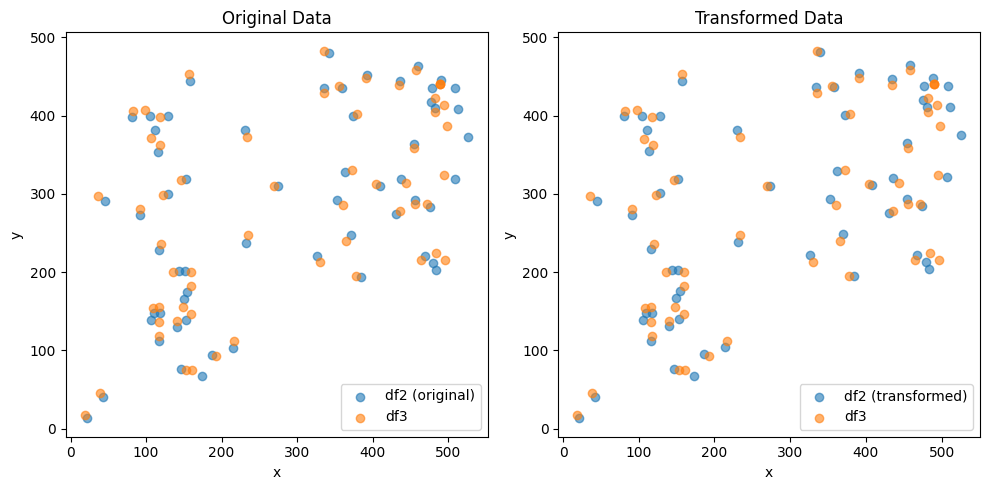

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.562001388724263e-05 , -2.865265772881148e-05 )
Rotation (radians): -0.00382767584055217
Transform Matrix:
 [[ 9.99992674e-01  3.82766649e-03 -2.56200139e-05]
 [-3.82766649e-03  9.99992674e-01 -2.86526577e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


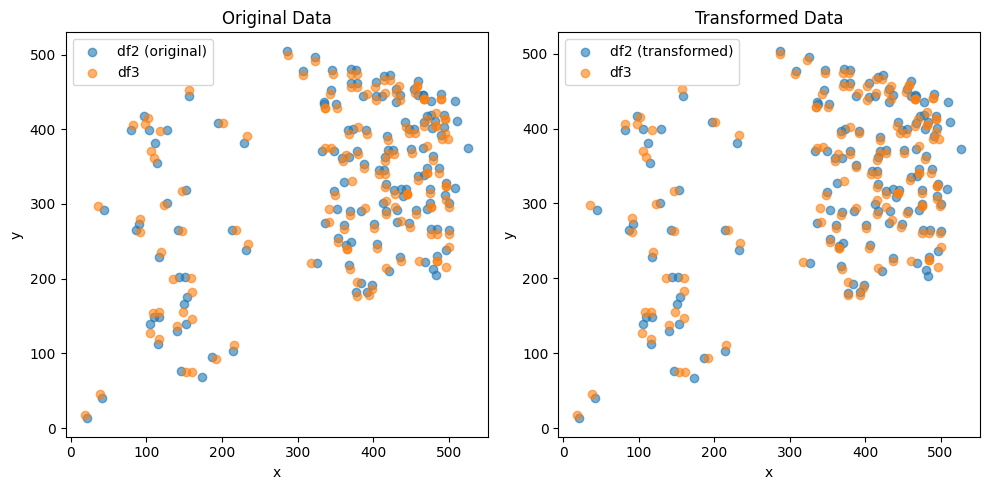

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2027842058702886e-06 , 1.5768857281655792e-05 )
Rotation (radians): 0.003827647413246654
Transform Matrix:
 [[ 9.99992675e-01 -3.82763807e-03 -6.20278421e-06]
 [ 3.82763807e-03  9.99992675e-01  1.57688573e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


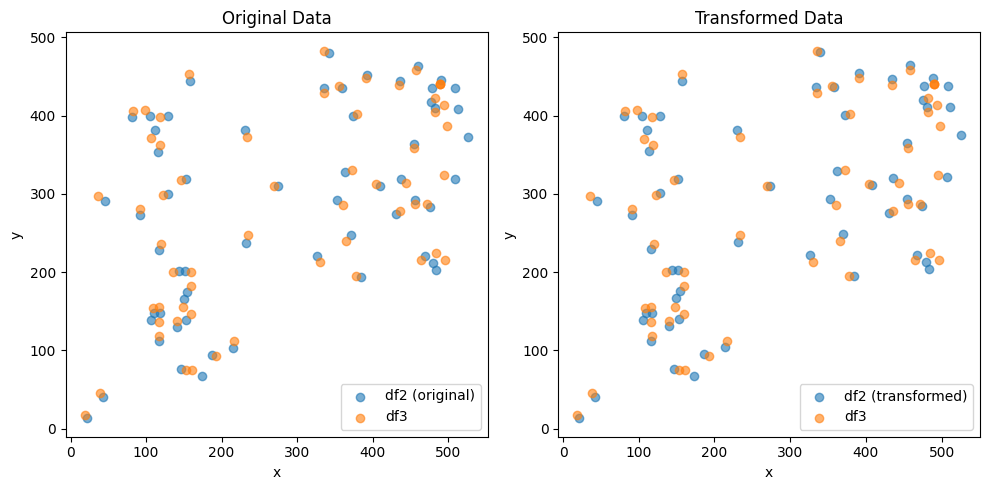

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.560924495858629e-05 , -2.8564810567207514e-05 )
Rotation (radians): -0.0038276287911066147
Transform Matrix:
 [[ 9.99992675e-01  3.82761944e-03 -2.56092450e-05]
 [-3.82761944e-03  9.99992675e-01 -2.85648106e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


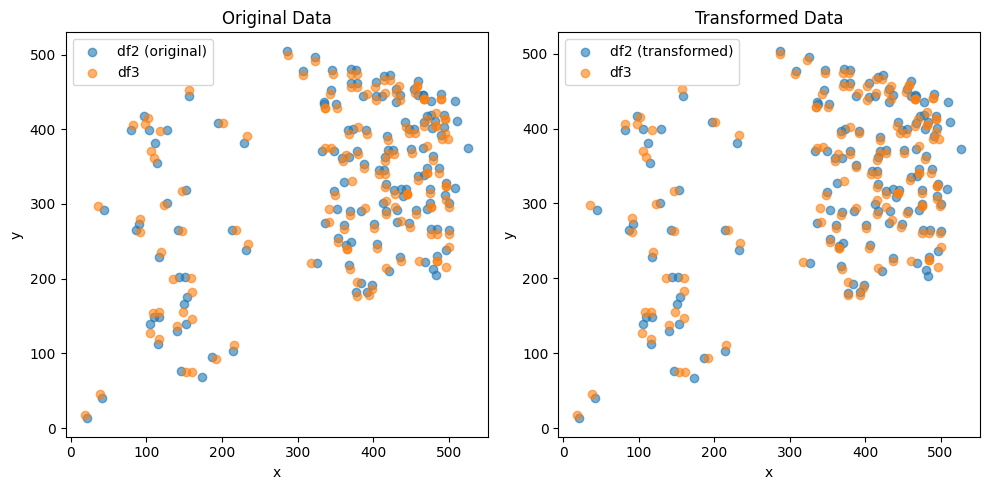

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.194678788869131e-06 , 1.576327590253422e-05 )
Rotation (radians): 0.0038275966915206606
Transform Matrix:
 [[ 9.99992675e-01 -3.82758735e-03 -6.19467879e-06]
 [ 3.82758735e-03  9.99992675e-01  1.57632759e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


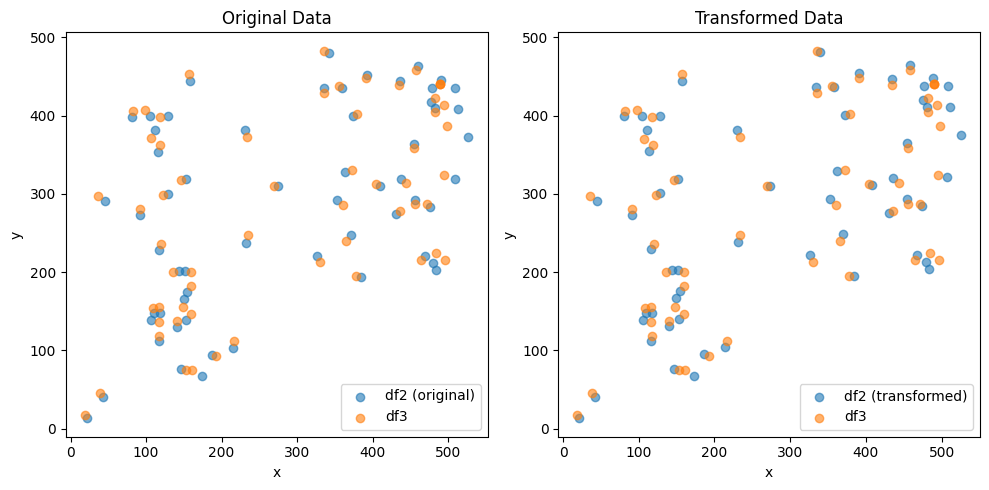

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5550572337603754e-05 , -2.8549380865286108e-05 )
Rotation (radians): -0.003827605700153334
Transform Matrix:
 [[ 9.99992675e-01  3.82759635e-03 -2.55505723e-05]
 [-3.82759635e-03  9.99992675e-01 -2.85493809e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


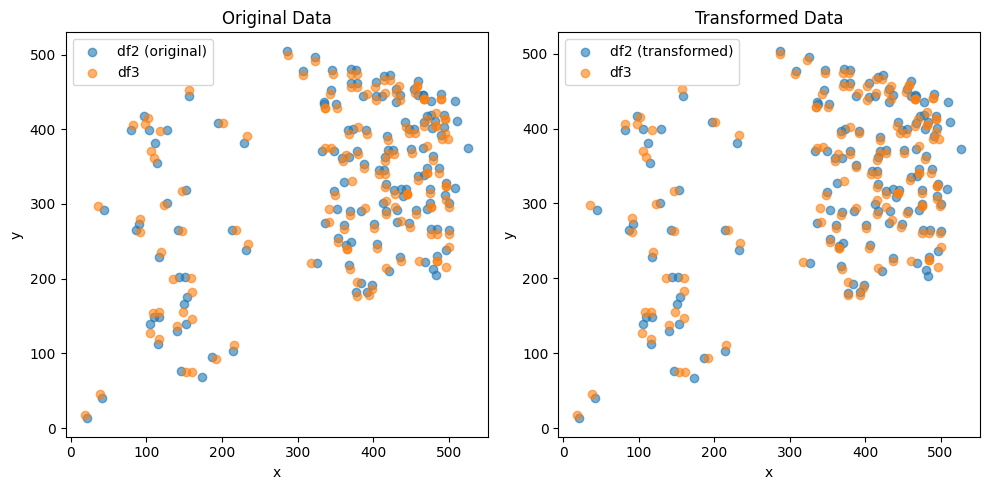

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.204984203061731e-06 , 1.575034120636588e-05 )
Rotation (radians): 0.0038275649998530713
Transform Matrix:
 [[ 9.99992675e-01 -3.82755565e-03 -6.20498420e-06]
 [ 3.82755565e-03  9.99992675e-01  1.57503412e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


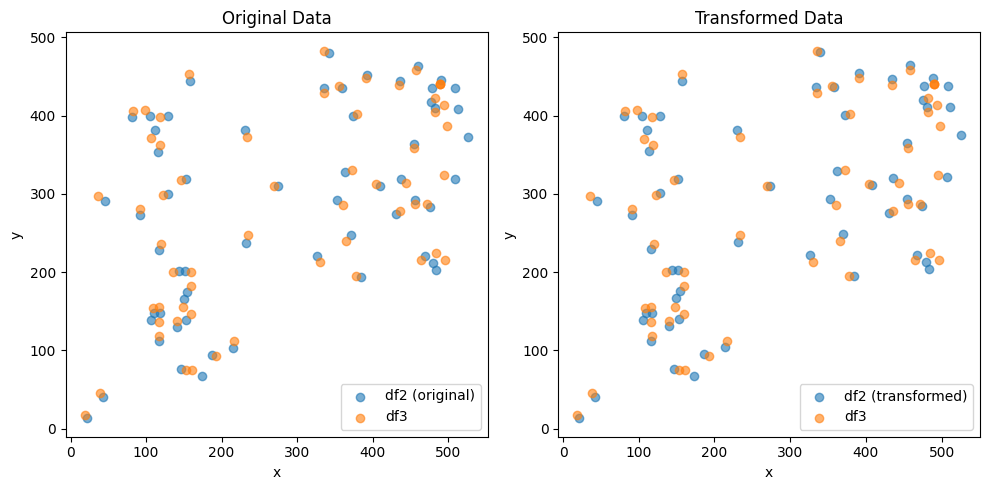

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.558526270166737e-05 , -2.8606964593084705e-05 )
Rotation (radians): -0.003827634600356316
Transform Matrix:
 [[ 9.99992675e-01  3.82762525e-03 -2.55852627e-05]
 [-3.82762525e-03  9.99992675e-01 -2.86069646e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


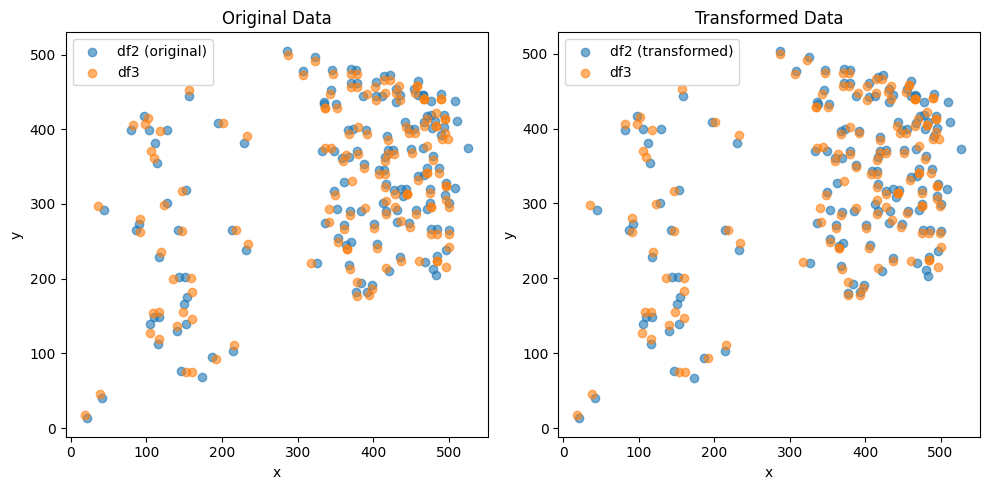

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.200801366434719e-06 , 1.576521419213096e-05 )
Rotation (radians): 0.0038276251129310017
Transform Matrix:
 [[ 9.99992675e-01 -3.82761577e-03 -6.20080137e-06]
 [ 3.82761577e-03  9.99992675e-01  1.57652142e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


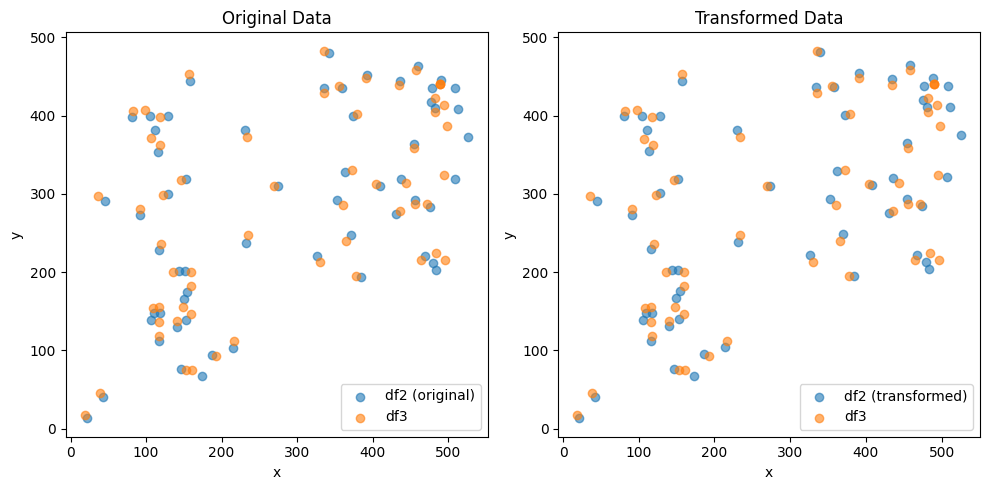

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.561522325195453e-05 , -2.8595813167710203e-05 )
Rotation (radians): -0.0038276351826718935
Transform Matrix:
 [[ 9.99992675e-01  3.82762584e-03 -2.56152233e-05]
 [-3.82762584e-03  9.99992675e-01 -2.85958132e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


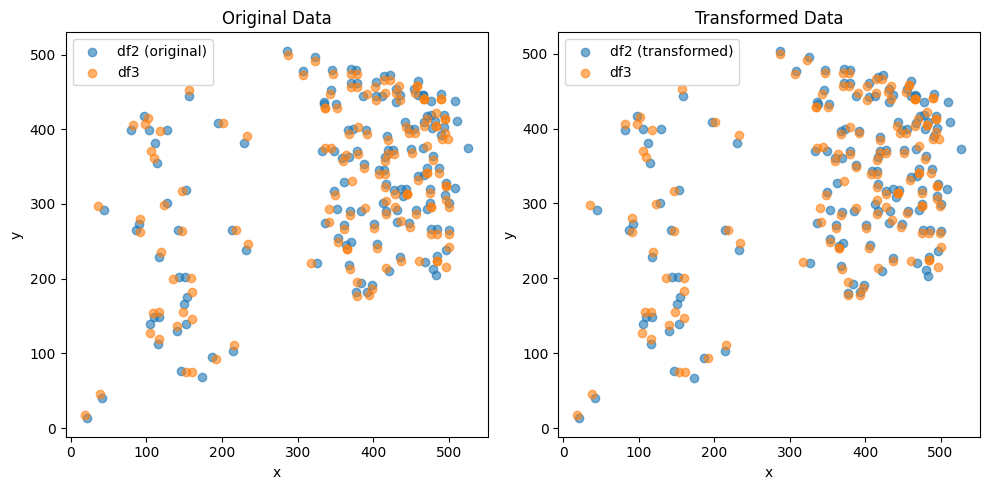

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.190964545022832e-06 , 1.575746725759971e-05 )
Rotation (radians): 0.003827588002800288
Transform Matrix:
 [[ 9.99992675e-01 -3.82757866e-03 -6.19096455e-06]
 [ 3.82757866e-03  9.99992675e-01  1.57574673e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


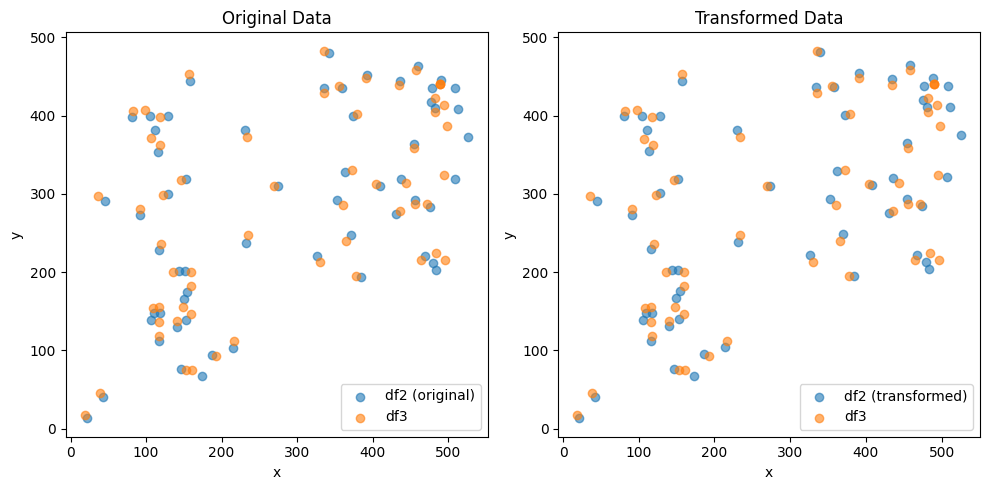

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5528132916301755e-05 , -2.8513245423390374e-05 )
Rotation (radians): -0.0038275212926118887
Transform Matrix:
 [[ 9.99992675e-01  3.82751195e-03 -2.55281329e-05]
 [-3.82751195e-03  9.99992675e-01 -2.85132454e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


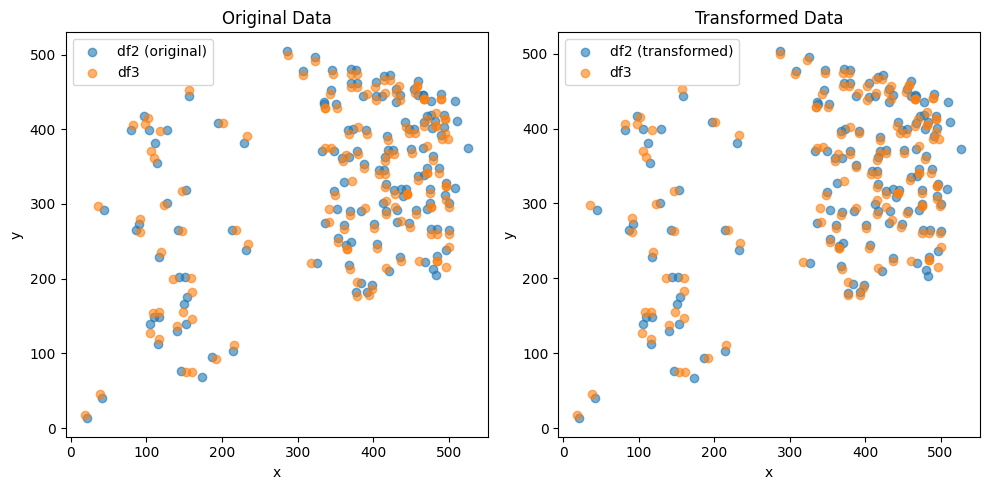

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.233290435269687e-06 , 1.5757447166414657e-05 )
Rotation (radians): 0.0038274892694814423
Transform Matrix:
 [[ 9.99992675e-01 -3.82747992e-03 -6.23329044e-06]
 [ 3.82747992e-03  9.99992675e-01  1.57574472e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


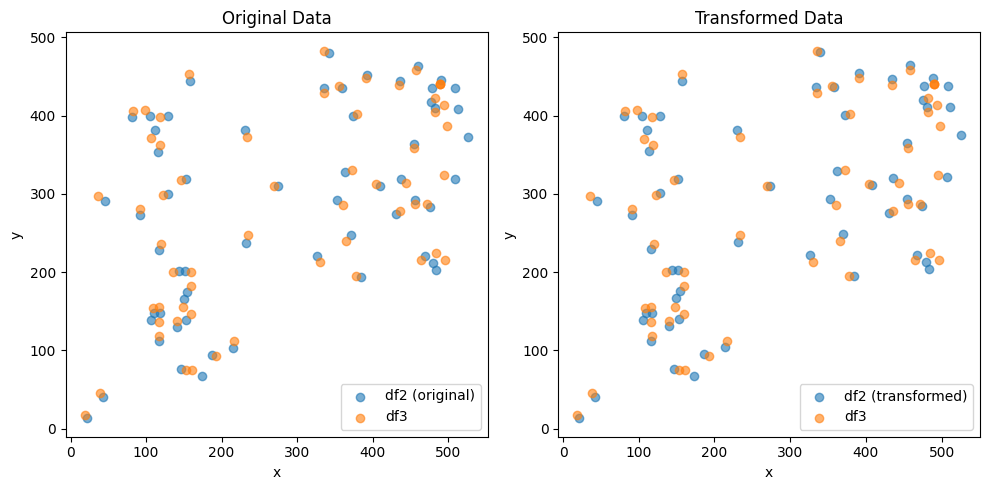

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5526557608447225e-05 , -2.8538436454582504e-05 )
Rotation (radians): -0.0038275364717938283
Transform Matrix:
 [[ 9.99992675e-01  3.82752713e-03 -2.55265576e-05]
 [-3.82752713e-03  9.99992675e-01 -2.85384365e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


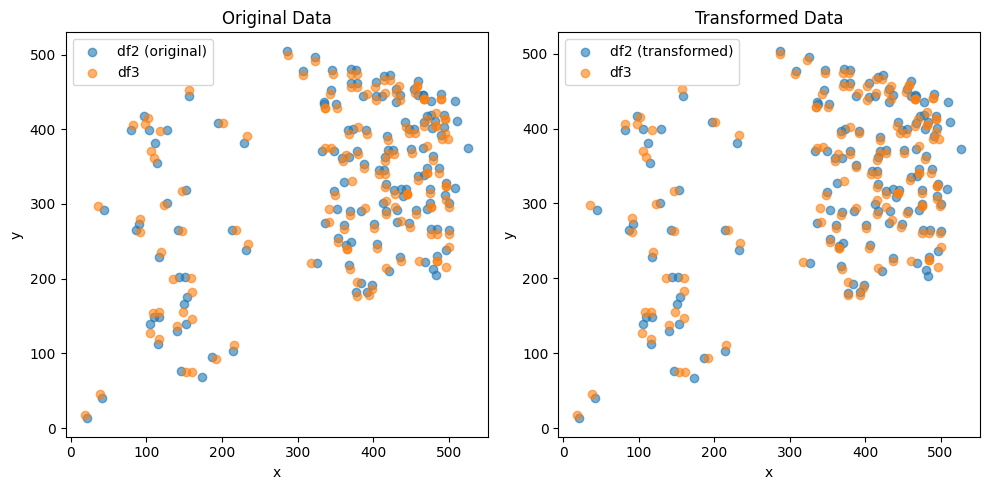

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.225652933277746e-06 , 1.57568801173922e-05 )
Rotation (radians): 0.0038275300062834213
Transform Matrix:
 [[ 9.99992675e-01 -3.82752066e-03 -6.22565293e-06]
 [ 3.82752066e-03  9.99992675e-01  1.57568801e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


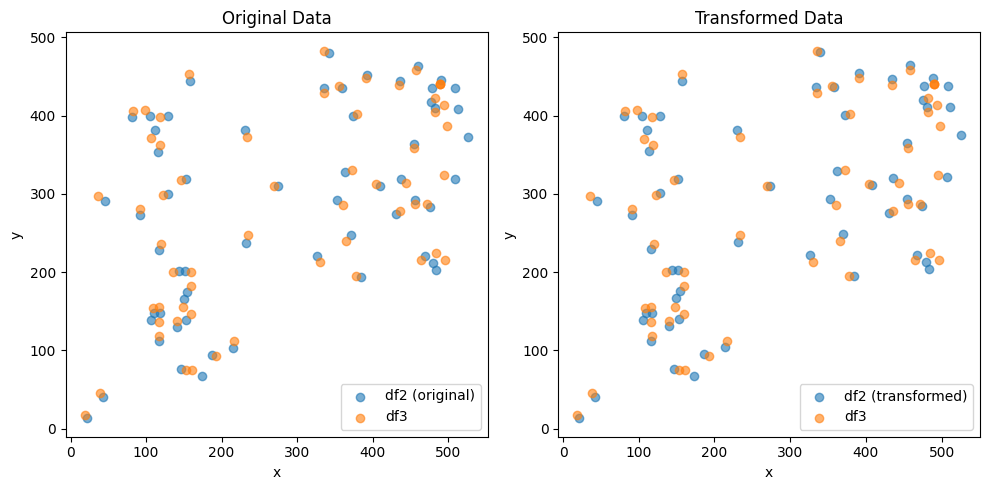

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5515360869949803e-05 , -2.8617035831300916e-05 )
Rotation (radians): -0.0038275948952033985
Transform Matrix:
 [[ 9.99992675e-01  3.82758555e-03 -2.55153609e-05]
 [-3.82758555e-03  9.99992675e-01 -2.86170358e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


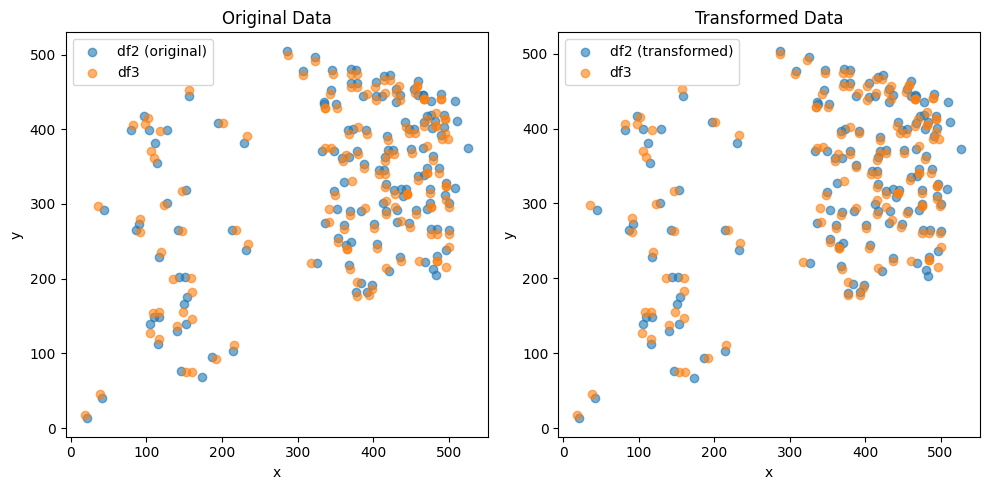

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.204016707442015e-06 , 1.5777358261257237e-05 )
Rotation (radians): 0.0038275540422394116
Transform Matrix:
 [[ 9.99992675e-01 -3.82754470e-03 -6.20401671e-06]
 [ 3.82754470e-03  9.99992675e-01  1.57773583e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


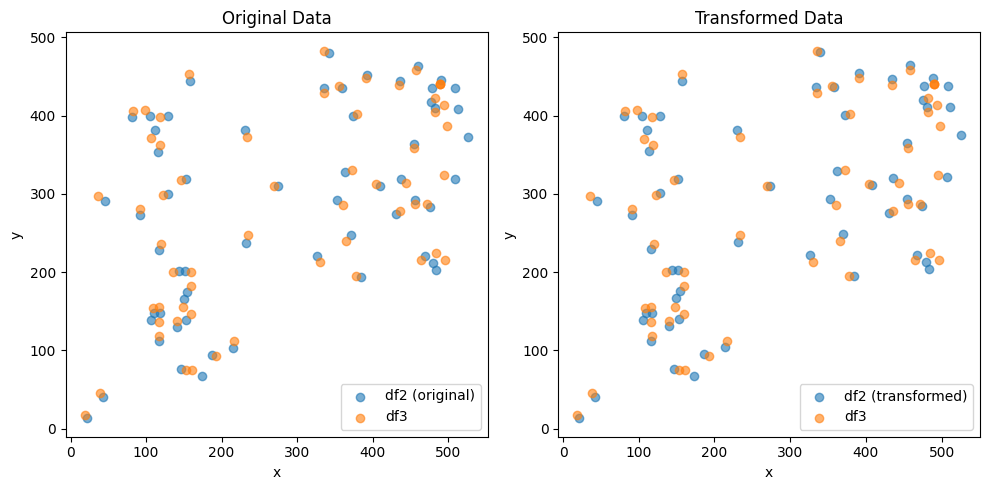

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5638017523765348e-05 , -2.8631278412366753e-05 )
Rotation (radians): -0.0038276975018414266
Transform Matrix:
 [[ 9.99992674e-01  3.82768816e-03 -2.56380175e-05]
 [-3.82768816e-03  9.99992674e-01 -2.86312784e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


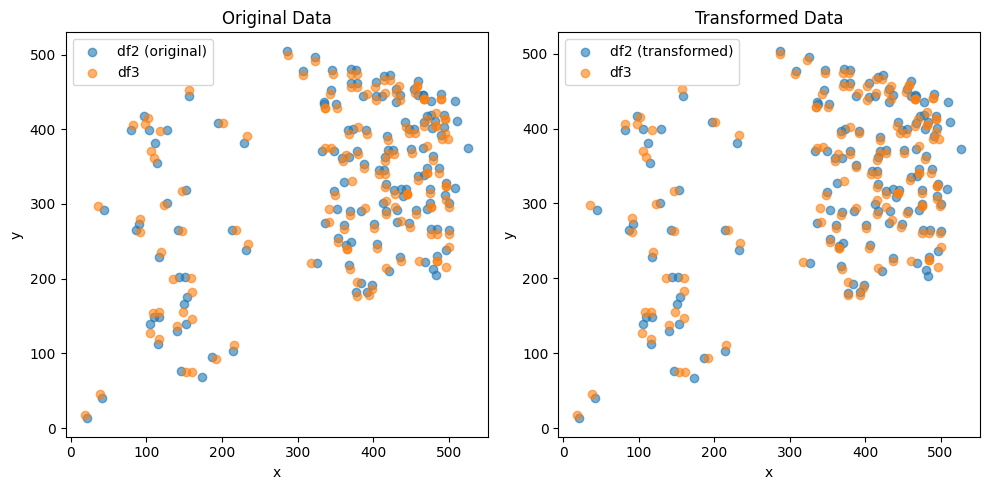

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.229596763856196e-06 , 1.5746110932664823e-05 )
Rotation (radians): 0.0038276643793879466
Transform Matrix:
 [[ 9.99992675e-01 -3.82765503e-03 -6.22959676e-06]
 [ 3.82765503e-03  9.99992675e-01  1.57461109e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


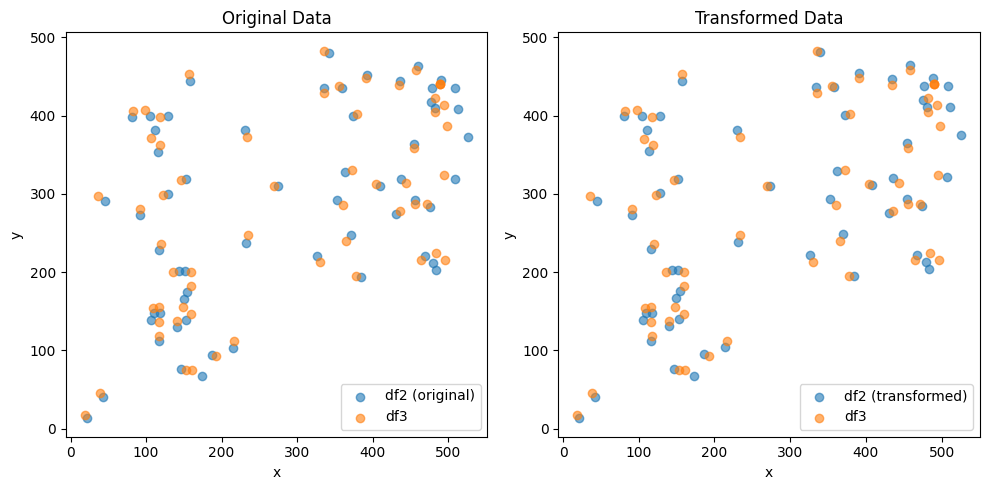

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5599801881714292e-05 , -2.864828201286929e-05 )
Rotation (radians): -0.0038276890408988806
Transform Matrix:
 [[ 9.99992674e-01  3.82767969e-03 -2.55998019e-05]
 [-3.82767969e-03  9.99992674e-01 -2.86482820e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


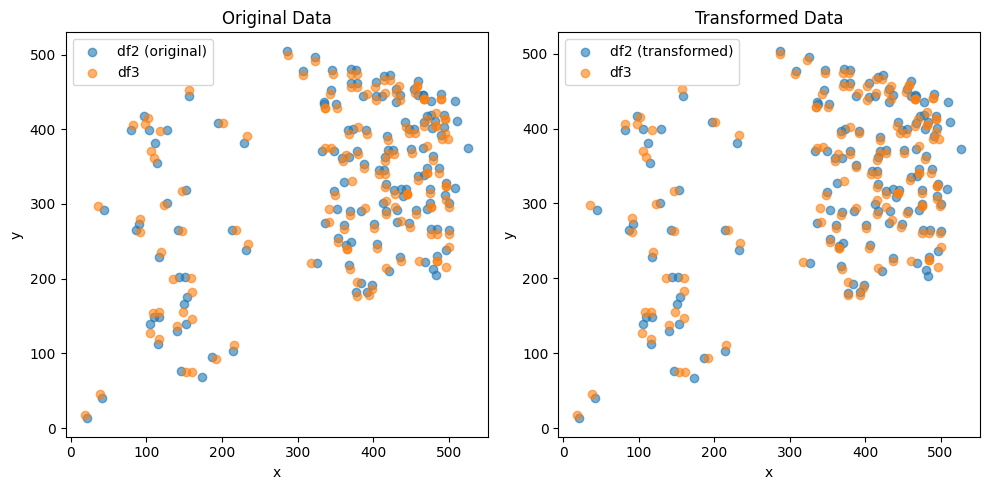

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2354888526424775e-06 , 1.5738299068320456e-05 )
Rotation (radians): 0.0038276450051752124
Transform Matrix:
 [[ 9.99992675e-01 -3.82763566e-03 -6.23548885e-06]
 [ 3.82763566e-03  9.99992675e-01  1.57382991e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


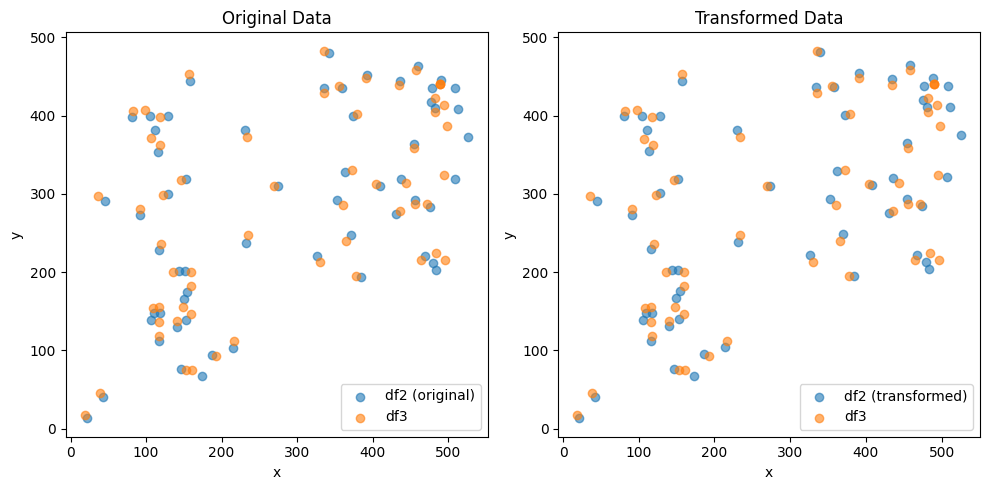

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5652148186127707e-05 , -2.865398779514546e-05 )
Rotation (radians): -0.0038276424340134532
Transform Matrix:
 [[ 9.99992675e-01  3.82763309e-03 -2.56521482e-05]
 [-3.82763309e-03  9.99992675e-01 -2.86539878e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


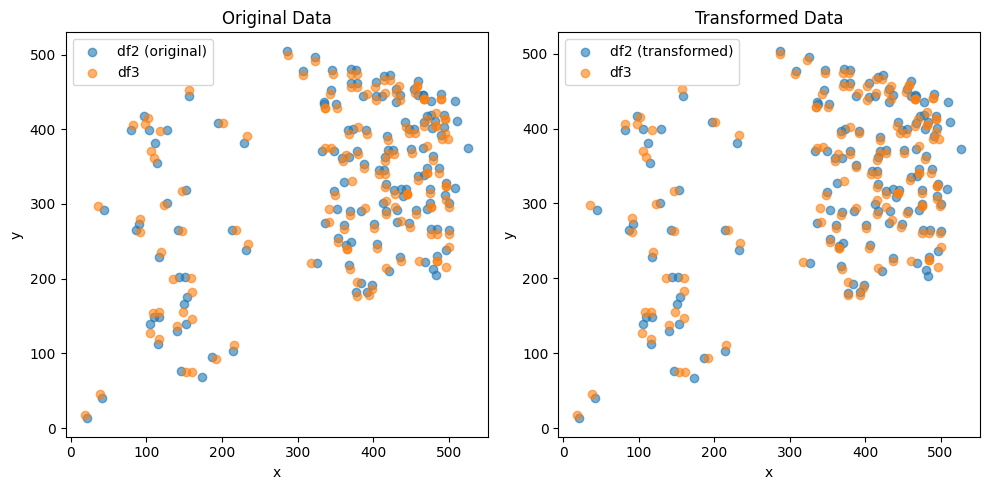

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.225882621443496e-06 , 1.575170131824069e-05 )
Rotation (radians): 0.0038276159201134524
Transform Matrix:
 [[ 9.99992675e-01 -3.82760657e-03 -6.22588262e-06]
 [ 3.82760657e-03  9.99992675e-01  1.57517013e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


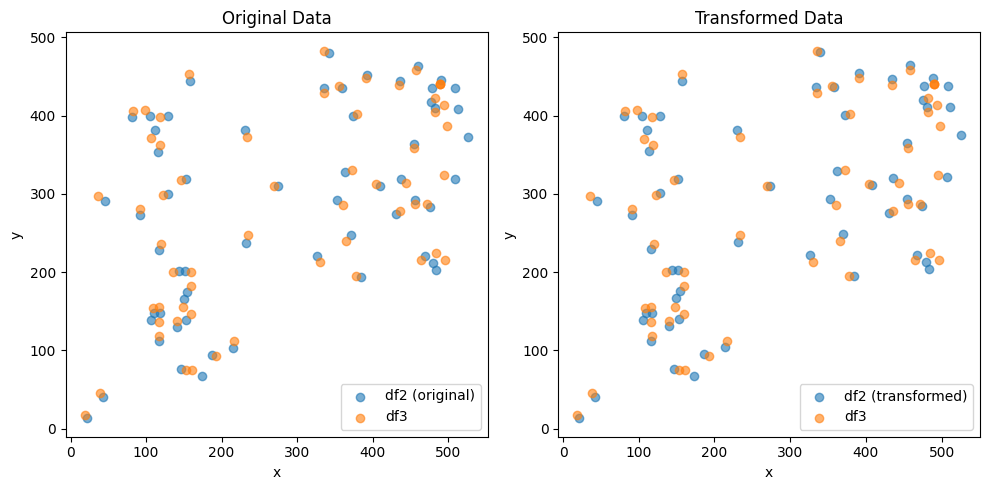

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5614921897117746e-05 , -2.8628421567377782e-05 )
Rotation (radians): -0.003827653718414157
Transform Matrix:
 [[ 9.99992675e-01  3.82764437e-03 -2.56149219e-05]
 [-3.82764437e-03  9.99992675e-01 -2.86284216e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


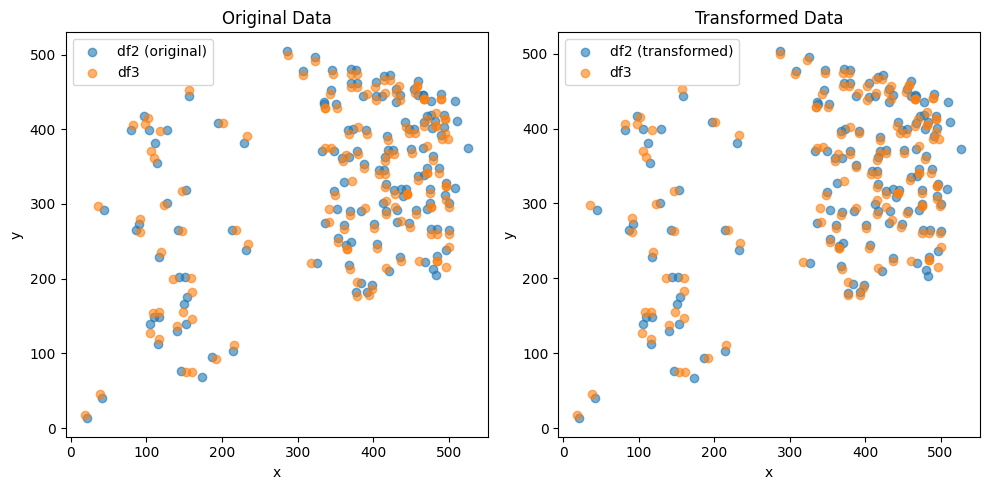

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.164390002829158e-06 , 1.5765013233251597e-05 )
Rotation (radians): 0.0038276210749673806
Transform Matrix:
 [[ 9.99992675e-01 -3.82761173e-03 -6.16439000e-06]
 [ 3.82761173e-03  9.99992675e-01  1.57650132e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


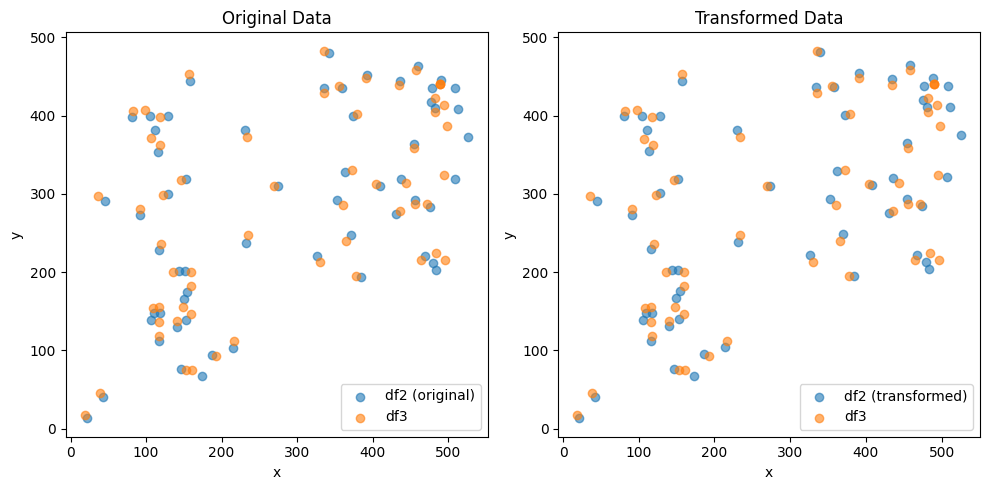

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5616313934027845e-05 , -2.8609495380094072e-05 )
Rotation (radians): -0.0038276057290547692
Transform Matrix:
 [[ 9.99992675e-01  3.82759638e-03 -2.56163139e-05]
 [-3.82759638e-03  9.99992675e-01 -2.86094954e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


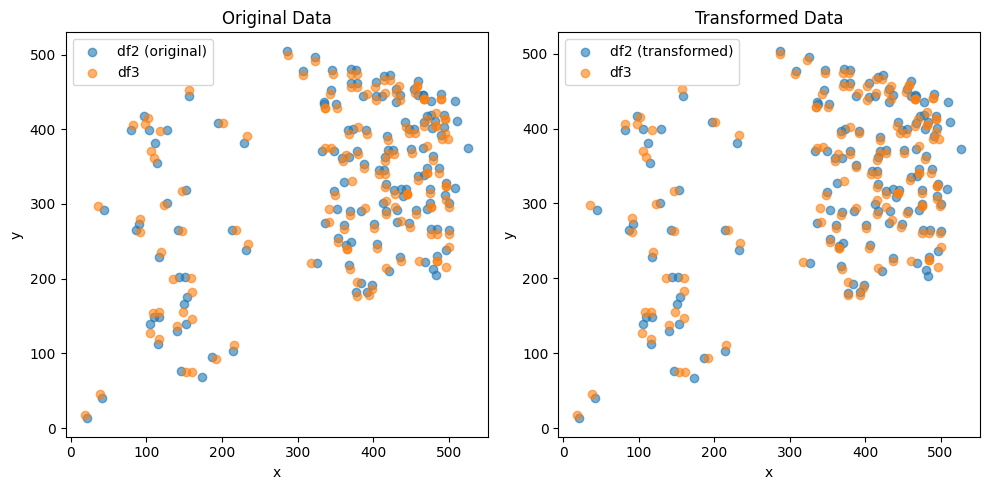

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.20967109522221e-06 , 1.574054892918552e-05 )
Rotation (radians): 0.0038275826735698635
Transform Matrix:
 [[ 9.99992675e-01 -3.82757333e-03 -6.20967110e-06]
 [ 3.82757333e-03  9.99992675e-01  1.57405489e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


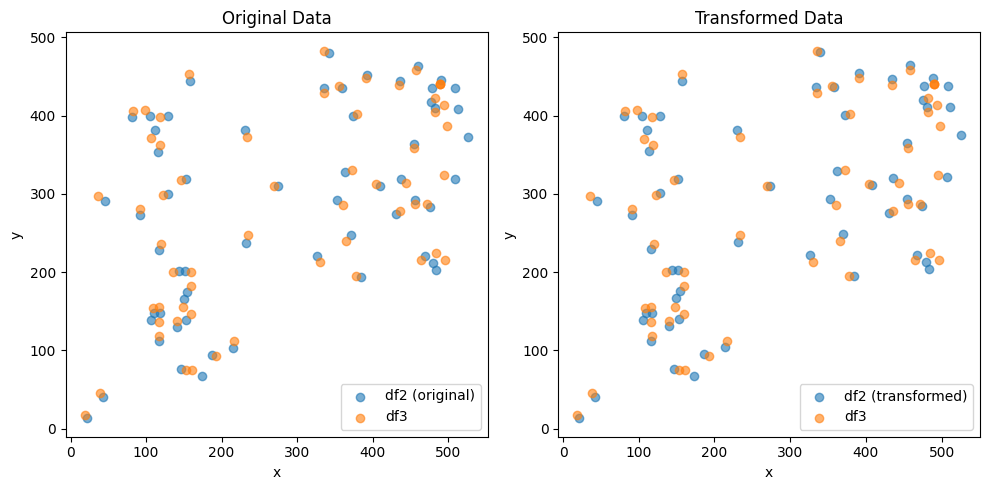

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.562001224982768e-05 , -2.8643587290206453e-05 )
Rotation (radians): -0.003827653503532153
Transform Matrix:
 [[ 9.99992675e-01  3.82764416e-03 -2.56200122e-05]
 [-3.82764416e-03  9.99992675e-01 -2.86435873e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


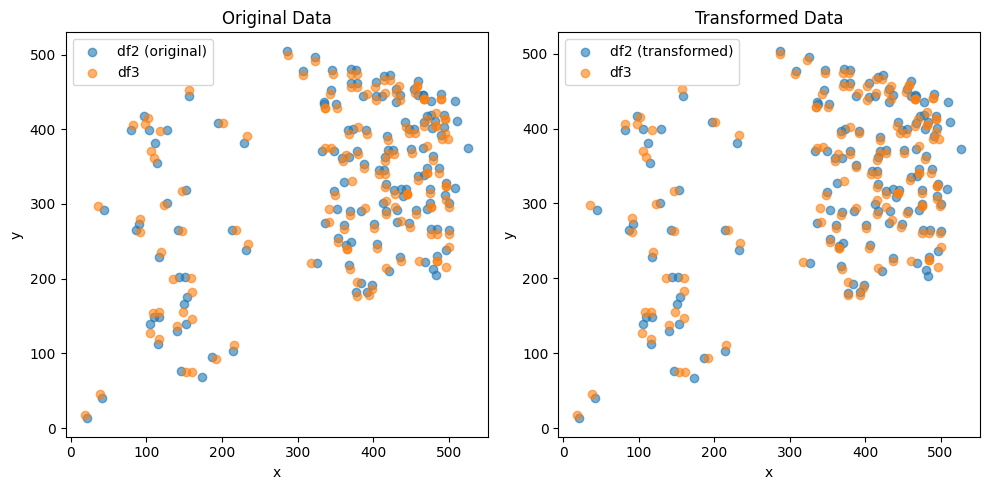

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.2064641588435e-06 , 1.5728188461435513e-05 )
Rotation (radians): 0.003827626807234229
Transform Matrix:
 [[ 9.99992675e-01 -3.82761746e-03 -6.20646416e-06]
 [ 3.82761746e-03  9.99992675e-01  1.57281885e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


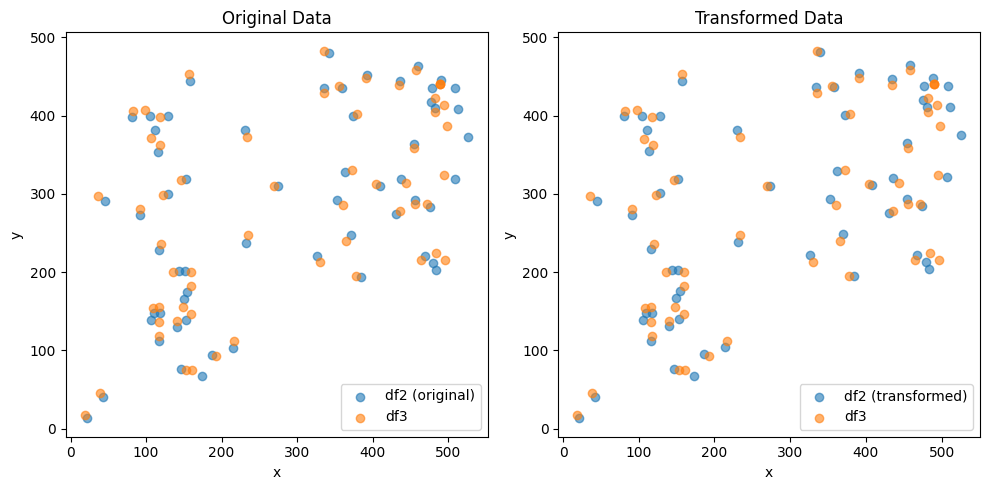

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.560759070617713e-05 , -2.8573846624858475e-05 )
Rotation (radians): -0.0038275495328289576
Transform Matrix:
 [[ 9.99992675e-01  3.82754019e-03 -2.56075907e-05]
 [-3.82754019e-03  9.99992675e-01 -2.85738466e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


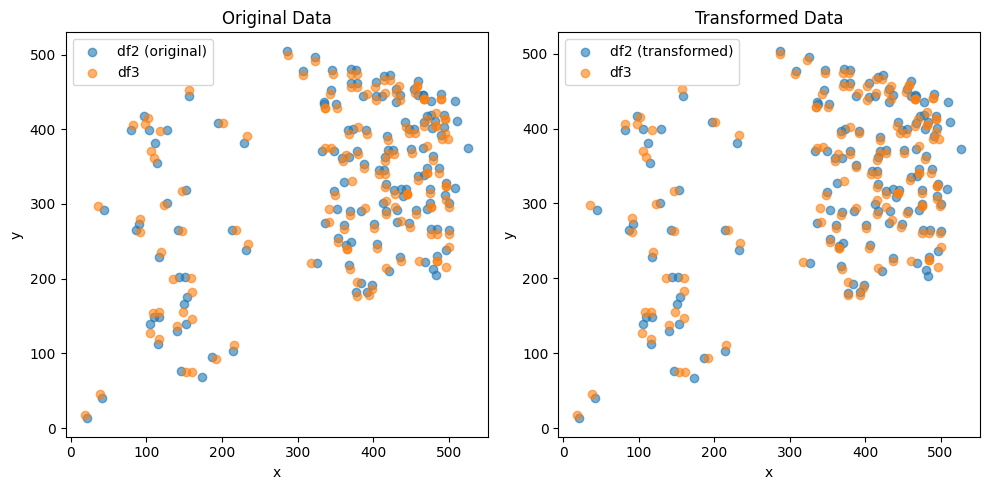

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( -6.202538898218145e-06 , 1.5783151262262594e-05 )
Rotation (radians): 0.003827537145182861
Transform Matrix:
 [[ 9.99992675e-01 -3.82752780e-03 -6.20253890e-06]
 [ 3.82752780e-03  9.99992675e-01  1.57831513e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


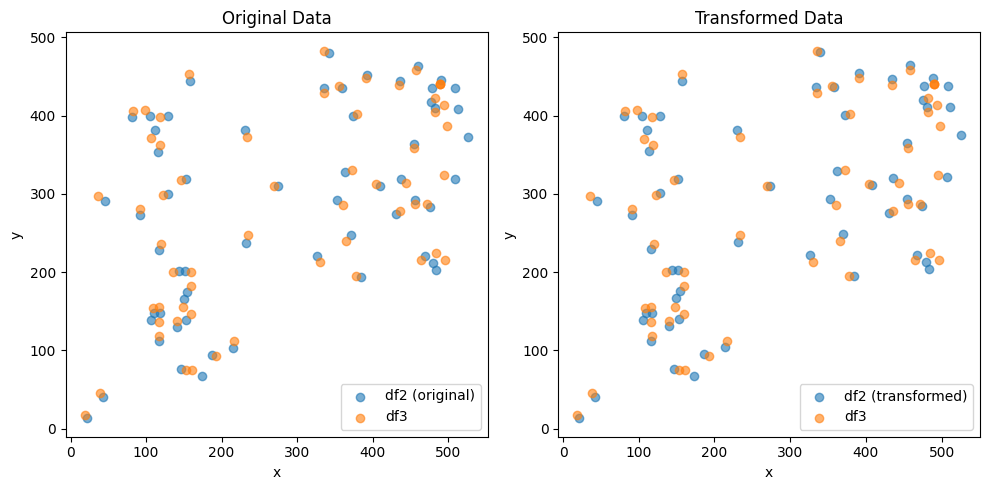

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (144,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.5548023678522677e-05 , -2.8610931744215584e-05 )
Rotation (radians): -0.003827701767991567
Transform Matrix:
 [[ 9.99992674e-01  3.82769242e-03 -2.55480237e-05]
 [-3.82769242e-03  9.99992674e-01 -2.86109317e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


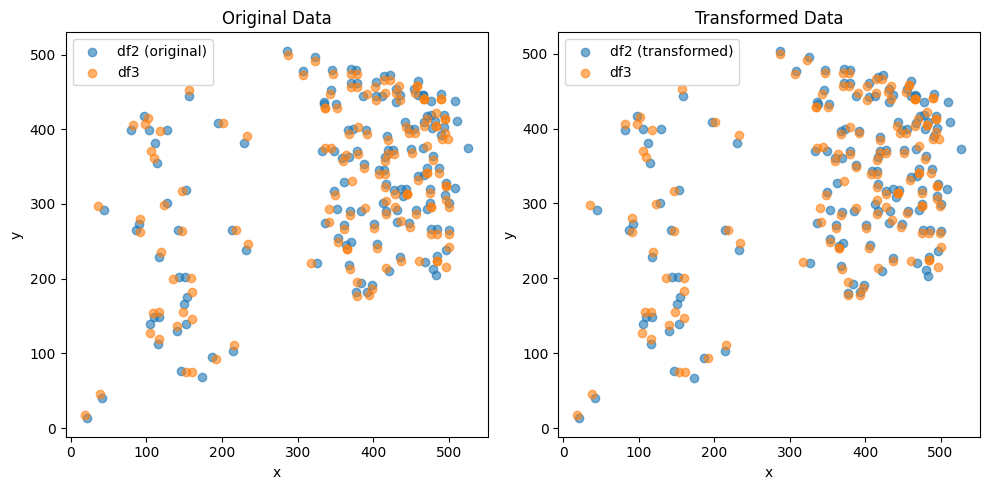

              0           1
0    328.694522  323.667610
1    325.272978  422.783205
2    409.364272  360.253221
3    312.391033  255.743270
4     57.472177   54.043426
..          ...         ...
995  198.369952  201.823664
996  335.943550  435.403031
997   54.403772  378.975746
998  289.414610  449.693144
999  246.138580  202.960044

[1000 rows x 2 columns]


In [89]:
dist_min = 5  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

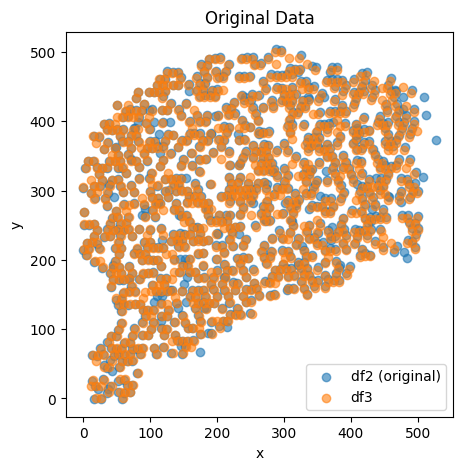

In [90]:
plt.figure(figsize=(5, 5))

plt.scatter(data2_spatial_results[0], data2_spatial_results[1], label='df2 (original)', alpha=0.6)
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], label='df3', alpha=0.6)
plt.title('Original Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()



C:\Users\28123\AppData\Local\Temp\ipykernel_16672\3497988853.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     328.694522     323.667610           0                1             -1   
1     325.272978     422.783205           1                9             -1   
2     409.364272     360.253221           2                6             -1   
3     312.391033     255.743270           3               11             -1   
4      57.472177      54.043426           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       328.834356       320.512821             0                  1   
1       323.926380       419.604701             1                  9   
2       407.770961       357.905983             2                  6   
3       309.611452       257.211538           693                 12   
4        58.077710        54.754274             4                  5   

   matabolic.CCA.Z 

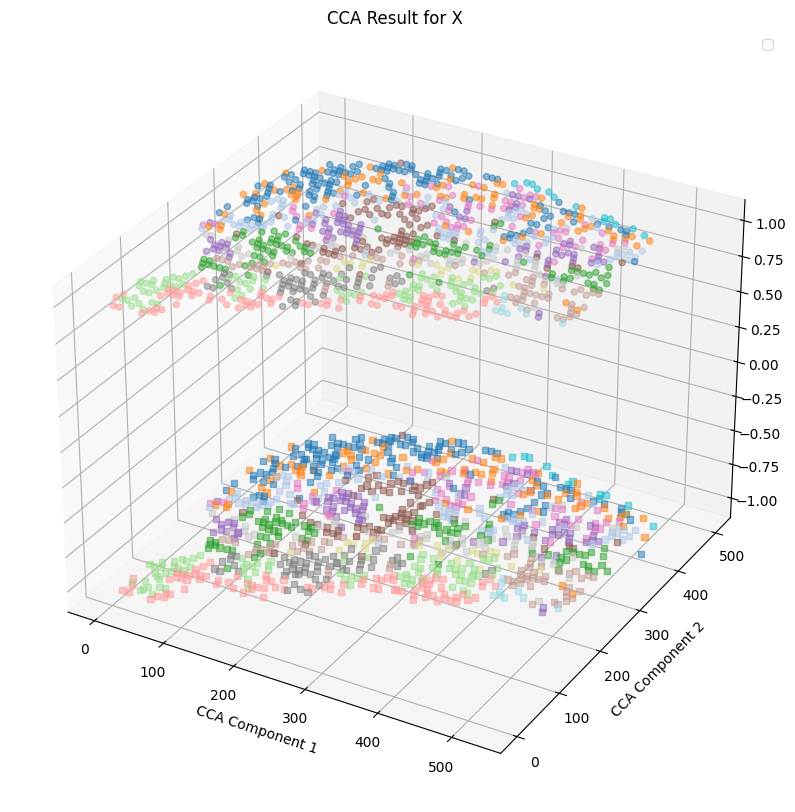

In [91]:
Y_c = data2_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()


In [92]:
same_values_mask_fine = pairs['spatial_cluster'] == pairs['matabolic_cluster']

# 计算相同值的个数
same_values_count_fine = same_values_mask_fine.sum()
same_values_count_fine

936

In [93]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\no_anchorpair_run2.csv", index=False)

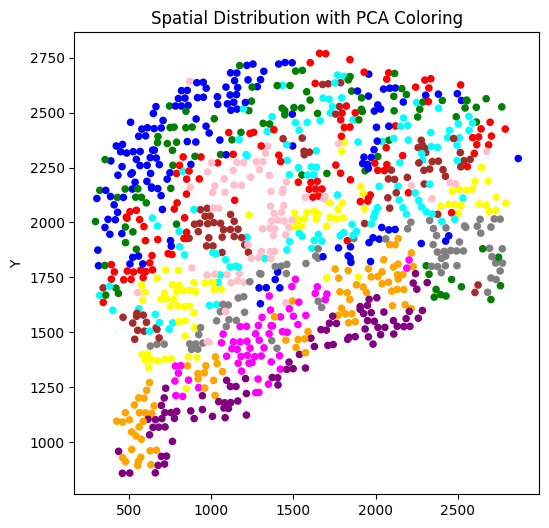

In [94]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\furtheralignment.pdf")
plt.show()


In [95]:
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
Accruracy_furtheralignment = same_values_count_fine

In [96]:
dist_min = 2 ## min euclidean distance
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
row_indices, col_indices = np.where(distances <dist_min)
unique_row_indices = np.unique(row_indices)
unique_col_indices = np.unique(col_indices)
#############plot
####Z_C is metablic and is at 1
Y_C_=Y_c.iloc[col_indices,]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_=Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_=Y_C_.drop(columns=['index'])
Y_C_=Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})

Z_C_=Z_c.iloc[row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})

pairs = pd.concat([Y_C_,Z_C_],axis=1)
pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  
print(pairs.head())


def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    # 保存每个 X1 中值对应的 X2 中值的列表
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()

    # 计算每个 X1 中值的辛普森指数
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)

    # 保存每个 X1 中值对应的 X2 中出现频率最高的值
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))

    # 生成新的 DataFrame
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})

    # 合并 X3 列
    new_df = pd.merge(new_df, df[['spatial_ID',"spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')

    return new_df

# 示例输入数据
data = pairs
df = pd.DataFrame(data)

# 调用主函数
result_df = main(df)
result_df

   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0      57.472177      54.043426           4                5             -1   
1     349.667438     277.810864           6               12             -1   
2       0.605300     250.906291           9                0             -1   
3      99.239997     371.102611          12                2             -1   
4     146.014916     300.885823          17                6             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        58.077710        54.754274             4                  5   
1       349.079755       275.908120             6                 12   
2         0.613497       251.869658             9                  0   
3        98.568507       370.726496            12                  2   
4       146.830266       299.412393            17                  6   

   matabolic.CCA.Z  distance  
0                1  0.933795  
1                1  1.991433  

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\237650377.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_16672\237650377.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


,spatial_ID,Most_freq_metabolic_cluster,Simpson_Index,spatial_cluster
0,4,5,0.0,5
1,6,12,0.0,12
2,9,0,0.0,0
3,12,2,0.0,2
4,17,6,0.0,6
...,...,...,...,...
487,993,5,0.0,5
488,994,11,0.0,11
489,995,12,0.0,12
490,997,0,0.0,0


<bound method NDFrame.head of      spatial_ID  Most_freq_metabolic_cluster  Simpson_Index  spatial_cluster
0             4                            5            0.0                5
1             6                           12            0.0               12
2             9                            0            0.0                0
3            12                            2            0.0                2
4            17                            6            0.0                6
..          ...                          ...            ...              ...
487         993                            5            0.0                5
488         994                           11            0.0               11
489         995                           12            0.0               12
490         997                            0            0.0                0
491         999                           10            0.0               10

[492 rows x 4 columns]>
     spatial_ID  Most

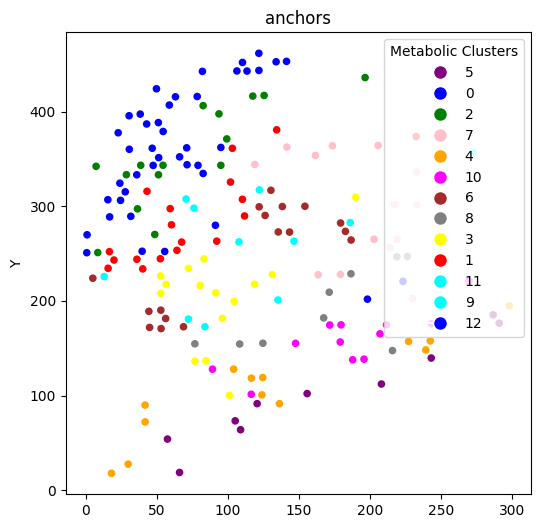

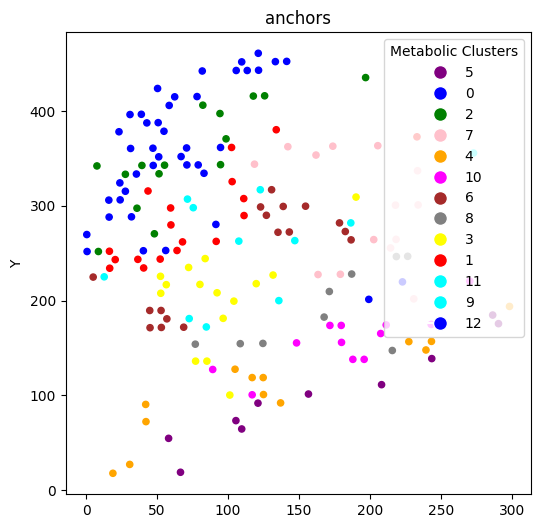

In [97]:
###### find transcript-metaboic pairs anchors by filtering: 
######1/simpson index less than 0.2 2/Most_freq_metabolic_cluster==matabolic_cluster
print(result_df.head)
#print(pairs.head)
merged_df = pd.merge(result_df, pairs, on='spatial_ID', how='inner')
merged_df = pd.DataFrame(merged_df)
print(merged_df)
merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) &(merged_df['distance'] < 1) ]
#merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) & (merged_df['Most_freq_metabolic_cluster'] == merged_df['matabolic_cluster'])&(merged_df['distance'] < 0.5) ]
merged_df = merged_df.drop_duplicates(subset="matabolic_ID")
print(merged_df["spatial_ID"])

plt.figure(figsize=(6, 6))
plt.scatter(data2_spatial_results.iloc[merged_df["spatial_ID"], 0],data2_spatial_results.iloc[merged_df["spatial_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_spatial.pdf")
plt.show()

plt.figure(figsize=(6, 6))
plt.scatter(data3_spatial_results.iloc[merged_df["matabolic_ID"], 0],data3_spatial_results.iloc[merged_df["matabolic_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_metabolic.pdf")
plt.show()


In [98]:
def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix
scaler = MinMaxScaler(feature_range=(-1, 1))
DF1 = convert_to_array(adata2.X)
DF1 = pd.DataFrame(DF1)
DF1 = tpm_normalize(DF1)
DF1 = np.log2(DF1 + 1)
#DF1 = scaler.fit_transform(DF1)
DF1 = pd.DataFrame(DF1)

DF2 = convert_to_array(adata1.X)
DF2 = pd.DataFrame(DF2)
DF2 = tpm_normalize(DF2)
#DF2 = scaler.fit_transform(DF2)
DF2 = np.log2(DF2+1)
DF2 = pd.DataFrame(DF2)

print(DF1.shape,DF2.shape)
spatial_ID_list = merged_df['spatial_ID'].tolist()
metabolic_ID_list = merged_df['matabolic_ID'].tolist()

# 从 DF1 和 DF2 中提取对应的样本
spatial_samples = DF1.loc[spatial_ID_list,:]
index_strings = adata2.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(spatial_samples.columns, index_strings)}
spatial_samples.rename(columns=column_mapping, inplace=True)
rowindex = spatial_samples.shape[0]
spatial_samples.index = range(rowindex)

metabolic_samples = DF2.loc[metabolic_ID_list,:]
rowindex = metabolic_samples.shape[0]
index_strings = adata1.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(metabolic_samples.columns, index_strings)}
metabolic_samples.rename(columns=column_mapping, inplace=True)
metabolic_samples.index = range(rowindex)

print(spatial_samples.shape,metabolic_samples.shape,pd.concat([spatial_samples, metabolic_samples], axis=0).shape)
# 计算特征之间的相关性

(1000, 2500) (1000, 2499)
(176, 2500) (176, 2499) (352, 4999)


(176, 4999)


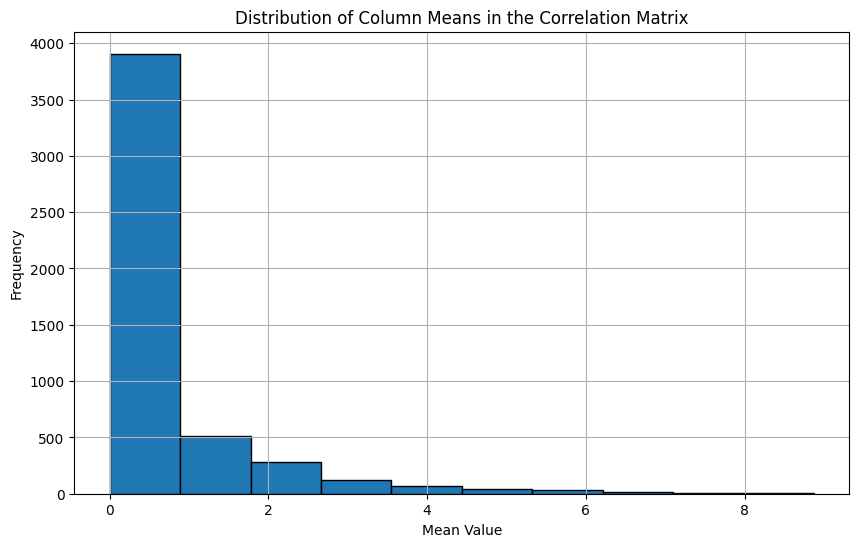

DF1 列变量与 DF2 列变量之间的相关性矩阵：


In [99]:
correlation_matrix = pd.concat([spatial_samples, metabolic_samples], axis=1)
print(correlation_matrix.shape)
column_means = correlation_matrix.mean(axis=0)
plt.figure(figsize=(10, 6))
plt.hist(column_means, bins=10, edgecolor='black')
plt.title('Distribution of Column Means in the Correlation Matrix')
plt.xlabel('Mean Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
correlation_matrix = correlation_matrix.corr()
# 显示相关性矩阵
print("DF1 列变量与 DF2 列变量之间的相关性矩阵：")

# 显示 DF3
#print(DF3)

(2500, 2499)


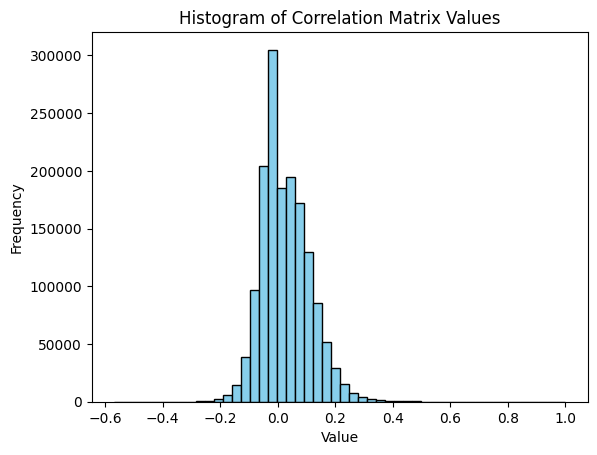

In [100]:
correlation_matrix2 = correlation_matrix.iloc[:2500, -2499:]
print(correlation_matrix2.shape)

values = correlation_matrix2.values.flatten()
plt.hist(values, bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Matrix Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 显示图形
plt.show()
high_correlation_spatial = []
high_correlation_metabolic = []



In [101]:
import pandas as pd
import numpy as np

# Example correlation matrix with NaN values
correlation_matrix2[correlation_matrix2 > 0.95] = np.nan
# Flatten the correlation matrix and keep track of the row and column indices, excluding NaNs
flattened = correlation_matrix2.values.flatten()
non_nan_indices = ~np.isnan(flattened)
flattened_non_nan = flattened[non_nan_indices]
original_indices = np.dstack(np.unravel_index(np.where(non_nan_indices)[0], correlation_matrix2.shape))[0]

# Sort the non-NaN flattened array to find the top 20 highest values
sorted_indices = np.argsort(flattened_non_nan)[::-1]
top_n = 200
top_indices = original_indices[sorted_indices[:top_n]]

# Retrieve the corresponding row and column indices
top_rows = top_indices[:, 0]
top_cols = top_indices[:, 1]

# Get the top 20 highest values
top_values = flattened_non_nan[sorted_indices[:top_n]]

# Convert to lists if needed
top_rows = list(top_rows)
top_cols = list(top_cols)
top_values = list(top_values)

# Display results
print("Top 20 highest correlation values (excluding NaNs):")
for i in range(len(top_values)):
    print(f"Value: {top_values[i]}, Row: {top_rows[i]}, Column: {top_cols[i]}")

# Optionally, convert to a DataFrame for easier viewing
top_correlations_df = pd.DataFrame({
    'Value': top_values,
    'Row': top_rows,
    'Column': top_cols
})

print("\nTop 20 highest correlation values in DataFrame format:")
print(top_correlations_df)

unique_top_correlations_df = top_correlations_df.drop_duplicates(subset=['Column'])
unique_top_correlations_df = unique_top_correlations_df.drop_duplicates(subset=['Row'])
# 转换为列表（如果需要）
unique_top_rows = list(unique_top_correlations_df['Row'])
unique_top_cols = list(unique_top_correlations_df['Column'])
unique_top_values = list(unique_top_correlations_df['Value'])

print("\nTop correlation values in DataFrame format (unique pairs):")
print(unique_top_correlations_df)


Top 20 highest correlation values (excluding NaNs):
Value: 0.9368004076969378, Row: 433, Column: 58
Value: 0.9304760492846603, Row: 2341, Column: 1348
Value: 0.9206682446451244, Row: 231, Column: 2300
Value: 0.9150821424464131, Row: 1591, Column: 59
Value: 0.9108080474753735, Row: 1661, Column: 1681
Value: 0.9075305275500113, Row: 467, Column: 1445
Value: 0.8941082281812938, Row: 1529, Column: 685
Value: 0.8707569555473255, Row: 240, Column: 2496
Value: 0.8666044043064777, Row: 1634, Column: 440
Value: 0.854080654416565, Row: 872, Column: 31
Value: 0.8536357628677711, Row: 444, Column: 560
Value: 0.8536357628677711, Row: 2349, Column: 560
Value: 0.8536357628677711, Row: 1329, Column: 560
Value: 0.8521153884401196, Row: 1806, Column: 763
Value: 0.8482029208144485, Row: 1572, Column: 904
Value: 0.8482029208144485, Row: 1572, Column: 846
Value: 0.8482029208144485, Row: 1572, Column: 51
Value: 0.8481466266216057, Row: 2341, Column: 1362
Value: 0.8462278718262453, Row: 2422, Column: 539
Val

In [102]:
import numpy as np
import matplotlib.pyplot as plt
scaler = MinMaxScaler(feature_range=(-1, 1))
metabolic_select_high_corr_variant = convert_to_array(adata1.X)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = scaler.fit_transform(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = metabolic_select_high_corr_variant.iloc[:,top_cols]
metabolic_select_high_corr_variant = pd.concat([data3_spatial_results, metabolic_select_high_corr_variant], axis=1)

spatial_select_high_corr_variant = convert_to_array(adata2.X)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = scaler.fit_transform(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = spatial_select_high_corr_variant.iloc[:,top_rows]
spatial_select_high_corr_variant = pd.concat([data2_spatial_results, spatial_select_high_corr_variant], axis=1)

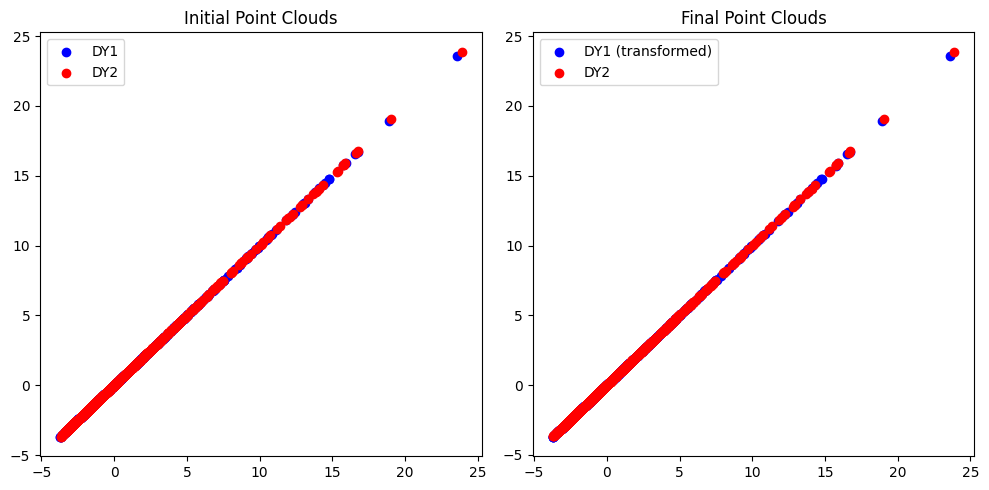

Final transformation matrix:
[[7.01660952e-17]]


In [103]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.iloc[:,2:].T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=1)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[0], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[0], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

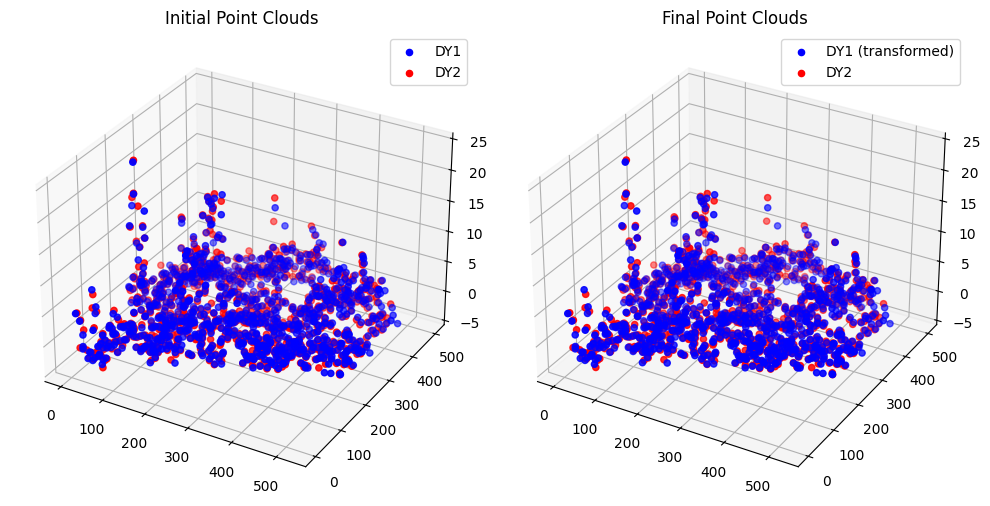

Final transformation matrix:
[[ 1.00000000e+00 -2.29740170e-16 -2.93828380e-20  5.68434189e-14]
 [ 1.21035312e-16  1.00000000e+00 -2.82074095e-18  5.68434189e-14]
 [-2.93828380e-20  2.38340342e-18  1.00000000e+00 -6.73940070e-16]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]


In [104]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
DY1CCA = DY1
DY2CCA = DY2
# Example 3D point cloud data (replace with your actual data)
DY1 = spatial_select_high_corr_variant.iloc[:,0:2].T.to_numpy()  # 3D point cloud DY1 (3 x N)
DY2 = metabolic_select_high_corr_variant.iloc[:,0:2].T.to_numpy()   # 3D point cloud DY2 (3 x M)
DY1 = np.vstack((DY1, DY1CCA))
DY2 = np.vstack((DY2, DY2CCA))

# 初始变换矩阵
transformation_matrix = np.eye(4)  # 初始变换矩阵为4x4单位矩阵

# 设置迭代参数
max_iterations = 500
tolerance = 1e-5

# 绘制初始点云
fig = plt.figure(figsize=(10, 5))

ax1 = fig.add_subplot(121, projection='3d')
ax1.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1')
ax1.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax1.set_title('Initial Point Clouds')
ax1.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)

    corresponding_target_points = DY2[:, indices]

    # Step 2: Calculate centroids
    centroid_DY1 = np.mean(DY1, axis=1, keepdims=True)
    centroid_DY2 = np.mean(corresponding_target_points, axis=1, keepdims=True)

    # Step 3: Center the points
    DY1_centered = DY1 - centroid_DY1
    DY2_centered = corresponding_target_points - centroid_DY2

    # Step 4: Compute the covariance matrix
    H = DY1_centered @ DY2_centered.T

    # Step 5: Compute the Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T

    # Step 6: Ensure a proper rotation matrix (det(R) = 1)
    if np.linalg.det(R) < 0:
        Vt[2, :] *= -1
        R = Vt.T @ U.T

    # Step 7: Compute the translation vector
    t = centroid_DY2 - R @ centroid_DY1

    # Step 8: Form the transformation matrix
    transformation = np.eye(4)
    transformation[:3, :3] = R
    transformation[:3, 3] = t.flatten()

    # Step 9: Apply the transformation
    DY1_homogeneous = np.vstack((DY1, np.ones((1, DY1.shape[1]))))
    DY1_transformed_homogeneous = transformation @ DY1_homogeneous
    DY1_transformed = DY1_transformed_homogeneous[:3, :]

    # Step 10: Update DY1|
    DY1 = DY1_transformed

    # Step 11: Check convergence
    if np.linalg.norm(transformation[:3, 3]) < tolerance:
        converged = True

    iteration += 1

# 绘制最终点云
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(DY1[0], DY1[1], DY1[2], color='blue', label='DY1 (transformed)')
ax2.scatter(DY2[0], DY2[1], DY2[2], color='red', label='DY2')
ax2.set_title('Final Point Clouds')
ax2.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

C:\Users\28123\AppData\Local\Temp\ipykernel_16672\2748365551.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 3) (1000, 3)
(1000, 1000)
(1000, 3) (1000, 3)
(1000, 3) (1000, 3)
   spatial.CCA.X  spatial.CCA.Y         2  spatial_ID  spatial_cluster  \
0     328.572826     322.003627 -2.371996           0                1   
1     325.378677     421.126856 -0.392949           1                9   
2     409.325794     358.404151  6.349390           2                6   
3     312.113521     254.116872 -3.238909           3               11   
4      56.732044      53.002801  1.678409           4                5   

   spatial.CCA.Z  metabolic.CCA.X  metabolic.CCA.Y         2  matabolic_ID  \
0             -1       328.834356       320.512821 -2.526571             0   
1             -1       323.926380       419.604701 -0.467172             1   
2             -1       407.770961       357.905983  5.311478             2   
3             -1       309.611452       257.211538 -3.155068           693   
4             -1        58.077710        54.754274  1.724423             4   

   matabolic_

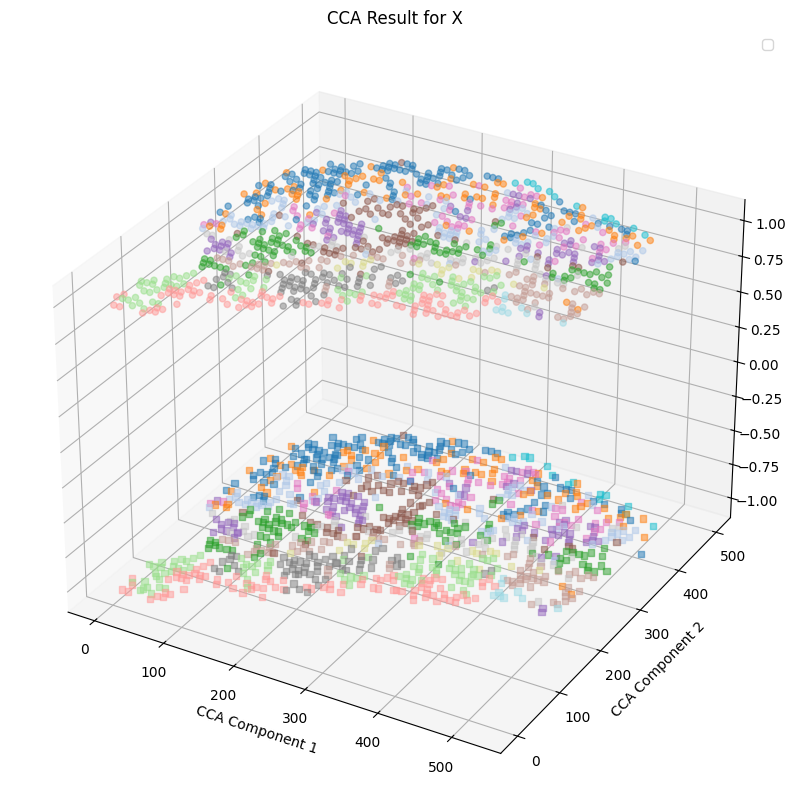

In [105]:
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
#Y_c = pd.DataFrame(G)
#Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [106]:
same_values_mask = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
Accruracy_haCCA = same_values_mask.sum()

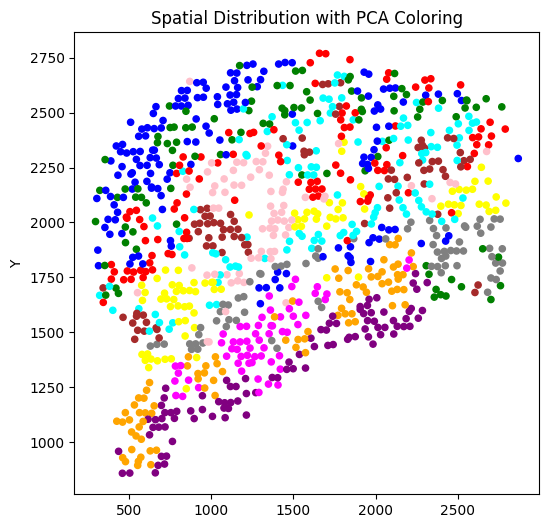

In [107]:
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\CCA_IPCalignment.pdf")
plt.show()


In [108]:
#pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\run2.csv", index=False)

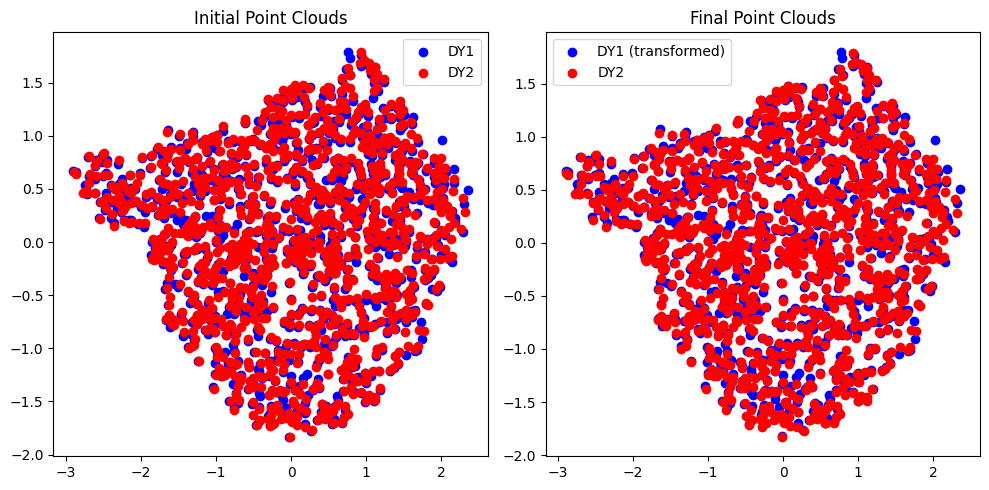

Final transformation matrix:
[[2.49800181e-18]
 [2.71727085e-17]]


In [109]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=2)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

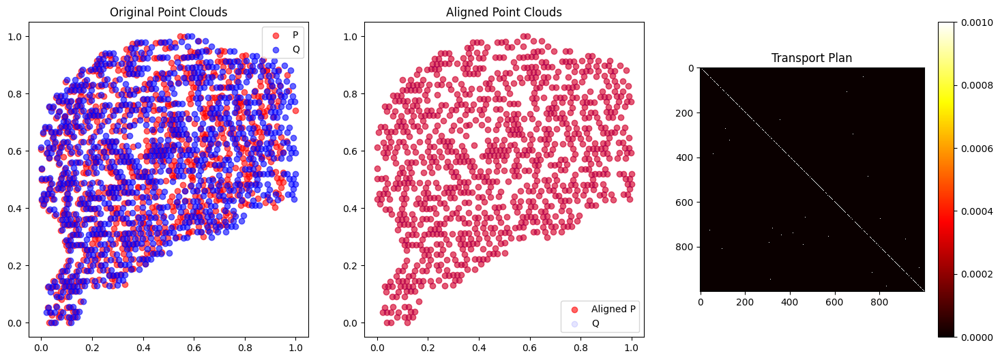

In [110]:
import numpy as np
import ot
import matplotlib.pyplot as plt

# 假设 P 和 Q 是两个点云，形状分别为 (n, d) 和 (m, d)
P = data2_spatial_results.to_numpy()  # Example DYGW1 features
Q = data3_spatial_results.to_numpy()  # Example DYGW2 features

# 特征矩阵（这里假设特征与坐标相同）
F_P = DY1CCA
F_Q = DY2CCA

# 数据标准化
scaler = StandardScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 数据归一化
scaler = MinMaxScaler()
P = scaler.fit_transform(P)
Q = scaler.fit_transform(Q)

# 计算几何距离矩阵
C_P = np.linalg.norm(P[:, None, :] - P[None, :, :], axis=2)
C_Q = np.linalg.norm(Q[:, None, :] - Q[None, :, :], axis=2)

# 计算特征距离矩阵
M = np.linalg.norm(F_P[:, None, :] - F_Q[None, :, :], axis=2)

# 初始化权重，均匀分布
a = np.ones((P.shape[0],)) / P.shape[0]
b = np.ones((Q.shape[0],)) / Q.shape[0]

# 设置平衡参数
alpha = 0.5

# 设置参数
params = {
    'max_iter': 2000,    # 增加最大迭代次数
    'tol_rel': 1e-7,     # 调整相对容差
    'tol_abs': 1e-9,     # 调整绝对容差
    'armijo': True       # 使用Armijo线搜索
}

# 计算FGW最优传输计划
pi, log = ot.gromov.fused_gromov_wasserstein(M,C_P, C_Q, a, b, alpha=alpha, log=True, **params)

# 对齐点云 P 到 Q
P_aligned = np.dot(pi, Q)
scaler = StandardScaler()
P_aligned = scaler.fit_transform(P_aligned)
scaler = MinMaxScaler()
P_aligned = scaler.fit_transform(P_aligned)


# 可视化
plt.figure(figsize=(18, 6))

# 原始点云
plt.subplot(1, 3, 1)
plt.scatter(P[:, 0], P[:, 1], color='red', label='P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.6)
plt.title('Original Point Clouds')
plt.legend()

# 对齐后的点云
plt.subplot(1, 3, 2)
plt.scatter(P_aligned[:, 0], P_aligned[:, 1], color='red', label='Aligned P', alpha=0.6)
plt.scatter(Q[:, 0], Q[:, 1], color='blue', label='Q', alpha=0.1)
plt.title('Aligned Point Clouds')
plt.legend()

# 可视化传输计划
plt.subplot(1, 3, 3)
plt.imshow(pi, cmap='hot', interpolation='nearest')
plt.title('Transport Plan')
plt.colorbar()

plt.show()


C:\Users\28123\AppData\Local\Temp\ipykernel_16672\2576077461.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0       0.641718       0.641026           0                1             -1   
1       0.647853       0.839209           1                9             -1   
2       0.815542       0.715812           2                6             -1   
3       0.619223       0.514423           3               11             -1   
4       0.116155       0.109509           4                5             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0         0.641718         0.641026            48                  3   
1         0.647853         0.839209             1                  9   
2         0.815542         0.715812             2                  6   
3         0.619223         0.514423           693                 12   
4         0.116155         0.109509             4                  5   

   matabolic.CCA.Z 

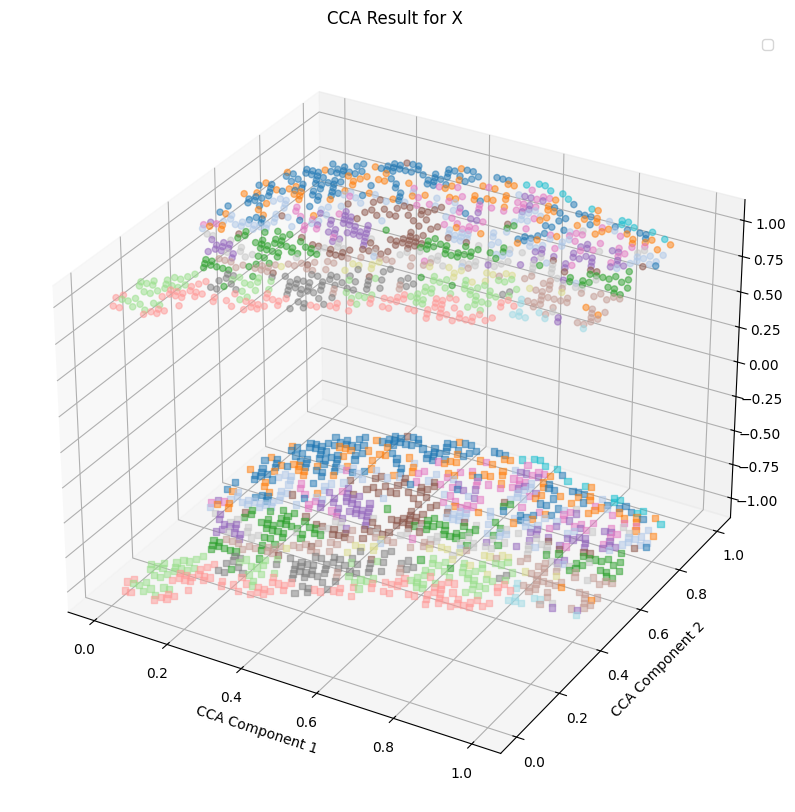

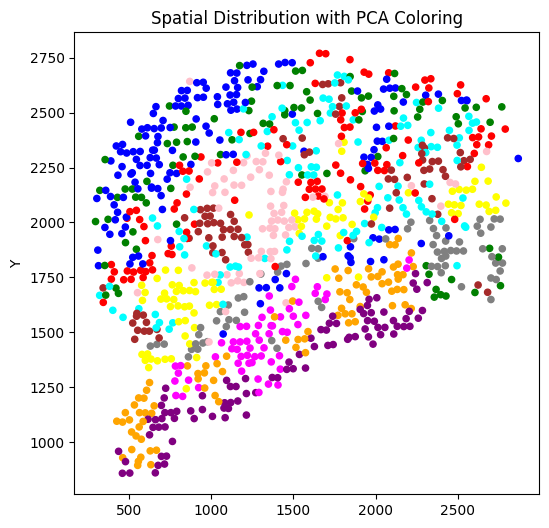

In [111]:
Y_c = pd.DataFrame(P_aligned)
Z_c = pd.DataFrame(Q)
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()
plt.figure(figsize=(6, 6))
plt.scatter(pd.DataFrame(adata2.obsm['spatial']).iloc[:, 0],pd.DataFrame(adata2.obsm['spatial']).iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
#plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\rat\\FPWalignment.pdf")
plt.show()
same_values_mask_directmerge = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count_fine = same_values_mask_directmerge.sum()
accruracy_hacca_FPWmerge = same_values_count_fine

In [112]:
print(same_values_mask.sum())
print(same_values_count_fine)
print("SOTA: ",same_values_mask.sum()-same_values_count_fine )
print("directalignment: ",accruracy_directmerge)
print("grossalignment: ",Accruracy_grossalignment)
print("furtheralignment: ",Accruracy_furtheralignment)
print("ICP",accruracy_ICP)
print("FPW",accruracy_ICP)
print("haCCA: ",Accruracy_haCCA)
print("FPWhaCCA: ",accruracy_FPWmerge)

937
865
SOTA:  72
directalignment:  632
grossalignment:  851
furtheralignment:  936
ICP 684
FPW 684
haCCA:  937
FPWhaCCA:  724
